In [1]:
import os
from collections import defaultdict

catalog = defaultdict(dict)
with open('catalog.txt', 'r') as file:
    k = 0
    for line in file:
        
        line = line.replace('\n', '').split(';')
        title = line[3].lower().strip()
        fid = line[8]
        author = line[0].lower().strip()
        if title in catalog and author in catalog[title]:
            k += 1
        catalog[title].update({author: fid})

In [2]:
FICTION_TAGS = {
    "det_action",
    "detective",
    "det_irony",
    "det_history",
    "det_classic",
    "det_crime",
    "det_hard",
    "det_political",
    "det_police",
    "det_maniac",
    "det_su",
    "thriller",
    "det_espionage",
    
    "children",
    "child_det",
    "foreign_children",
    "child_classical",
    "child_prose",
    "child_tale_rus",
    "child_tale",
    "child_sf",
    
    "love_history",
    "love_short",
    "love_sf",
    "love",
    "love_detective",
    "love_contemporary",
    
    "adv_story",
    "adv_indian",
    "adv_history",
    "adv_maritime",
    "adventure",
    "adv_modern",
    "child_adv",
    "adv_animal",
    "adv_geo",
    "tale_chivalry",
    
    "gothic_novel",
    "foreign_prose",
    "prose_history",
    "prose_classic",
    "literature_18",
    "literature_19",
    "literature_20",
    "prose_counter",
    "prose_magic",
    "story",
    "prose",
    "prose_military",
    "great_story",
    "prose_rus_classic",
    "prose_su_classic",
    "prose_contemporary",
    "foreign_antique",
    "prose_abs",
    "prose_neformatny",
    "epistolary_fiction",
    
    "fanfiction",
    
    "sf_history",
    "sf_action",
    "sf_heroic",
    "sf_fantasy_city",
    "sf_detective",
    "sf_cyberpunk",
    "sf_space",
    "sf_litrpg",
    "sf_mystic",
    "fairy_fantasy",
    "sf",
    "sf_postapocalyptic",
    "russian_fantasy",
    "modern_tale",
    "sf_social",
    "sf_stimpank",
    "sf_technofantasy",
    "sf_horror",
    "sf_etc",
    "sf_fantasy",
    "hronoopera",
    "sf_epic",
    "sf_humor",
    
    "fork_tale",
    
    "humor_prose"
}

In [2]:
import json

all_genres = json.load(open("all genres.json"))

In [2]:
import os
import re
import zipfile
from tqdm import tqdm


In [4]:
dir_out1 = 'plain_fiction_cut'
dir_out2 = 'plain_nonfiction_cut'
MARGIN = 3000
MIN_SIZE = 14000
MAX_SIZE = 60000

if not os.path.exists(dir_out1):
    os.makedirs(dir_out1)
if not os.path.exists(dir_out2):
    os.makedirs(dir_out2)

In [6]:
min_len = 0
lengths = []
fiction = 0
nonfiction = 0
no_author = 0
tie  = 0
found = 0
not_found = 0
fid_to_title = {}
no_genre = []
with zipfile.ZipFile('plain_texts.zip') as z:
    for filename in tqdm(z.namelist()[1:]):
        
        with z.open(filename) as book:
            content = book.read().decode('utf8').strip()
            content = content.replace('?..', '?').replace('!..', '!').replace('...', '…').replace('--', '–')
            content = re.sub('[…]+', ' … ', content)
            content = re.sub('\s+', ' ', content)
            content = re.sub('[_]+', '_', content)
            content = re.sub('[\n]+', ' \n ', content)
            content = re.sub('[*]+', '*', content)
            content = re.sub('\xa0', ' ', content)
                        
            if len(content) < MIN_SIZE + MARGIN:
                lengths.append(len(content))
                min_len += 1
                continue
                
            title = filename.replace('plain_texts/', '').replace('plain', '')
            if title in catalog:
                possible_authors = []
                for author in catalog[title]:
                    if author != '' and author in content[:500].lower():
                        possible_authors.append(author)
                if not possible_authors:
                    no_author += 1
                    continue
                elif len(possible_authors) > 1:
                    tie += 1
                else:
                    found += 1
                fid = catalog[title][possible_authors[0]]
                fid_to_title[fid] = title
            else:
                not_found += 1
                continue
                
            cur = MARGIN
            while content[cur].isalpha() and content[cur-1].isalpha():
                cur += 1
            content = content[cur:].strip()
            
            if len(content) > MAX_SIZE:
                cur = MAX_SIZE
                next_char = content[cur]
                while next_char.isalpha() and len(content) > cur:
                    next_char = content[cur]
                    cur += 1
                content = content[:cur]
        
        if fid not in all_genres:
            no_genre.append(fid)
            continue
            
        for g in all_genres[fid]:
            if g in FICTION_TAGS:
                d = dir_out1
                fiction += 1
                break
        else:
            nonfiction += 1
            d = dir_out2
        with open(os.path.join(d, title), 'w') as book:
            book.write(content)

100%|██████████| 44843/44843 [40:25<00:00, 18.49it/s]  


In [11]:
nonfiction

5685

In [12]:
fiction

31587

In [16]:
no_author, not_found, len(no_genre), min_len

(290, 156, 61, 7064)

In [4]:
import subprocess
import os
import time

In [21]:
dir_in = 'plain_fiction_cut'
dir_out = 'plain_fiction_lemmatized_cut'

In [23]:
%%time
processes = set()
max_processes = 8

if not os.path.exists(dir_out):
    os.makedirs(dir_out)
n=0
for f in tqdm(sorted(os.listdir(dir_in))):
    json_file_name = os.path.join(dir_out, f + ".txt")
    if not os.path.isfile(json_file_name):
        processes.add(subprocess.Popen(["./mystem", "--format=text", "-wnld", os.path.join(dir_in, f), json_file_name]))
        while len(processes) >= max_processes:
            time.sleep(0.2)
            processes.difference_update(
                [p for p in processes if p.poll() is not None])
        n+=1

for p in processes:
    if p.poll() is None:
        p.wait()

100%|██████████| 31587/31587 [2:24:57<00:00,  3.63it/s]  


CPU times: user 36.1 s, sys: 8min 11s, total: 8min 47s
Wall time: 2h 24min 58s


In [3]:
from collections import Counter
from matplotlib import pyplot as plt
import plotly.graph_objects as go
%matplotlib inline

In [6]:
c = Counter((g for f in all_genres for g in all_genres[f])).most_common(50)

In [7]:
data = [go.Bar(
            x = [x[0] for x in c],
            y = [x[1] for x in c],
            marker= dict(colorscale='Jet',
                         color = [x[1] for x in c]
                        ),
                
    )]

layout = go.Layout(
    title='Top 50 genre frequencies',
)

fig = go.Figure(data=data, layout=layout)
fig.update_xaxes(tickangle=300, tickfont=dict(family='Rockwell', color='black', size=13))
fig

In [9]:
dir_in = 'plain_fiction_lemmatized_cut'

In [5]:
from random import choice
from string import ascii_lowercase

In [ ]:
for f in tqdm(os.listdir(dir_in)):
    names = {}
    try:
        newname = f.replace('.txt', '')))
        if newname in names:
            newname += ''.join(choice(ascii_lowercase) for i in range(7))
        os.rename(os.path.join(dir_in, f), os.path.join(dir_in, newname))
    except:
        print(f, newname)
        continue

In [10]:
for f in tqdm(os.listdir(dir_in)):
    names = {}
    try:
        newname = '_'.join(re.findall('[\w\-\.]+', f.replace('.txt', '')))
        if newname in names:
            newname += ''.join(choice(ascii_lowercase) for i in range(7))
        os.rename(os.path.join(dir_in, f), os.path.join(dir_in, newname))
    except:
        print(f, newname)
        continue

 49%|████▉     | 15419/31587 [00:00<00:00, 36880.43it/s]

¥.txt .


100%|██████████| 31587/31587 [00:00<00:00, 40157.87it/s]


In [11]:
os.rename(os.path.join(dir_in, '¥.txt'), os.path.join(dir_in, 'иен.txt'))

In [12]:
with open('wv_fiction.txt', 'w') as f1:
    for f in tqdm(sorted(os.listdir(dir_in))):
        with open(os.path.join(dir_in, f)) as doc:
            tokens = [l.lower() for l in re.findall('\w+', doc.read().replace('\n', ' '))]
            doc_voc = Counter(tokens)
            s = ' '.join(f'{w}:{c}' for w, c in sorted(doc_voc.items()))
            f1.write(f'{f} {s}\n')

100%|██████████| 31586/31586 [04:26<00:00, 118.32it/s]


In [163]:
# chunks
from natasha import NamesExtractor

for file in sorted(os.listdir('plain_fiction_cut')[1]):
    with open(os.path.join('plain_fiction_cut', file)) as f:
        print(file)
        text = f.read()
        extractor = NamesExtractor()
        matches = extractor(text)
        k = 0
        for match in matches:
            start, end = match.span.start, match.span.stop
            print(text[start-k:end-k])
            text = text[0: start-k] + text[end-k:]
            k += end - start
    break

FileNotFoundError: [Errno 2] No such file or directory: 'plain_fiction_cut/ '

In [166]:
from natasha import NamesExtractor
text='Я мгновенно напряглась – не дай Бог сюда притащат, они ведь могут, я знаю … – Маша, почему не говорила, что у тебя такие милые соседи?'
extractor = NamesExtractor()
matches = extractor(text)
matches

Matches('Я мгновенно напряглась - не дай Бог сюда притащат, они ведь могут, я знаю … - Маша, почему не говорила, что у тебя такие милые соседи?',
        [])

In [112]:
#! ./mystem --format=text -wgnlid ./plain_fiction_cut/#сосед ./off

In [6]:
def chunks(l, n):
    for i in range(0, len(l), n):
        yield l[i:i + n]

In [119]:
dir_in = 'plain_fiction_cut'
dir_out = 'plain_fiction_cut_chunks'
try:
    os.mkdir(os.path.join(dir_out))
except:
    pass
for name in tqdm(os.listdir(dir_in)):
    with open(os.path.join(dir_in, name)) as f:
        text = f.read().split(' ')
        for i, chunk in enumerate(chunks(text, 1000)):
            with open(os.path.join(dir_out, name + f'_{i}'), 'w') as ff:
                ff.write(' '.join(chunk))

100%|██████████| 31587/31587 [01:16<00:00, 414.22it/s]


In [167]:
# %%time
# dir_in = 'plain_fiction_cut_chunks'
# dir_out = 'plain_fiction_cut_chunks_mystem'
# processes = set()
# max_processes = 8

# if not os.path.exists(dir_out):
#     os.makedirs(dir_out)
# n=0
# for f in tqdm(sorted(os.listdir(dir_in))):
#     json_file_name = os.path.join(dir_out, f + ".txt")
#     if not os.path.isfile(json_file_name):
#         processes.add(subprocess.Popen(["./mystem", "--format=text", "-wgnlid", os.path.join(dir_in, f), json_file_name]))
#         while len(processes) >= max_processes:
#             time.sleep(0.2)
#             processes.difference_update(
#                 [p for p in processes if p.poll() is not None])
#         n+=1

# for p in processes:
#     if p.poll() is None:
#         p.wait()

 56%|█████▌    | 162426/289928 [9:10:58<8:57:43,  3.95it/s] 

KeyboardInterrupt: 

In [36]:
%%time
dir_in = 'plain_fiction_cut'
dir_out = 'plain_fiction_cut_mystem'
processes = set()
max_processes = 8

if not os.path.exists(dir_out):
    os.makedirs(dir_out)
n=0
for f in tqdm(sorted(os.listdir(dir_in))):
    json_file_name = os.path.join(dir_out, f + ".txt")
    if not os.path.isfile(json_file_name):
        processes.add(subprocess.Popen(["./mystem", "--format=text", "-wgnlid", os.path.join(dir_in, f), json_file_name]))
        while len(processes) >= max_processes:
            time.sleep(0.2)
            processes.difference_update(
                [p for p in processes if p.poll() is not None])
        n+=1

for p in processes:
    if p.poll() is None:
        p.wait()

100%|██████████| 2/2 [00:02<00:00,  1.24s/it]

CPU times: user 40 ms, sys: 56.2 ms, total: 96.2 ms
Wall time: 2.54 s


In [101]:
import nltk
nltk.download("stopwords")

from nltk.corpus import stopwords 
russian_stopwords = set(stopwords.words("russian"))

/home/artesby/anaconda3/envs/myenv/lib/python3.7/site-packages/nltk/decorators.py:68: DeprecationWarning:

`formatargspec` is deprecated since Python 3.5. Use `signature` and the `Signature` object directly

/home/artesby/anaconda3/envs/myenv/lib/python3.7/site-packages/nltk/lm/counter.py:15: DeprecationWarning:

Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated, and in 3.8 it will stop working

/home/artesby/anaconda3/envs/myenv/lib/python3.7/site-packages/nltk/lm/vocabulary.py:13: DeprecationWarning:

Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated, and in 3.8 it will stop working

[nltk_data] Downloading package stopwords to
[nltk_data]     /home/artesby/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [449]:
%%time
import os
dir_in = 'plain_fiction_cut_mystem'
dir_out = 'plain_fiction_cut_chunks_processed'

df = Counter()
if not os.path.exists(dir_out):
    os.makedirs(dir_out)
i=0
for name in tqdm(sorted(os.listdir(dir_in))):
    with open(os.path.join(dir_in, name)) as f:
        s = set()
        for line in f:
            try:
                w, r = line.split('=', 1)
                if w in s:
                    continue
                if 'имя,' in r or 'фам,' in r or 'отч,' in r:
                    continue
                if w in russian_stopwords:
                    continue
                if not r.startswith(('S,', 'S=')):
                    continue
                if len(w) < 3:
                    continue
                s.add(w)
                df[w] += 1
            except:
                continue


CPU times: user 12min 3s, sys: 5min 35s, total: 17min 39s
Wall time: 7min 59s


In [465]:
import numpy as np
D = len(os.listdir(dir_in))
def idf(x):
    return np.log(D / x)
idfs = {k:idf(v) for k, v in df.items()}

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f44c33fe0b8>]],
      dtype=object)

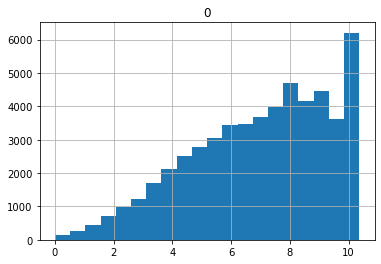

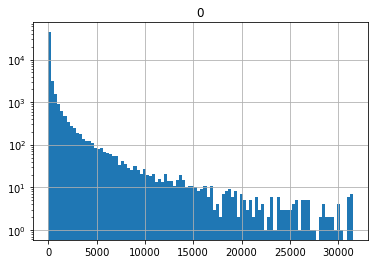

In [234]:
import pandas as pd
pd.DataFrame(idfs.values()).hist(bins=20)
pd.DataFrame([x for x in df.values()]).hist(bins=100, log=True)

In [302]:
test = ('волос цвет выглядеть зеркало отражение прическа кожа смотреться глаз ресница'.split())
for w in test:
    print(f'{w:>10} {idfs.get(w)}')
print()
test = ('бутылка секс сан грамм ром горлышко литр давать кайф этикетка'.split())
for w in test:
    print(f'{w:>10} {idfs.get(w)}')
print()
test = ('командир отряд флот командовать адмирал командование патруль подразделение состав штаб'.split())
for w in test:
    print(f'{w:>10} {idfs.get(w)}')
    

     волос 0.20956752615156643
      цвет 0.3941324719495399
 выглядеть None
   зеркало 0.8741209898809799
 отражение 1.6128311324276299
  прическа 1.739308141090147
      кожа 0.4811523858420668
смотреться None
      глаз 0.0075951743521137805
   ресница 1.548848674377827

   бутылка 0.9083130144407048
      секс 1.9927362446005608
       сан 2.6298868564611295
     грамм 2.6516413214776944
       ром 3.336741967786426
  горлышко 2.90635984437819
      литр 3.1919210252608337
    давать None
      кайф 3.190381379075241
  этикетка 3.2514387868376966

  командир 1.7551137203727154
     отряд 1.6541760823861278
      флот 2.3678942701246593
командовать None
   адмирал 3.236828137320262
командование 2.6444856558822822
   патруль 2.8583144359219443
подразделение 2.7174972869641514
    состав 1.5740442441808689
      штаб 2.486903132839329


In [311]:
%%time

dir_in = 'plain_fiction_cut_mystem'
dir_out = 'plain_fiction_cut_chunks_processed_maxdf'

if not os.path.exists(dir_out):
    os.makedirs(dir_out)
i=0
for name in tqdm(sorted(os.listdir(dir_in))):
    with open(os.path.join(dir_in, name)) as f:
        res = []
        chunk = 0
        k=0
        for line in f:
            k+= 1
            if k % 1000 == 0:
                with open(os.path.join(dir_out, name + f'_{chunk}'), 'w') as ff:
                    ff.write(' '.join(res))
                chunk += 1
                res = []
            try:
                w, r = line.split('=', 1)
                if 'имя,' in r or 'фам,' in r or 'отч,' in r:
                    raise
                if w in russian_stopwords:
                    raise
                if not r.startswith(('S,', 'S=')):
                    raise
                if not len(w) >= 3:
                    raise
                if not idfs[w] <= 6:
                    raise
                res.append(w)
            except:
                continue
        if len(res) > 100:
            with open(os.path.join(dir_out, name + f'_{chunk}'), 'w') as ff:
                ff.write(' '.join(res))
        i+=1


CPU times: user 13min 34s, sys: 3min 7s, total: 16min 42s
Wall time: 11min 36s


In [6]:
from tqdm.auto import tqdm

In [312]:
with open('wv_fiction_cut.txt', 'w') as f1:
    with tqdm(sorted(os.listdir(dir_out))) as t:
        for f in t:
            with open(os.path.join(dir_out, f)) as doc:
    #             tokens = [l.lower() for l in re.findall('\w+', doc.read().replace('\n', ' '))]
                tokens = doc.read().split()
                doc_voc = Counter(tokens)
                s = ' '.join(f'{w}:{c}' for w, c in sorted(doc_voc.items()))
                f1.write(f"{f.replace(' ', '_').replace(':', '')} {s}\n")

In [7]:
import artm

In [314]:
%%time
batch_vectorizer = artm.BatchVectorizer(data_path='wv_fiction_cut.txt',
                                        data_format='vowpal_wabbit',
                                        target_folder='plain_fiction_cut_batches')

CPU times: user 1min 29s, sys: 2.7 s, total: 1min 32s
Wall time: 19.7 s


In [315]:
batch_vectorizer = artm.BatchVectorizer(data_path='plain_fiction_cut_batches', data_format='batches')

In [316]:
%%time
dictionary = artm.Dictionary()
dictionary.gather(data_path='plain_fiction_cut_batches')

CPU times: user 9.23 s, sys: 1.08 s, total: 10.3 s
Wall time: 8.1 s


In [317]:
dictionary

artm.Dictionary(name=e630b135-9f2c-4412-80a8-9451e50f4694, num_entries=32133)

In [310]:
dictionary.filter(min_tf=10, max_df_rate=0.9)

artm.Dictionary(name=770a642c-006d-44f7-9eeb-d4b2d352a549, num_entries=31415)

In [40]:
dictionary

artm.Dictionary(name=5f72f170-1be5-48fb-a5e2-db3b1053a7e2, num_entries=69768)

In [318]:
dictionary.save(dictionary_path='plain_fiction_cut_batches/dictionary')
dictionary.save_text(dictionary_path='plain_fiction_cut_batches/dictionary.txt')

In [320]:
import re
vocab_path = 'plain_fiction_cut_batches/vocab.txt'

with open('plain_fiction_cut_batches/dictionary.txt', 'r') as dictionary_file:
    with open(vocab_path, 'w') as vocab_file:
        dictionary_file.readline()
        dictionary_file.readline()
        for line in dictionary_file:
            elems = re.split(', ', line)
            vocab_file.write(' '.join(elems[:2]) + '\n')

In [117]:
%%time
lda = artm.LDA(num_topics=500, cache_theta=True,
               num_document_passes=5, dictionary=dictionary)

CPU times: user 2.23 s, sys: 174 ms, total: 2.4 s
Wall time: 2.07 s


In [118]:
%%time
lda.fit_offline(batch_vectorizer=batch_vectorizer, num_collection_passes=40)

CPU times: user 16h 14min 25s, sys: 1min 27s, total: 16h 15min 53s
Wall time: 2h 8min 20s


Text(0, 0.5, 'Perplexity')

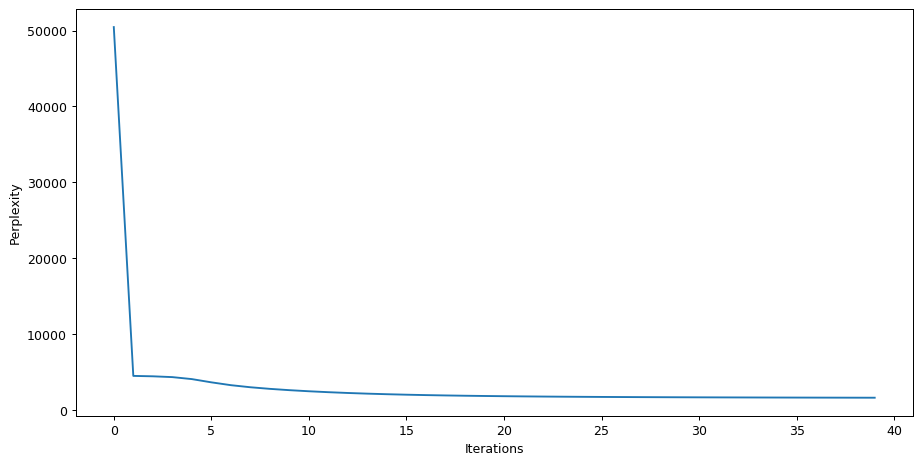

In [119]:
plt.figure(figsize=(12,6),dpi=90)
plt.plot(range(40), lda.perplexity_value)
plt.xlabel('Iterations')
plt.ylabel('Perplexity')

In [120]:
top_tokens = lda.get_top_tokens(num_tokens=10)
for i, token_list in enumerate(top_tokens):
     print ('Topic #{0}: {1}\n'.format(i, ' '.join(token_list)))

Topic #0: сапог рубаха порох мужичок снимать ремешок патрон рука пришивать наматывать

Topic #1: год месяц день март германия начало май сентябрь июнь июль

Topic #2: правда обед ужин дело расстраивать слово думать обедать подумать хотеться

Topic #3: шанс выход сломать смочь проклятие идиот угрожать убираться выкрикивать сделать

Topic #4: м т е н д э г п л б

Topic #5: ветер песок порыв буря скала дуть пропасть пустыня гребень край

Topic #6: принц принцесса высочество баронесса императрица регент государыня дворец придворный становиться

Topic #7: пара вес смена приходиться начинать килограмм отрабатывать оказываться минута упражнение

Topic #8: писатель автор литература произведение толстой сочинение творчество повесть фантастика читатель

Topic #9: ехать поехать водитель выезжать шофер тронуться садиться доезжать мерседес проезжать

Topic #10: побережье залив ион снаряжение мыс краб плотник ракушка продовольствие широта

Topic #11: посол посольство шашлык царевич кадет давать фоль

In [321]:
!~/BigARTM/bin/bigartm -c ./wv_fiction_cut.txt -v ./plain_fiction_cut_batches/vocab.txt --cooc-window 10 --cooc-min-tf 5 --write-cooc-tf ./plain_fiction_cut_batches/cooc_tf_ --cooc-min-df 5 --write-cooc-df ./plain_fiction_cut_batches/cooc_df_ --write-ppmi-tf ./plain_fiction_cut_batches/ppmi_tf_ --write-ppmi-df ./plain_fiction_cut_batches/ppmi_df_

Parsing text collection...    1%   2%   3%   4%   5%   6%   7%   8%   9%  10%  11%  12%  13%  14%  15%  16%  17%  18%  19%  20%  21%  22%  23%  24%  25%  26%  27%  28%  29%  30%  31%  32%  33%  34%  35%  36%  37%  38%  39%  40%  41%  42%  43%  44%  45%  46%  47%  48%  49%  50%  51%  52%  53%  54%  55%  56%  57%  58%  59%  60%  61%  62%  63%  64%  65%  66%  67%  68%  69%  70%  71%  72%  73%  74%  75%  76%  77%  78%  79%  80%  81%  82%  83%  84%  85%  86%  87%  88%  89%  90%  91%  92%  93%  94%  95%  96%  97%  98%  99% 100%
Merging co-occurrence batches. Stage 1: parallel agglomerative merge
Merging co-occurrence batches. Stage 2: sequential merge
Calculating pPMI
OK.  
518 batches created with total of 258958 items, and 32133 words in the dictionary; NNZ = 24273006, average token weight is 1.35882


In [322]:
cooc_dict = artm.Dictionary()
cooc_dict.gather(
    data_path='plain_fiction_cut_batches/',
    cooc_file_path = "plain_fiction_cut_batches/ppmi_df_",
    vocab_file_path='plain_fiction_cut_batches/vocab.txt',
    symmetric_cooc_values=True)

In [323]:
models = []
n_topics = [100, 200, 300, 400, 500]

In [384]:
for i in tqdm(n_topics):
    regularizers_list = []
    regularizers_list += [artm.SmoothSparsePhiRegularizer(name='SPPhiNgrammReg', tau=-0.1)]
    regularizers_list += [artm.SmoothSparseThetaRegularizer(name='SmoothThetaReg', tau=-0.1)]
#     regularizers_list += [artm.ImproveCoherencePhiRegularizer(name='CoherenceReg', tau=0.1, dictionary=dictionary)]
    scores_list = []
    scores_list += [artm.PerplexityScore(name='PerplexityScore')]
    scores_list += [artm.SparsityPhiScore(name='SparsityPhiScore', eps=0.0001)]
    scores_list += [artm.SparsityThetaScore(name='SparsityThetaScore', eps=0.0001)]
    scores_list += [artm.TopicKernelScore(name='TopicKernelScore', probability_mass_threshold=0.5)]
    scores_list += [artm.TopTokensScore(name='TopTokensScore10',
                                        num_tokens=10, 
                                        dictionary=cooc_dict)]
    scores_list += [artm.TopicKernelScore(name='TopTokensScoreKernel',
                                        dictionary=cooc_dict)]
    model = artm.ARTM(num_topics=i,
                      dictionary=dictionary,
                      regularizers=regularizers_list,
                      scores=scores_list,
                      num_document_passes=5)
    model.fit_offline(batch_vectorizer=batch_vectorizer, num_collection_passes=20)
    model.dump_artm_model(f'S_topics_{i}')
    models.append(model)

In [422]:
n_topics.extend([600, 700])
for i in (600, 700):
    regularizers_list = []
    regularizers_list += [artm.SmoothSparsePhiRegularizer(name='SPPhiNgrammReg', tau=-0.1)]
    regularizers_list += [artm.SmoothSparseThetaRegularizer(name='SmoothThetaReg', tau=-0.1)]
    #     regularizers_list += [artm.ImproveCoherencePhiRegularizer(name='CoherenceReg', tau=0.1, dictionary=dictionary)]
    scores_list = []
    scores_list += [artm.PerplexityScore(name='PerplexityScore')]
    scores_list += [artm.SparsityPhiScore(name='SparsityPhiScore', eps=0.0001)]
    scores_list += [artm.SparsityThetaScore(name='SparsityThetaScore', eps=0.0001)]
    scores_list += [artm.TopicKernelScore(name='TopicKernelScore', probability_mass_threshold=0.5)]
    scores_list += [artm.TopTokensScore(name='TopTokensScore10',
                                        num_tokens=10, 
                                        dictionary=cooc_dict)]
    scores_list += [artm.TopicKernelScore(name='TopTokensScoreKernel',
                                        dictionary=cooc_dict)]
    model = artm.ARTM(num_topics=i,
                      dictionary=dictionary,
                      regularizers=regularizers_list,
                      scores=scores_list,
                      num_document_passes=5)
    model.fit_offline(batch_vectorizer=batch_vectorizer, num_collection_passes=20)
    model.dump_artm_model(f'S_topics_{i}')
    models.append(model)

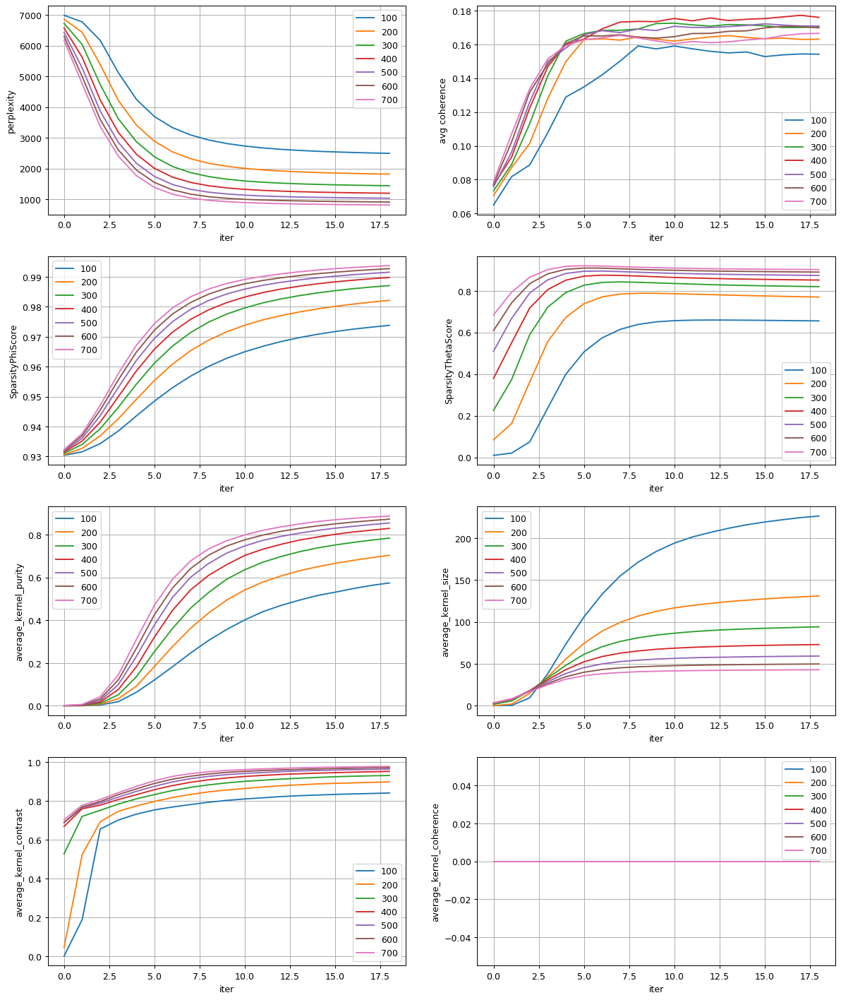

In [436]:
fig = plt.figure(figsize=(16, 20), dpi=90)
# fig.subplots_adjust(hspace=0.4, wspace=0.4)

ax = fig.add_subplot(4, 2, 1)
ax.grid()
for model in models:
    s = model.score_tracker
    ax.plot(range(len(s['PerplexityScore'].value)-1), s['PerplexityScore'].value[1:])
    ax.legend(n_topics)
    ax.set_ylabel('perplexity')
    ax.set_xlabel('iter')

ax = fig.add_subplot(4, 2, 2)
ax.grid()
for model in models:
    s = model.score_tracker
    ax.plot(range(len(s['TopTokensScore10'].average_coherence)-1), s['TopTokensScore10'].average_coherence[1:])
    ax.legend(n_topics)
    ax.set_ylabel('avg coherence')
    ax.set_xlabel('iter')

ax = fig.add_subplot(4, 2, 3)
ax.grid()
for model in models:
    s = model.score_tracker
    ax.plot(range(len(s['SparsityPhiScore'].value)-1), s['SparsityPhiScore'].value[1:])
    ax.legend(n_topics)
    ax.set_ylabel('SparsityPhiScore')
    ax.set_xlabel('iter')

ax = fig.add_subplot(4, 2, 4)
ax.grid()
for model in models:
    s = model.score_tracker
    ax.plot(range(len(s['SparsityThetaScore'].value)-1), s['SparsityThetaScore'].value[1:])
    ax.legend(n_topics)
    ax.set_ylabel('SparsityThetaScore')
    ax.set_xlabel('iter')

ax = fig.add_subplot(4, 2, 5)
ax.grid()
for model in models:
    s = model.score_tracker
    ax.plot(range(len(s['TopicKernelScore'].average_purity)-1), s['TopicKernelScore'].average_purity[1:])
    ax.legend(n_topics)
    ax.set_ylabel('average_kernel_purity')
    ax.set_xlabel('iter')

ax = fig.add_subplot(4, 2, 6)
ax.grid()
for model in models:
    s = model.score_tracker
    ax.plot(range(len(s['TopicKernelScore'].average_size)-1), s['TopicKernelScore'].average_size[1:])
    ax.legend(n_topics)
    ax.set_ylabel('average_kernel_size')
    ax.set_xlabel('iter')

ax = fig.add_subplot(4, 2, 7)
ax.grid()
for model in models:
    s = model.score_tracker
    ax.plot(range(len(s['TopicKernelScore'].average_contrast)-1), s['TopicKernelScore'].average_contrast[1:])
    ax.legend(n_topics)
    ax.set_ylabel('average_kernel_contrast')
    ax.set_xlabel('iter')

ax = fig.add_subplot(4, 2, 8)
ax.grid()
for model in models:
    s = model.score_tracker
    ax.plot(range(len(s['TopicKernelScore'].average_coherence)-1), s['TopicKernelScore'].average_coherence[1:])
    ax.legend(n_topics)
    ax.set_ylabel('average_kernel_coherence')
    ax.set_xlabel('iter')

In [521]:
models[3].score_tracker['TopTokensScore10'].last_weights['topic_18']

[0.611998975276947,
 0.17772085964679718,
 0.01828332617878914,
 0.010083836503326893,
 0.006438066251575947,
 0.004538354463875294,
 0.004383794963359833,
 0.0034365400206297636,
 0.002733885310590267,
 0.002515917643904686]

In [519]:
for topic, words in models[3].score_tracker['TopTokensScore10'].last_tokens.items():
    weights = [w for w in models[3].score_tracker['TopTokensScore10'].last_weights[topic] if w > 0]
    tokens = [f'{topic}:', *words]
    weights = [0, *[w * 5 for w in weights]]
    draw_html(zip(tokens, weights))
#     print('{0}: {1}'.format(topic, ' '.join(words)))

topic_0: грязь треск заросль бег погоня овраг преследователь сова четвереньки просвет

topic_1: май июнь октябрь апрель январь декабрь ноябрь продавщица февраль календарь

topic_2: государь иностранец указ кремль отечество одесса императрица государыня санкт-петербург заговорщик

topic_3: вера религия христианин пророк откровение культ фанатик католик последователь единство

topic_4: туалет игрушка пятерка бутылочка кроватка братишка паста веревочка пеленка тапок

topic_5: песок горизонт пустыня жара кромка прохлада жажда лавина прибой зной

topic_6: фон барон переводчик баронесса добродетель иероглиф личина мыслитель алчность притча

topic_7: житель поселок обитатель гильдия приезжий пустошь гранит адепт население алхимик

topic_8: литература баня училище сочинение общежитие биография медаль ленинград повесть гоголь

topic_9: сидение водитель спинка шофер дверца лимузин швейцар баранка фольксваген аврора

topic_10: грех батюшка поп шарп сукно приказчик дурень гордыня слобода сват

topic_11: салон зажигалка окурок брюнетка пепельница стерва пароль регистрация евро наушник

topic_12: норма кайло дворник корка мясник пицца боксер почтальон ринг аттракцион

topic_13: тоска дрожь прикосновение шепот ресница горечь личико незнакомка попугай смятение

topic_14: бригада гад сука цех клин соловей сучок оракул репа ходок

topic_15: кабина мотор пират дырка сирена комбинезон парашют рев дирижабль металлолом

topic_16: дед гриб кора пласт хала грибник кордова лукошко шампиньон грибница

topic_17: планета цивилизация раса галактика абориген инопланетянин тысячелетие представитель катастрофа население

topic_18: сэр джентльмен ослик баронет денди мистрис манера бедняга суссекс пикадилли

topic_19: люк грим амеба несварение бакен текс прагматизм хмыканье вельвет бесстрастие

topic_20: пламень тварь грохот вспышка осколок искра ловушка разрыв пепел вихорь

topic_21: племя вождь предок стадо овца пастух японец япония роба обычай

topic_22: звон колокол поручик медь голубчик колокольня промысел пуд благородие уксус

topic_23: степь хан кочевник подкова слива монгол юрта шпора разъезд шаровары

topic_24: марка коллекция заметка телеграмма миллионер журналистка коллекционер янки бел посетительница

topic_25: аппарат модель пленка провод микрофон контейнер рычаг лента значок катушка

topic_26: площадка полка белье подоконник свитер занавеска рама ступня шарф брюки

topic_27: озеро долина рыбка водопад ливень аквариум баржа поток фауна водоем

topic_28: палач предатель виконт старейшина торн графство сакс британия ягненок перемирие

topic_29: мешок усадьба селение урожай шайка деревушка тракт пшеница леопард оборванец

topic_30: пальто дверца тротуар лужа переулок асфальт прохожий продавец прилавок улочка

topic_31: яйцо рис орех лень зять переезд цыпленок апельсин лапша скорлупа

topic_32: приказ сержант звание пленный новобранец присяга рядовой беркут пакистан командование

topic_33: труба лампа крышка подвал плита колодец лабиринт мумия штукатурка слепой

topic_34: орк стандарт властелин сородич хоббит канон нелюди стилет хук твердыня

topic_35: лодка весло акула водоросль краб плеск камыш тростник ракушка плавник

topic_36: статья материал текст иллюзия экземпляр сюжет раздел фантастика перевод цикл

topic_37: подросток игла укол парнишка красавчик доза разборка шприц крепыш шашка

topic_38: волк вой оборотень свора полнолуние брод волчонок белоснежка сатира пак

topic_39: поход копье пленник шаман гоблин плен орда набег вояка клич

topic_40: трамвай альбом туземец творец гей каста потоп оса панк отброс

topic_41: тетка дача портфель командировка справка шашлык арбуз павлин петушок коммуналка

topic_42: диплом псих зараза справочник язва инфаркт скорпион моча отравление извращенец

topic_43: мозг лаборатория орган сосуд аптека галлюцинация печень препарат ассистент почка

topic_44: свобода уверенность презрение инстинкт месть обаяние манера спокойствие скромность привычка

topic_45: психолог предательство измена подлец вранье домработница порча показ аборт харя

topic_46: слуга карета милость англичанин лакей камзол камердинер поклон щеголь ливрея

topic_47: наркотик щелчок барьер комбинация наркоман одеколон употребление кокаин комикс героин

topic_48: шах афганистан мусульманин гарем олух мечеть эмир иран баку кишлак

topic_49: шляпа квартал витрина вывеска дань магазинчик монахиня убор пикап донна

topic_50: король величество трон корона придворный дворец монарх свита королевство фрейлина

topic_51: отряд район пост территория банда патруль крым украина соединение резерв

topic_52: стая покойник шапочка вожак киллер филин метка жучок волчица браконьер

topic_53: цилиндр костяшка плесень весы радиостанция гранд хам стервятник тезка фора

topic_54: полет космос орбита материя отсек кристалл звездолет кислород ось космонавт

topic_55: кафе кран лимон сериал чадо турция фужер шик чипсы балбес

topic_56: демон кошмар облик кара создатель обличие пантера уродец создание зев

topic_57: конь всадник седло разбойник копыто скакун дыбы стремя барс галоп

topic_58: молния фут ремень джин гром туча дюйм гроза дуга прилив

topic_59: браслет напарник казино линза ячейка шестерка спец жетон клещ мегаполис

topic_60: прибор механизм давление температура вещество оборудование градус конструкция ток масса

topic_61: противник атака позиция разведчик орудие пулемет батарея маневр граната прикрытие

topic_62: дура злость морда рывок сволочь урод козел коленка истерика шлюха

topic_63: куртка ботинок носок обувь проспект подошва шнурок вешалка бомж штаны

topic_64: холм облако яблоко бабочка роща облачко ветерок червяк кузнечик туча

topic_65: мальчишка ступень особняк ограда аллея набережная мостовая фасад дворик ров

topic_66: мечта одиночество отражение юность грусть помада свежесть влечение тушь полнота

topic_67: команда клуб игрок трибуна футбол матч стадион болельщик футболист девон

topic_68: крошка сахар порошок пирожок капуста шкафчик матрас сандалия кубик баночка

topic_69: стакан бар стойка посетитель глоток напиток стаканчик бармен спиртное завсегдатай

topic_70: папка объявление сейф приятельница каталог начальница имидж хобби студентка трейлер

topic_71: отдел сотрудник охрана безопасность организация совещание корпорация террорист фсб слежка

topic_72: драка цыган стычка цыганка сухарь гам теплоход вилы севок потасовка

topic_73: зверь охотник охота медведь рог олень дичь кабан туша лось

topic_74: папочка эра темперамент ирландец харпер орлеан диксон иезуит гортензия чили

topic_75: мышь хор котенок лапка лягушка камешек пик ушко писк отшельник

topic_76: клетка велосипед бак прут зоопарк джи рози леденец медуза педаль

topic_77: ангел майка рок цветочек веснушка сарафан морковка бегемот стриптиз столяр

topic_78: идиот ребро штаны дерьмо дружок зад физиономия паренек слюна придурок

topic_79: каюта флот койка адмирал моряк эскадра кают-компания старпом верфь линкор

topic_80: следователь заключение следствие расследование допрос показание протокол прокуратура департамент экспертиза

topic_81: самолет аэропорт посадка полоса рейс полет стюардесса перелет пассажир лайнер

topic_82: искусство стих поэт произведение гений строка творчество творение поэзия стихотворение

topic_83: путешествие длина карандаш путешественник шпион ширина трос полюс пончик приключение

topic_84: капитан помощник док командор ранг дока зек обязанность распоряжение пауза

topic_85: начальник начальство должность чиновник комитет министерство учреждение канцелярия сослуживец арест

topic_86: девчонка дневник учебник оценка отметка сережка школьница балл раздевалка одноклассница

topic_87: ресторан заведение официант меню кабинка ресторанчик подворотня храп забегаловка метрдотель

topic_88: журнал бизнес бизнесмен пресса интервью репортер выпуск бобби карьера лос-анджелес

topic_89: билет записка рукопись пьеса издатель псевдоним отзыв абзац лотерея маркер

topic_90: колесо платформа тележка дельфин свисток поручень спица скат мундштук пря

topic_91: вампир клык кол нечисть лиана превращение укус упырь нежить пиявка

topic_92: проект кит транс атом гамма молекула детище росток рейтинг ракетка

topic_93: боб сыщик юпитер бич гордон вест франклин меркурий портер кука

topic_94: журналист предприятие заместитель профессионал авторитет конкурент заказчик банкир гонорар исполнитель

topic_95: борода гном карлик грузин грузия народец харьков бургомистр карапуз тбилиси

topic_96: россия государство союз культура революция китай историк демократия эпоха большевик

topic_97: старушка соседка балкон скамейка чердак собачка лавочка сквер скамеечка мансарда

topic_98: гостиная холл камин сити пат жасмин патриций софа фен ступенька

topic_99: офицер армия полк военный гвардия штык парад войско командование штаб

topic_100: знание ученик испытание академия обучение воспитание умение мастерство дисциплина преподаватель

topic_101: солдат госпиталь легион ветеран штурм доброволец шеренга легионер полководец корея

topic_102: маг заклинание портал стихия сенатор магия аура защита заклятие плетение

topic_103: граф сеньор софия сударь маршал кэтти сеньорита бри графа рэп

topic_104: экипаж повозка кучер картер извозчик козлы возница чан фортуна вожжа

topic_105: мастерская перила открытка клоун уборная набросок блестка эскиз мазок палитра

topic_106: рак медик шов санитар спирт носилки кишка инвалид помойка перелом

topic_107: ученый загадка пирамида верблюд зомби древность секта горб ньютон мечтатель

topic_108: подчиненный наблюдатель вал курсант инструктор застава кон пограничник построение нарушитель

topic_109: супруга отъезд скандал близнец супруг ссора мел беременность роды ланч

topic_110: мука стражник зерно страж мельница гвардеец навоз плотина мельник прачка

topic_111: маска италия венеция прорезь милан карнавал розочка гондола воздержание итальянка

topic_112: шапка рубаха ворона сабля шатер ворон солома варвар теленок киммериец

topic_113: больница отделение палата пациент медсестра дежурство кушетка пострадавший ширма пациентка

topic_114: изба казак верста татарин сотник сени атаман хутор обоз горница

topic_115: могила кладбище памятник находка лопата прах умерший холмик железяка надгробие

topic_116: спальня диван шкаф подушка ковер мебель прихожая простыня штора тумбочка

topic_117: километр металл ракета гул установка броня пластина бункер магнит титан

topic_118: класс столовая учительница тетрадь перемена кружок школьник одноклассник четверка тетрадка

topic_119: автомобиль руль стоянка джип фара багажник перекресток тормоз капот парковка

topic_120: стиль реклама изобретение интерьер неудачник дизайнер отделка концепция производитель индивидуальность

topic_121: бой победа войско битва сражение схватка поражение сопротивление беглец оборона

topic_122: кольцо орел лепешка колдунья ярмарка баран флора колечко креол циновка

topic_123: сумма фунт наследство имущество жилье завещание коттедж владелец капитал доля

topic_124: институт лекция блок комплекс премия пропуск психология специальность химик заведующий

topic_125: сигарета пачка задница шоу минус фильтр плюс курение сучка восьмерка

topic_126: подруга косметика будильник шпилька зануда бренд дружба деточка ровесница стелла

topic_127: бандит патрон стрельба мишень умник верзила детина головорез подручный корсар

topic_128: тарелка молоко поднос сок пирог сыр салфетка вилка салат печение

topic_129: меч плащ рыцарь клинок ножны доспехи шпага герб рукоять выпад

topic_130: животное кот шерсть порода чучело любимец питомец нимфа ветеринар котик

topic_131: фонарь череп крыса проем монстр опора балка шнур перчатка бетон

topic_132: выстрел автомат винтовка укрытие прицел убитый приклад обойма перестрелка канистра

topic_133: рынок покупка продажа покупатель крона финн статуэтка приобретение аукцион домовой

topic_134: тигр летчик корм сосиска людоед детеныш пингвин зернышко зверушка моллюск

topic_135: питер гриф креветка муза хадж проныра дымоход мирза трубочист кения

topic_136: страсть бедро наслаждение любовница близость фантазия ревность искушение блаженство потребность

topic_137: труп управление агент эксперт осмотр морг вскрытие штатское патологоанатом криминалист

topic_138: мяч тренировка спорт сетка соперник тренер упражнение соревнование спортсмен секция

topic_139: лейтенант майор прапорщик взвод старлей замполит особист крафт погон радист

topic_140: хозяйка рубль коньяк копейка экономия портвейн абажур рюмочка мелочь полтинник

topic_141: юноша толстяк юнец бордель руно сопляк воспитанник тюремщик настойка йод

topic_142: тройка колода ноша невидимка масть ама семерка выродок валет веление

topic_143: решетка лезвие сталь рукоятка скрип бритва скрежет засов рукоять склеп

topic_144: директор сцена публика зритель актер спектакль артист представление выступление занавес

topic_145: кукла железо печка тина конек ниточка зайчик пила мамка перекладина

topic_146: юбка роза наряд шелк поместье сплетня шляпка поклонник подол веер

topic_147: родина завод танк русский станок беженец керосин танкист вьетнам погром

topic_148: энергия метод копия образец наблюдение эксперимент явление логика элемент использование

topic_149: веревка палка яма узел петля лев цепь крюк колючка шест

topic_150: лошадь луг грива езда хлыст галоп лошадка упряжка табун овес

topic_151: сумка обложка касса автограф мартини кассирша книжечка ламберт фотомодель толстячок

topic_152: мужик хрен блин фига брюнет жопа дурак олигарх фиг мозги

topic_153: судно матрос парус флаг мачта якорь палуба боцман моряк шхуна

topic_154: поверхность дно скала обрыв ураган выступ канат жемчужина отлив бухта

topic_155: отчим дурь гель мадонна гормон братик марина йога дайна трико

topic_156: ужин роскошь вестибюль гардероб апартамент невестка свекровь банкет дизайн свекор

topic_157: палочка глазок носик парик дамочка ножка пожарный сажа пупок гвоздик

topic_158: мак цирк трюк арена фитиль саванна панама пятак представление манеж

topic_159: полковник мундир сюртук сундучок вега денщик мавр душенька треуголка чахотка

topic_160: нью-йорк авеню вашингтон форд пригород чикаго консультант небоскреб манхеттен даллас

topic_161: мастер доска мат шахматы пешка мертвяк демиург маразм карма ничья

topic_162: перо человечек чернила субъект жулик кроха рассказчик контролер манекен чернильница

topic_163: каша франк мсье фрау прага дыня цемент блуза гонконг нормандия

topic_164: кофе чашка чашечка ложечка кофейник кофеварка блюдце сливки сахарница кофеин

topic_165: хлеб голод бабка ведро дрова воробей сало корочка булка ломоть

topic_166: воскресение среда суббота выходной пятница понедельник четверг вторник грант пионер

topic_167: император империя столица правитель наемник провинция налог союзник подданный могущество

topic_168: стража телохранитель наставник повелитель поединок смертный мэтр посланец некромант соратник

topic_169: дон похороны сев кактус ария пас герань катафалк фата фикс

topic_170: мадам рута хантер маккензи корреспонденция фиби дискета мид лэнгли спа

topic_171: остров океан побережье материк суша австралия пролив мыс архипелаг островитянин

topic_172: поляна хижина бревно мох чаща сани смола идол хворост тропка

topic_173: призрак галерея рыбак скай ловец сперма пенис водопроводчик влагалище модерн

topic_174: мясо пища блюдо ложка порция суп желудок аппетит горшок скатерть

topic_175: страница буква библиотека запись блокнот стопка дата почерк архив чтение

topic_176: церковь епископ святой часовня собор благословение алтарь патриарх проповедник прихожанин

topic_177: ноль схема сектор коротышка звено сайт чип электроника маскировка комп

topic_178: одеяло завтрак посуда пуговица раковина чайник уголь веранда миска корзинка

topic_179: реакция эмоция босс партнер развод комплимент официантка самообладание мелисса пауза

topic_180: уровень разум воздействие хаос конечность оболочка навык щупальце восприятие выживание

topic_181: деревня щенок свинья кувшин поросенок сорока малец рыжик выдра конура

topic_182: герцог маркиз светлость герцогиня приданое маркиза паж регент аристократия шевалье

topic_183: шарик нитка иголка жаба бусы уголек гиря бат цапля ирод

topic_184: роман герой автор читатель персонаж повествование приключение описание подвиг сюжет

topic_185: мистер сигара портсигар банкнота бакенбарда пардон морс галстук банкнот кэнди

topic_186: засада боевик захват снайпер заложник спецназ чеченец кавказ чечня каска

topic_187: порт буря пароход плавание причал шторм гавань суматоха мексика качка

topic_188: пистолет пуля ствол стрелка стрелок кобура главарь карабин свинец пояс

topic_189: шар корзина сир стюард эрл троя гонг олива оптимист ном

topic_190: подарок сынок рождество няня папаша шкатулка вещица тесть сыночек стирка

topic_191: коробка надпись табличка машинка коробочка килограмм плакат вес клей малина

topic_192: плод фрукт овощ косточка помидор груша лоток банан качели гипноз

topic_193: америка экспедиция американец африка континент климат глыба ледник геолог амазонка

topic_194: поведение внешность особа насмешка замешательство кузина негодование извинение румянец замечание

topic_195: рождение ложь сюрприз учеба каникулы блузка сестренка детка дурочка ровесник

topic_196: бабушка внук внучка бабуля прабабушка брошь правнук брошка дочка старость

topic_197: истина господь справедливость уста мудрость злодей греза порок мудрец библия

topic_198: еврей рим республика римлянин польша израиль иерусалим сенат типография префект

topic_199: судья торт крем пирожное арчи присяжный сэндвич вердикт кондитерская подсудимый

topic_200: командир боец колонна строй мина рота штаб снаряд батальон взвод

topic_201: зона пацан милиционер бинокль свалка периметр бугор сталкер аномалия ведьмак

topic_202: знакомство общение профессия прозвище увлечение характеристика самолюбие лад вариант собеседование

topic_203: компьютер сообщение лифт кнопка данные интернет отпечаток ноутбук оператор клавиатура

topic_204: червь бес скрипка чудище лом крот козырь стержень зэк туз

topic_205: гнев вина жалость стыд печаль убежище марш позор унижение отчаяние

topic_206: царь дума батя царевич царевна кафтан горох боярин стрелец чело

topic_207: князь стрела княгиня княжна стан ящер тетива отрок княжич колчан

topic_208: несчастие семейство приют барышня горе управляющий имение племянница лихорадка разлука

topic_209: шеф список отчет расход ассоциация бланк заголовок шантаж штаб-квартира выплата

topic_210: башня пещера узор трещина глина рей обруч кладка лучик лоза

topic_211: приглашение прощение бал украшение прием драгоценность бриллиант ваза ожерелие серьга

topic_212: пиво водка бутерброд старичок колбаса алкоголь икра огурец грамм закуска

topic_213: суд процесс заказ юрист гарантия жалоба штраф консультация обслуживание лицензия

topic_214: поколение развитие изменение последствие сфера чужак конфликт уничтожение влияние статус

topic_215: орден советник магистр перстень устав мантия резиденция казначей иерархия магистрат

topic_216: приятель знакомый пенсия опера администрация администратор листочек уборщица знакомая пропажа

topic_217: сигнал объект устройство панель капсула аппаратура мощность импульс генератор излучение

topic_218: европа карла азия европеец сан-франциско основатель выходец авантюрист форум стамбул

topic_219: москва подполковник волга рапорт ссср увольнение столица комсомолец райком комсомол

topic_220: миля склон тропа подножие местность хребет валун мул амбар загон

topic_221: экран телевизор программа канал передача радио изображение пульт монитор эфир

topic_222: лондон англия сокол оксфорд англичанка флоренция сера норвегия британец фреска

topic_223: вертолет проводник ущелие караван рация перевал вышка спасатель завал вертушка

topic_224: скамья стрит грабитель ярд аббат констебль викарий джорджия прачечная портик

topic_225: видение рай ритуал спаситель сеанс лоно преисподняя чрево грешник джаз

topic_226: леди милорд титул дворецкий аристократ репутация реверанс сезон повеса перчатка

topic_227: лорд миледи шотландия шотландец поместье парламент милорд эдинбург землевладелец корнуолл

topic_228: площадь дворец храм сокровище символ обряд мрамор посланник пергамент божество

topic_229: парк смущение келли неловкость рукопожатие ямочка ленч жакет враждебность поверенный

topic_230: задача операция задание состав разведка подготовка назначение руководство выполнение подразделение

topic_231: север восток запад залив поселение бочонок устье гребец галера полуостров

topic_232: лик крокодил аллах шейх коршун стойбище визирь мавзолей ислам коран

topic_233: адвокат секретарь подпись заседание фонд ущерб компаньон тур кандидатура клерк

topic_234: автобус пассажир остановка транспорт будка бензин кепка проезд попутчик шлагбаум

topic_235: кусочек полотенце душ мороженое конфета шоколад плитка щетка сладость кладовка

topic_236: туман холод чудовище мрак нить очертание пропасть силуэт бездна пелена

topic_237: сан колокольчик бумажник таверна рабыня туника джинн клеймо лачуга трущоба

topic_238: фамилия праздник сентябрь конкурс курсы отчество поздравление путевка воспитательница доченька

topic_239: профессор клад швейцария эмигрант шифр консьержка бордо томик булочник будапешт

topic_240: монета кошелек плата бродяга мешочек монетка мошенник денежки плотник шиллинг

topic_241: театр талант актриса эпизод героиня издательство драма ложа кумир фойе

topic_242: добро личность болезнь зло сущность насилие бытие ближний нелепость мистика

topic_243: гроб маринка свечка парикмахер парикмахерская оливье синь толмач кардиган панихида

topic_244: золото серебро богиня чаша алтарь жрица пенни рудник святилище руда

topic_245: девица красавица рожа рюмка фея кавалер пальчик туфелька сестрица ножка

topic_246: ведьма мертвец мертвый скелет чары амулет останки колдовство цепочка леший

topic_247: сад домик дорожка пруд великан башмак изгородь колпак садовник садик

topic_248: наука открытие инженер кандидат математика формула химия треугольник диссертация таблица

topic_249: бокал туфля вечеринка шампанское малышка тост корт пикник девчушка графин

topic_250: дядя мор обезьянка нейл овсянка лестер калина затычка сван шустрик

topic_251: добыча топор челюсть коготь пасть хищник прыжок взмах хруст туловище

topic_252: индеец конюшня чулок рейн бриджи мокасин корд метис индианка краснокожий

topic_253: рабочий фабрика шахта июль канада брошюра шахтер цру смена аляска

topic_254: адрес листок конверт таблетка авария депрессия стресс анкета каток аспирин

topic_255: мисс миссис горничная манера кухарка облегчение кеб ступенька обязанность прогулка

topic_256: процент секретарша зарплата производство доход приемная прибыль менеджер кризис бухгалтер

topic_257: кружка эль кузнец трактир молот трактирщик фартук кузница бизон подмастерье

topic_258: тетя тетушка дядюшка племянница родственница пьеро заика муфта боз глупость

topic_259: рана шкура раненый повязка ранение ран дозор рубец лазарет тюфяк

topic_260: ткань запястье стон паника шериф синяк обморок вдох хватка царапина

topic_261: муха башка базар яга лох бабки слесарь рыло братва желвак

topic_262: нефть герр обеспечение сидней кросс ана ирак оскар месторождение колумбия

topic_263: член председатель комиссия община правление поляк обыватель жандарм писарь баррикада

topic_264: папа малыш взрослый дочка младенец сынишка ладошка ирис ручонка восторг

topic_265: база техника пункт инструкция квадрат вооружение капрал топливо ангар техник

topic_266: карта робот тир феникс притон клешня омар обозначение соглядатай бон

topic_267: висок ноготь шрам красотка трусы коктейль табурет выпивка футболка татуировка

topic_268: генерал чин отставка командующий превосходительство адъютант штаб главнокомандующий генерал-майор генерал-лейтенант

topic_269: писатель анекдот таракан футляр клавиша вдохновение пианино композиция колобок юбилей

topic_270: камера жидкость мышца вена пульс повреждение позвоночник разрез судорога хирург

topic_271: мост палатка тюк рокот переправа тент обвал полотнище аэроплан горелка

topic_272: священник приход казнь нищий служитель милосердие бедняк проповедь гимн латынь

topic_273: крыло гнездо пустота терраса лужайка гребень лилия ящерица тополь клюв

topic_274: эльф магия волшебник чародей посох волшебство артефакт волшебница полукровка сито

topic_275: сено графиня кузен жеребец кобыла конюх стойло стог боров дерби

topic_276: воевода град русь боярин киев дружина грамота богатырь дружинник варяг

topic_277: луна растение пейзаж купол сияние закат заря вулкан землетрясение восход

topic_278: воин раб шлем щит грек рабство перс кольчуга гладиатор невольник

topic_279: коллега специалист исследование область руководитель доклад сша технология конференция общественность

topic_280: обезьяна гигант дикарь форт тролль предводитель ястреб дубина искатель северянин

topic_281: дедушка курица картошка бочка ягода мальчуган вишня бек валенок пряник

topic_282: март родня посылка портной рига пташка тюльпан дот линк манжет

topic_283: очки буфет сверток зонтик оправа киоск очко зонт ларек троллейбус

topic_284: комиссар исчезновение похищение похититель пастор ректор выкуп василек усопший альфонс

topic_285: изучение интеллект психика усик декан рефлекс клеточка отклонение стажер брюшко

topic_286: колдун очаг котел кнут ночлег рысь полено шакал хмель подстилка

topic_287: новичок кэт ион кудряшка линн кентавр нато ассистентка кафетерий мессия

topic_288: мороз ива елка гусь жук хвостик гирлянда горилла весельчак глобус

topic_289: милиция происшествие редактор редакция розыск оперативник корреспондент зам сводка повестка

topic_290: статуя фонтан собор археолог беседка клумба скульптура архитектор архитектура бюст

topic_291: крепость защитник топот гуща арбалет лучник натиск вылазка полсотни пика

topic_292: незнакомец собеседник бред привидение расписка берн пауза акцент норд неожиданность

topic_293: дежурный мент фуражка папироса козырек ром погон фляжка китель берет

topic_294: кошка индия лиса лис лисица пушок индус кобра тюрбан питон

topic_295: подозрение доказательство послание самоубийство бюро заговор утверждение покушение оригинал фбр

topic_296: полиция полицейский удостоверение дубинка копа зевака коп полисмен мигалка блюститель

topic_297: фотография снимок рамка китаец фотограф фото фотоаппарат объектив вырезка фотка

topic_298: коза шина хата тыква новорожденный хлопец старикашка барашек дедуля минутка

topic_299: президент министр правительство политика губернатор лидер политик выборы кампания нация

topic_300: лавка крестьянин жалование кабак богач помещик нищета люд ремесленник сапожник

topic_301: госпожа свеча огонек хранитель воск сатана гобелен подсвечник канделябр химера

topic_302: привет джинсы каблук шуба мех кроссовок стрижка футболка брюки челка

topic_303: жрец царство царица египет фараон процессия храм гробница вельможа императрица

topic_304: подружка секс любовник красавец мероприятие мобильник дискотека попка соперница тусовка

topic_305: организм период анализ стадия вирус чума гипотеза ген кислота особь

topic_306: слон лампочка фонарик пузырек вата бинт веник шланг утюг пылесос

topic_307: куст ветка ветвь ствол дуб сосна речка листва береза стебель

topic_308: гостиница вилла блондин бульвар достопримечательность француженка американка наличные барселона магнолия

topic_309: крыльцо забор корова сарай калитка огород петух погреб яблоня грядка

topic_310: корабль корпус пришелец мостик ядро обшивка крушение груз обломок фрегат

topic_311: халат ванная ванна бассейн пена мыло унитаз халатик шампунь бритье

topic_312: музыка песня инструмент мелодия концерт музыкант нота пение гитара оркестр

topic_313: платок весна осень солнышко пузырь птичка дядька ножницы форточка сирень

topic_314: немец фронт германия берлин фашист фриц окоп партизан фюрер землянка

topic_315: пилот режим колония скафандр модуль шлюз бот система параметр колонист

topic_316: студент университет факультет кафедра алмаз преподаватель раскопка практика эпидемия студентка

topic_317: система сеть человечество контакт вселенная код доступ единица запрос тест

topic_318: болото почва равнина кустарник чайка утка островок растительность утес гряда

topic_319: эхо паук путник паутина арка развалины свод странник плот маяк

topic_320: участник победитель препятствие дистанция приз гонка скачки состязание пригоршня ограждение

topic_321: городок работник скот округ ранчо ковбой пастбище техас городишко качалка

topic_322: визит служанка вдова гостья прислуга бедняжка экономка милочка гостеприимство передник

topic_323: удача клан ставка кубок дуэль жемчуг везение выигрыш вражда изумруд

topic_324: тюрьма преступник пожар фургон негодяй ограбление пустырь сообщник пансионат поимка

topic_325: вершина погода высота рюкзак маршрут подъем пух спуск снаряжение компас

topic_326: королева наследник королевство потомок дворянин интрига братство покровитель претендент инквизиция

topic_327: принц принцесса высочество пленница изабелла дворец золушка шпионка пуританин форс

topic_328: фильм кино кадр режиссер студия съемка сценарий телевидение кинотеатр продюсер

topic_329: взрыв бомба двигатель механик истребитель аэродром авиация механика плоскость взлет

topic_330: танец церемония ритм барабан гармония помост возвышение танцовщица вуаль танцор

topic_331: товар купец торговец торговля богатство испания испанец изделие выгода голландец

topic_332: грузовик шоссе ферма обочина коляска мотоцикл поворот фермер канава кузов

topic_333: клиент фирма свидание услуга контора договор агентство оплата помощница аренда

topic_334: вор заявление маньяк кража участковый грабеж гражданка кеш воровство преступность

topic_335: категория интуиция тара бум возврат силок заинтересованность стабильность самостоятельность праведник

topic_336: отель турист мадемуазель бренди постоялец портье гид посыльный люкс марля

topic_337: дыра проход переход тоннель отверстие тупик ниша измерение скважина частица

topic_338: поезд станция вагон вокзал купе рельс электричка перрон паровоз состав

topic_339: баба бык телега скотина лошадка ребятишки ромашка воз банька подвода

topic_340: рыба крючок удочка лебедь чета рыбалка приманка чет ловля рыбина

topic_341: лапа пес ручей лай морда поводок ошейник медвежонок овчарка шалаш

topic_342: наказание приговор побег исполнение философ освобождение срок философия пытка бунт

topic_343: склад негр пристань араб саквояж носильщик плантация грузчик брезент мирон

topic_344: участок строительство проволока строитель липа стройка фундамент карьер бурьян прививка

topic_345: старуха девка печь братец барин мужичок таз рен перина кочерга

topic_346: отдых пляж отпуск яхта пальма шорты загар курорт купальник купание

topic_347: брак свадьба невеста жених женитьба помолвка узы замужество венец согласие

topic_348: ярость дар ненависть проклятие плоть кинжал безумие злоба клятва трус

topic_349: лук пар владыка старец султан завоеватель константинополь славянин ищейка плетка

topic_350: доктор клиника психиатр матка хирургия понтер психиатрия комик морфий тэмми

topic_351: мамочка фейерверк сканер содействие иня салют скрипач пра ява керн

topic_352: инспектор музей сторож экскурсия медальон экспонат рено йорк ребус ратуша

topic_353: борьба партия деятельность собрание акция учение благо противоречие демонстрация деятель

topic_354: дракон змей викинг чешуя ярл друид чешуйка ипостась чудовище хищница

topic_355: звонок пакет офис карточка почта гараж гудок пакетик супермаркет клиентка

topic_356: штат сделка старина собственность служащий недвижимость бостон роуд ирландия флорида

topic_357: книжка картинка метро мышка травка коллектив география черточка крендель секундочка

topic_358: дьявол джунгли кардинал врата талисман заповедник носорог дебри гамак куба

topic_359: сказка легенда выдумка чудак венок русалка дурачок платочек бутыль омут

topic_360: подъезд ремонт жилец бригадир магнитофон пенсионер пролет девятка иномарка жигули

topic_361: гражданин фокус вокзал хулиган борец фокусник уголовник эскалатор очкарик толстуха

topic_362: доллар такси сумочка бумажка паспорт пробка купюра бакс таксист визитка

topic_363: масло банка холодильник продукт соль гвоздь кастрюля жир молоток пластинка

topic_364: обвинение повар прокурор мэр итальянец синьор правосудие синьора говор мэрия

topic_365: врач больной лекарство болезнь здоровье лечение медицина травма кашель приступ

topic_366: поцелуй объятие талия жар возбуждение нежность ласка бета прядь локон

topic_367: сапог село табак старшина часовой казарма барак котелок шинель нары

topic_368: образование экзамен физика аудитория академик мышление физик выпускник поступление распределение

topic_369: пиджак детектив блондинка галстук проститутка массаж лацкан хьюстон напарница лас-вегас

topic_370: дитя покрывало лекарь ложе сновидение полог плеть флакон припадок краса

topic_371: снег зима лед холод лыжа сугроб тепло весна снежинка хлопья

topic_372: змея зелье шут метла фляга курган трясина гадюка изверг работорговец

topic_373: петербург мамаша сибирь теща прадед губерния нева клоп оспа червонец

topic_374: миллион банк цифра теория кредит расчет миллиард чертеж вклад подсчет

topic_375: ружье револьвер пушка заряд порох дробь калибр обрез западня дуло

topic_376: костер лагерь столб тайга дымок целитель вездеход муравейник насыпь лань

topic_377: убийство убийца преступление свидетель версия мотив расследование улика подозреваемый отпечаток

topic_378: кирпич голубь шишка тачка славка карусель одуванчик ляжка водичка винт

topic_379: крест пан сирота икона господи самовар барыня житие пани благодать

topic_380: охранник газ трасса сигнализация москвич кейс бородач полигон бмв видеокамера

topic_381: матушка сундук дева свиток пир опекун избранник наложница ведун оберег

topic_382: монах монастырь молитва обитель настоятель келья обет ряса смирение аббатство

topic_383: корень тропинка коса староста синева косичка камушек кустик крапива олимпиада

topic_384: родственник племянник колледж грош чек сарказм пансион холостяк родство опека

topic_385: тьма факел капюшон подземелье сумрак светильник предсказание жезл пророчество балахон

topic_386: мусор букет спичка комар варение байка ежик коробок букетик жираф

topic_387: документ контракт переговоры посол дипломат посольство курьер виза делегация швед

topic_388: август зала виноград вздор г-н благородство брань виноградник г-жа тиран

topic_389: учитель урок нора парта ученик ученица директриса педагог учительская завуч

topic_390: париж франция француз месье соглашение авантюра предместье ницца версаль парижанин

topic_391: знамя комендант турок гарнизон земляк горец сиятельство ростов аул ака

topic_392: заяц насекомое мед семя муравей самец пчела зверек белок самка

topic_393: весть кролик горожанин гонец укрепление осада удав бойница огрызок бастион

topic_394: спутник марс землянин спираль антенна астероид созвездие светило астроном марсианин

topic_395: поступок мода страдание натура сочувствие проявление отчаяние совесть существование жестокость

topic_396: борт палуба катер крейсер шлюпка корма рубка штурман трап трюм

topic_397: чемодан поездка багаж чемоданчик хранение лен колесико пожитки экспресс таможня

topic_398: реальность диск скука миссия фрагмент подделка циферблат вариант цитата андроид

topic_399: краска художник портрет рисунок кисть полотно выставка живопись холст павильон

In [544]:
h = []
for topic, words in models[3].score_tracker['TopTokensScore10'].last_tokens.items():
#     weights = [w for w in models[3].score_tracker['TopTokensScore10'].last_weights[topic] if w > 0]
    weights = [df[w] for w in words]
    h.append(np.median(weights))

In [549]:
for i in np.argsort(h)[:10]:
    tokens = models[3].score_tracker['TopTokensScore10'].last_tokens[f'topic_{i}']
    print(i, tokens)

19 ['люк', 'грим', 'амеба', 'несварение', 'бакен', 'текс', 'прагматизм', 'хмыканье', 'вельвет', 'бесстрастие']
16 ['дед', 'гриб', 'кора', 'пласт', 'хала', 'грибник', 'кордова', 'лукошко', 'шампиньон', 'грибница']
250 ['дядя', 'мор', 'обезьянка', 'нейл', 'овсянка', 'лестер', 'калина', 'затычка', 'сван', 'шустрик']
170 ['мадам', 'рута', 'хантер', 'маккензи', 'корреспонденция', 'фиби', 'дискета', 'мид', 'лэнгли', 'спа']
189 ['шар', 'корзина', 'сир', 'стюард', 'эрл', 'троя', 'гонг', 'олива', 'оптимист', 'ном']
74 ['папочка', 'эра', 'темперамент', 'ирландец', 'харпер', 'орлеан', 'диксон', 'иезуит', 'гортензия', 'чили']
159 ['полковник', 'мундир', 'сюртук', 'сундучок', 'вега', 'денщик', 'мавр', 'душенька', 'треуголка', 'чахотка']
243 ['гроб', 'маринка', 'свечка', 'парикмахер', 'парикмахерская', 'оливье', 'синь', 'толмач', 'кардиган', 'панихида']
18 ['сэр', 'джентльмен', 'ослик', 'баронет', 'денди', 'мистрис', 'манера', 'бедняга', 'суссекс', 'пикадилли']
135 ['питер', 'гриф', 'креветка', 'муз

11 14 19 40 47 49 53 55 58 59 66 70 74 76 77 78 90 93 94 

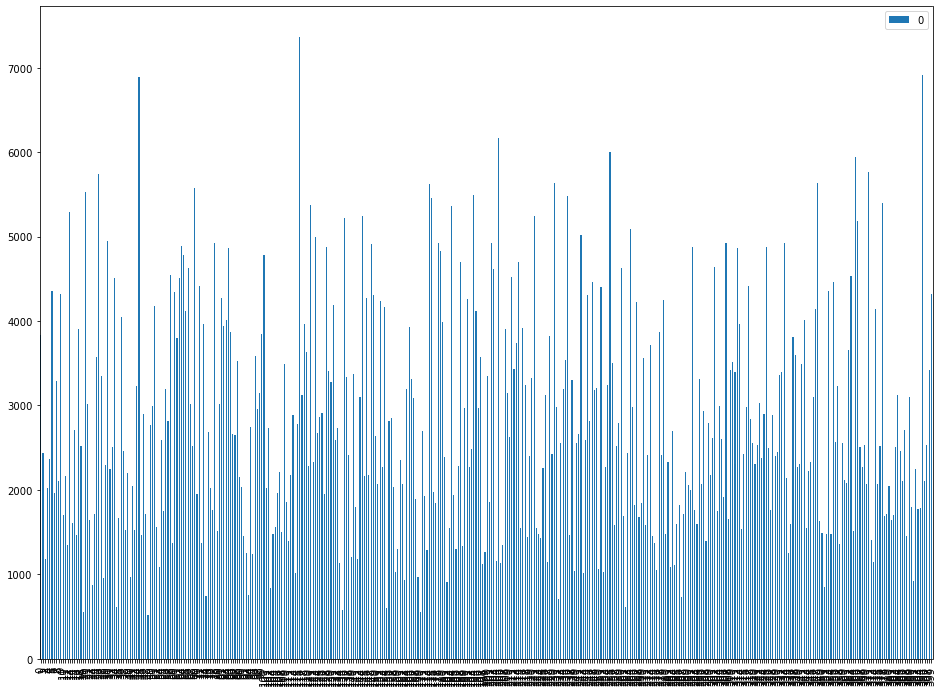

In [543]:
# plt.figure(figsize=(16, 20))
pd.DataFrame(h).plot.bar(figsize=(16, 12))

In [524]:
models[4].phi_.T[('@default_class', 'теледебаты')].sort_values()

topic_0      0.000000
topic_341    0.000000
topic_340    0.000000
topic_339    0.000000
topic_338    0.000000
               ...   
topic_159    0.000000
topic_158    0.000000
topic_171    0.000000
topic_499    0.000000
topic_1      0.000484
Name: (@default_class, теледебаты), Length: 500, dtype: float32

In [513]:
ww = 'швертбот автоспорт пикадилли маркет лондонец регбист техзадание паб би-би-си возмутитель таиланд уимблдон йоркшир обнуление ирландия фойе мангейм дискета хиппи нивелир бристоль австралия лондон теннисист теннис сан-франциско рольставня автогонщик садовод оксфорд пенни ливерпуль великобритания фанат запирательство пиксел кроссинг темза латиноамериканка плимут пинта газовщик мейл фонт шеффилд коста-рика хайвей швец соборование белфаст суперинтендент автоклуб пентхаус дублин'
for w in ww.split():
    print(f'{w:>20} {round(idfs[w], 3):6}', df[w])

            швертбот  7.796 13
           автоспорт  7.963 11
           пикадилли  5.478 132
              маркет  4.999 213
            лондонец  5.285 160
             регбист  6.112 70
          техзадание  7.588 16
                 паб  3.828 687
            би-би-си  5.037 205
         возмутитель  5.156 182
             таиланд  4.733 278
            уимблдон  6.353 55
             йоркшир  4.909 233
           обнуление  7.721 14
            ирландия  3.818 694
                фойе  3.546 911
             мангейм  7.416 19
             дискета  4.804 259
               хиппи  4.195 476
             нивелир  7.527 17
            бристоль  5.018 209
           австралия  3.247 1229
              лондон  1.831 5060
           теннисист  5.651 111
              теннис  3.561 897
       сан-франциско   3.71 773
          рольставня  7.796 13
          автогонщик  6.017 77
             садовод  4.884 239
             оксфорд  3.677 799
               пенни  3.781 720
           ливер

In [523]:
for topic, words in models[3].score_tracker['TopicKernelScore'].last_tokens.items():
    weights = [models[3].phi_[topic][('@default_class', w)] for w in words]
    tokens = [f'{topic}:', *words]
    weights = [0, *[w * 5 for w in weights]]
    draw_html(zip(tokens, weights))


topic_0: снарк саго птицеед уханье бег сова отступница кряканье древесина крон овраг слизняк погоня траурница кувырок взмыв полянка преследователь четвереньки лодыжка бочажок просвет заросль перелеска жижа заросли чертополох перестук треск грязь оборвыш елей кедр подранок плавун зудение чавканье мошкара засечка секач штангенциркуль тромбоцит совенок рало савраска

topic_1: клочочек лжесвидетель конкреция маклер оболонь нетбук галифакс градостроительство педерастия лузер киноактриса диско буэнос-айрес скупщик аргентина канадка январь матерщинник попкорн июнь де-мойн динамит лесовоз май искупитель монреаль киноклуб редакторша ноябрь теледебаты слинг апрель октябрь часочек баз плевательница ебло сноу неосновательность тяжелоатлет декабрь пролетарка перекрой сторублевка затемнение нектарин фэн-шуй фетишизм марокканец винил читальня буклет купчино клаб крестец электроснабжение сальность ванька февраль плутократия катран полбанки дансинг календарь сороковка архара топ номинал неуемность примечательность ла-плата сердар продавщица заправщик таксон зачарованность паршивость спар тримаран

topic_2: размягченность однодворец парсуна покровское кременчуг уложение монархиня осуществимость сказуемое малороссия болгарин москаль кофий царствование кортик государь пожалование экспроприатор летие москвитянин прожект указ иностранец подлежащее наказ фельдъегерь кесарь партийный цесаревна сношение ремонтер восшествие кремль санкт-петербург помазанник втора заговорщик пикет вольнодумец государыня якобинец одесса упрочение купечество генерал-аншеф карбованец верноподданный донос нигилист усищи обер-полицмейстер брасс кутеж благонамеренность взяточник дворянство градоначальник трехсотлетие палац мыслете русак курляндец одессит азов манифест лейб-медик отечество очаков расхищение народонаселение черкассы англоман реприманд упразднение откуп хозяйствование хлоп камер-юнкер казнокрад чухонец прошение отгрузка генерал-губернатор лифляндия спб фразеология водворение барство фашина обер-прокурор синод камергер веротерпимость царь-колокол цесаревич хищничество радетель лихтенштейн шпажонка зернь малоросс крепостник царь-пушка ильинка греча белуха карбонарий карата генералиссимус благочиние фрондер мекленбург вильна ландтаг клеврет крамольник фижмы временщик коллегия злоумышление молебствие лихоимство обнародование шверин свободный ресторатор кагэбэшник кочубей капстрана меринос синематограф курляндия стрешнево гельсингфорс водосвятие зоофилия иноземец семеновец холуйство флигель-адъютант брауншвейг самодержец писаришка

topic_3: франкмасон эламит манихей непримиримость протестант эффектность исповедание богословие идолопоклонство этнология глас христианство язычник самоограничение вера единство просеивание догма подвижник гуманизм уподобление скрижаль разжигатель мистерия католик эфедрин католицизм поклонение пророк соратница хулитель гонитель своекорыстие иноверец гидра христианка дер единоверец культ кагал религиозность христианин стягивание лютеранин фанатик ревнитель чепуховина наследие праязык мусака еретик сатанизм лжепророк протестантизм откровение нейрофизиология разделение бритт фанатизм гекатомба антагонизм религия антихрист почитание евхаристия кроманьонец секуляризация неандерталец поленица реформация пришествие фанаберия модернизм освободитель безбожник первопричина укачивание мученик последователь осленок язычество прихрамывание лютеранство завет поселянка цар духовная доктрина гугенот смотрение ганджа пацифизм чувствование высь православие гонение атеизм катехизис мосул равви вероисповедание теология нетерпимость богохульник провозвестник систематичность догматика верование вероучение фристайл конфессия агностик гекзаметр догматик обличение кам яффа ортодокс поджигательница истолкователь папство котурн безверие веймар обетование алогичность кальвинизм тупоумие ямб нунций гнилость шерхан отождествление перворазрядник кордит ручательство божественность выползень самопознание прожектер анафема чахоточная

topic_4: южноамериканец пятерка фуэте полдник подгузник электросварщик ялта третьеклассница радикулит зачинщица туалет измывательство валокордин марокко выворачивание кроватка дезодорант корпункт тахта переедание близорукость мимоза горчичник валик бутылочка отточенность братишка рабат косоглазие марь распашонка мцыри отпускник негритенок одеяльце кремешок пионерка игрушка карабах насморк раскладушка памперс радиодиктор беспардонность балетмейстер скукота тапок дифтерит погремушка некоммуникабельность маргарит стульчик штанишки жадина паста бойкот сочи аритмия пестик симулянтка абитуриентка таиландец салочки канары взаимовлияние однолеток затылочек заскок взрослость подшефный клизма веревочка коринка продуманность этажерка марракеш гимнастика боди препирание армянка спецшкола частное идиотство электробритва соска офтальмолог карапузик воздушник мочегонное красочность пахлава ходунок артикль гурзуф одухотворение псориаз медведково алтуфьево бессердечие простынка пеленка валерьянка шпагат звеньевой аккомпаниаторша местком донжуанство четырехлетие шахиня тасмания

topic_5: псевдонаука брахмапутра амударья залегание гималаи прибой предопределенность ватерпас непал прохлада бархан кромка пекло песочек горизонт мираж дельтаплан санскрит тенька самоистребление лавина дюна самообольщение элизиум ант песок сикким зной непалец тибет сахара пустынь соло теократия припоминание зенит соскок дельтапланерист песчинка тандем утопист пустыня неорганизованность хлор заструг централь динамо-машина солнцепек смакование взаимозависимость англоговорящий полусапог нанос орошение надбровье феноменология тантра самочка оазис выветривание такыр ватер фолликул интенция утопия катманду маоист морена каракумы водоток халцедон комбинаторика очеловечивание архангелогородец пачули бельгийка жара солончак остзеец шакти подкрылок

topic_6: сейшен гусарство злоречие иконография леность шоша добродетель корф целенаправленность анахорет притча ханжество алчность книгопечатание остракизм мистик закваска жертвенность мимолетность артистизм фон абсолют болеро педант цветистость баронесса мыслитель лобелия глубокомыслие символика гиревик волокитство алфавит барон косность эрос тщание отрешенность диссонанс переводчик гримсби реквием баскетболистка тождество инь перепев иероглиф безграничность прение байт личина постижение гейша геральдика авантюризм разобщение вставание отображение солипсизм афоризм шри мистицизм архивист глумление двойственность чередование брильянт софист письменность дао домоправитель выбрасывание самость бытописатель шутовство гедонизм экскурс скупость полемист искусственность тождественность иконоборец звукоподражание синопсис капельмейстер дилетантизм каллиграфия почесуха сокрушитель выслушивание фототехника подражатель геттинген многообразие откорм общность эйвон ирреальность блонда спотыкание несчастливец сеул корчмарь фосфоресценция

topic_7: пушица персоналия жакт обороноспособность крепление неясность горнило недосмотр трение сменщик телеком аксакал адепт старожил тарту радиоузел протекание тушканчик гриль-бар алхимик элеватор крупинка лабух гитаристка светопреставление зазеркалье индивидуализация обитатель пустошь чудеса зябь гнейс зажатость доброкачественность зернистость автокран аир залежь рейнджер гильдия протектор наб житель поселок сплочение приезжий талантливость перчаточка старьевщик гранит кипячение фрейдизм шлак караулка слив сцилла леониды неравномерность террикон обмолвка электрокар опрокидывание ватин углубленность распылитель коммерциализация распределитель страда междуцарствие испод расплав скученность язь телятник водружение снукер индюшонок швепс подведение пурист моргание кунштюк сосисочная старомодность жестянщик сортировочная коммунальщик мамона буковина тубус молескин руанда притоп прихлоп одометр заулок рами невыгода проецирование отвес

topic_8: балхаш диканька алтаец повесть постмодерн детективщик классик медаль ликбез капремонт повествователь примус барнаул главка ленинград собирание гороно ревизор прилежность кумач уголовный вошь речуга автобиография самиздат курск хихоньки прогрессивка баня биография иртыш сочинение обл валютчик трудодень училище сатирик гоголь комендантша литературоведение техникум стлань мелодраматичность остряк бер р-н литература алтай классика совхоз перестраховщик омск фарцовщик фразеологизм курилы пиджачишко анадырь свердловск разнарядка новатор общага сокурсница клакер колхозница минусинск эксплуататор госкомиссия детдомовец хорошист ташка разбросанность узбекистан фальсификатор переделкино соцреализм похабник чукотка самоподготовка шестидесятилетие отличник росстань соцсоревнование неуспеваемость девчата фрагментарность однокашник папанинец чукча фотоувеличитель переложение алма-ата новаторство игарка ментальность нумерация аккуратист искусствоведение общежитие бийск сподручный цензор доказывание петровское перово одногодок публицистика физвоспитание артек сольца светокопия сибирячка мишкино мтс творожник переименование саранск раскулачивание матерок букварь матерьял череповец землячество фильмотека кантемир макивара

topic_9: дипломница микронезия служебка ситроен пятая фольксваген сидение карру спинка крайслер швейцар колчедан аврора мафиозо линчевание малолитражка водитель хакни кожан зара шофер роллс-ройс филиппинец лимузин трапп баранка карлсруэ дальнобойщик таксомотор автохозяйство аккредитив автомагистраль дьяконица ланды гейдельберг седан клаксон видеосюжет

topic_10: келейник кропило мориск щецин пипа диковина произволение сват инокиня пейс золотуха приказчик кушак мерлушка угождение сокрушение голосище порка безучастие архиерей раскрасавица цербер дозволение пенник заступник плут вдовица блуд сбитень гордыня слобода сукно вероятие молебен смарагд рвань грех сласти скоромное спас внучок чревоугодие овощная шинок падре слободской нощь внучонок ярыга хасид како шарп батюшка подворье алькальд умелица казань непотребство монако мещанка новь боязливость изволение цыганочка дщерь царицын глаголь дурень управитель пищик христопродавец благость срамота попадья ордынка скорняк блудница гостюшка вежды купчиха параша институтка расстрига питомица шестерик мордасы говядинка козельск власы увещание миллионщик умет невестушка прелюбодеяние мещанин утреня самоуправство воздвиженка устроение коимбра голубица офицерша распорядительность драпри козлище роток вразумление чумак деньжонки дородство ферязь поп просып масленица разделитель стогна недолга

topic_11: перестукивание митино кощунник электропривод кореянка шантажистка регистрация москвичка гуканье видеонаблюдение золотце шмель мучительница парфюм нужность свертка фотоателье летчица скайп портфолио антураж окурок целлюлит шатенка порнобизнес нхл нарды бортпроводник гаджет салон топика зажигалка билайн хай пароль ращение вальщик тренажер эксклюзив индифферентность мати стерва пепельница наушник хайло логотип дмитров сатисфакция обслуга валяние тверская волхонка гарнитур послушность покусывание брюнетка тунеядка рублевка евро трамонтана презент нокиа безынициативность самовнушение притирка экстра-класс лэптоп свч чумная пепси-кола минивэн глушилка вальяжность корсак прыщ панибратство убивание снимка неоклассицизм дипломатичность садистка потаскун пречистенка молока огонечек несуразность канифас велюр комфортность вкладка перегруз лужники роуминг тушино бизнесвумен коридорная плеер рьяность шамканье полулюкс уродка колорадо-спрингс полузащита выдирание телевышка искринка прагматичность

topic_12: мясник мульча дворник отечность скульптурка ага кайла мазер урожайность норма нокдаун тяжеловес квинта негритос мамуля раунд ихор папуля реслинг боксер боло катания пиццерия корка инка почтальон кайло пицца ринг грузовичок вербена гедонист дворницкая кафе-мороженое херувимчик злюка ретивое студебекер выхухоль аттракцион тихоход посапывание мужчинка камелек тойон сигнализатор кусание бассет-хаунд

topic_13: непослушание вара головенка невнятность мурлыканье умиротворенность сердечко противница незнакомка плач падчерица горечь ленивица шейка рыдание всхлипывание прикосновение тоска личико омерзение ода разбойница жердочка какаду гематоген солодка шепот ресница кулачок попугай лепетание прислуживание вено неистовство клубочек слезинка таракашка мачеха распутница хохолок забытье губка невинность сумеречность полусон чресла дрожь изменница этиология шелковистость смятение даяние ералаш неискушенность цирцея сковородник биение гаф наэлектризованность зубчатка спазма грэй плойка

topic_14: ухоронка начдив подстановка рачение лычко завхоз репа ахен кукиш хары голубика исчадие лярва баклан клин наколка ступа общак оракул вычет эгер самосуд сука больничка морока кумпол посинение раззява знахарство цех дармоед закром бульдозерист растяжка острастка мордобой прихлебатель мандраж листопад глухарь пиф симбионт аммоний колесник умишко рожон путаник шантрапа поганка миротворец подлянка перекур разброд гад централ мразь мелочовка бригада навар силища ямища молдаван харчи шнек путанка феня соловей ходок покойничек сучок гнида плешь дурость единичка полымя стукачок драчка ноосфера створ выкормыш дужка задоринка напалм печник припять труха обух ревень беспредел вертухай сопатка уникум промзона ляд падла непонятность пифия гадина полесье кунг наладчик матерщина перелаз мочило черногорец натяг беларусь чирок закусочка лекарка кузовок бикс болгарка лепота ливер паскудство шаманизм вражина лапчатка гута роженица дереза темечко наймит загиб локалка хищность маломерок шкодник рым калмыкия распыл ивантеевка

topic_15: вилайет бомболюк перегрев мелодийка фата-моргана эстакада мусоровоз автопогрузчик диспетчерская гидроплан строп гидрант дирижабль визир мотор стартер сирена парашютист пират макеевка скандий тарахтение парашют дырка пиропатрон пиратство радиомачта реаниматор бензопровод напыление металлолом кабина скрутка комбинезон сомалиец касатка слалом проводочек бомбовоз сбрасывание поломка преферансист бермуды пипочка стекловолокно суданец высотомер бортмеханик

topic_16: кербер батрачка боровичок фарисейство пласт лукошко стигмат экс-президент шампиньон гриб подкормка неоспоримость сыроежка кора подосиновик драже крица грибник кача долма грибница подберезовик масленок хала кордова спелеолог экономность приезжающий дед брачок прикладывание ревизионист добрососедство рений маковское малограмотность фасетка

topic_17: разумность расселение планетолог эколог антипротон фобос первопроходец раса альфа перенаселение взаимопроникновение экспансия перигей биосфера шебека тысячелетие колонизация цивилизация планета рождаемость абориген гуманоид биллион центавр освоение жиро ресивер усреднение экзот заселение шершень синтетик перигелий портовик прародина планет тес кластер зонд эридан парсек буцефал инопланетянин нелогичность первопоселенец галактика говорун

topic_18: пикадилли суссекс ослик баронет уимблдон денди кэптен сэр укромность джентльмен олдермен мистрис кокни иждивенка

topic_19: герилья хамада отпущенник па-де-де вакуоль бессмыслие минералог наигранность тараторка покорительница отлуп герметик страстишка симпатичность несварение ложноножка амеба удмурт будничность грим авторитаризм пересев хмыканье лесопромышленник вельвет люк обрубка пройма корнет-а-пистон герметика коноплянка амин малларме прагматизм украшательство сайма электрокамин абстракционист производительница оцелот одесситка тахо кобленц обычность дагомыс вольномыслие монументальность бакен чичероне артистичность электрокара культурология бесстрастие килим грубоватость прищелкивание текс кельнерша сарабанда кряк шлепание

topic_20: моделист оболванивание ночница прайд тис жгутик подбадривание гарь язычок морок всполох щепка вспышка утконос сноп грохот диплодок невидимость летун ловушка тик осколок зарница прыгун кобчик искра пламень фундаментализм тварь крохотуля фантом разрыв ретирада панга ороч прятание воронка загогулинка варна косач батальонный пепел нетребовательность любомудрие шелестение вихорь японочка санбат

topic_21: умбра йокогама овчарня роба сакэ япошка соплеменник бирма станочек этруск репетиторша харбин харакири саке бирманец камнетес вождь ниигата блеяние гест вол руст предок пастух сегунат колонизатор якудза килиманджаро стадо фудзияма племя токио япония панбархат овца тамтам японец гаруспик динар самурай латифундия японка штутгарт колонистка гэс дайме опыление кимоно пария киото рангун туту высотник саппоро отара уганда масаи горлянка пагода функционал

topic_22: ланолин ванилин драбант сотняга пульсирование кандалакша казенка бывальщина коррида шкапчик аффектация каторжник благородие провиант тотьма грамотей пуд бомбардир куттер колоколец рыбинск кунсткамера щучье чирей лавра перезвон храбрец поручик архангельск колокольня колокол разоритель соловки двина оказия болтание уксус тенорок безмен солдатчина тихвин бригантина кормщик оптина раскольник медь благовест звон закута начетчик капитанша гик слободка голубчик выборный промысел фуражечка фортка большевичка колоколенка темляк мортира высокоблагородие балаболка маковка опока кум онега пикадор золотник кастилец колотушка литейщик полуверста задрыга сухона ландрин пирожник нечаянность старовер култышка штабс-капитан портсмут екатеринодар восприемник подволок помор звонница тореро дублон контра камора бизерта титло тореадор татарчонок енисейск холерный призрение многолетие трезвон опорок карбас симбирск поморье звонарь штормяга шлиссельбург бендеры овернец лукавинка ходынка черноморец зуек

topic_23: карча кази курултай гринго скатка безводье эривань возничий половичка тянь-шань юрта окоем иноходец хан конокрадство чабан кафа чебурашка аил рель кизяк шваб мурза слива неучастие тутовник проворность разнотравье степняк чекмень нойон галичанин бунчук темник чурбан барышник междуречье киргиз свежевание кибитка степь целина лаконизм пиала конина фирман стрепет монгол хуанхэ маркитант арча кочевье стригаль кошма кобылица тавро саксаул морген попущение тархан сумы ковыль подолия подкова омуль шпора марийка разъезд войлок фистула барьерчик ханша обора башкир лех урга фермерша коновязь хрипение мазанка кочевник сомбреро апаш арал недонесение кипчак свистящий убоина паломница кумыс кяхта пианола курд дрофа бахча обводка нукер бурхан ханство коновод полоняник накомарник приплыв персиянин улус хлебопашец коробейник котлин мургаб таган шаровары персиянка табунщик улан-батор сырдарья чистосердечность поджиг казан поплин

topic_24: одноколейка штокроза секстет тойтерьер гонолулу харт партсъезд дежурная левизна тактичность собственничество инвест товаровед янки комфортабельность экс-министр черемушки санэпидстанция коллекционер коллекционирование газетенка марка отлагательство полупальто назойливость манто телеграмма пахта коммивояжер самозванка еженедельник миллионер срочность журналистка нашест посетительница экивок раритет касательство непоседливость телеграф чистоплотность лайма предубежденность рублишко бел невротик интер атлетизм скандальность филателия тюбинг шаловливость эмфизема златоцвет коллекция автомеханик заметка зажиточность презентабельность ихтиология смугляночка дрек атрибуция диспепсия одурманивание авиапочта обмирание радиотовар тарасовец

topic_25: гарнитура культтовары дублер маячок электросварка мигание анальгин транзистор провод шунт кинокамера непроливайка бобина панда лобан крематорий значок динамика громкоговоритель аппаратик плафон рычажок самолетостроение цска сейсмолог динамик многоугольник брусочек массовость индекс микрофон штепсель микроб аудиокассета приемник легкоатлет зуммер эдельвейс подстанция пощелкивание катушка разметка контейнер пунктир пленка ориентирование радиотелефон электропила модель радиоуправление рычаг электромобиль стенд второклассница фотолюбитель беззвучие пепин кинопленка засветка аппарат озвучка накат адаптер рефрижератор воздухозаборник воронко ролл перспективность автомагазин участвующий освещенность триколор дезактивация скороварка новосибирец ламантин спорткомитет зябкость

topic_26: амариллис отит суперлайнер прижимание эластичность отдушка кислотность открывание тапочка подсластитель тиканье поскрипывание белье начес шлепанье пухлость пружина газоанализатор площадка замазка паркет менопауза рама резинка электродрель заметание закрывание рейка прищепка расческа лапидарность прищепок проталинка свитер пижама сквозняк тапочек золотарник перебазирование шторка бадминтон перебивка шарф подоконник генерирование пудреница невыносимость рулон лужица рулончик линолеум ступня полиэтилен колтун вязка паллиатив косынка занавеска строеньице горообразование шарпей гагра нейлон изножие помпон антициклон шарикоподшипник каламбурчик изолированность запирание огузок щекотание экстракт чурчхела плашка лучезарность антиреклама папула дед-мороз шоколадка аэросъемка разноска хлопотунья глухая неузнавание деактивация полка

topic_27: березовка отрадное шлих комедиограф грузооборот щебенка перекат вдумчивость дождевик вздрючка элениум малолеток долина дрючок водоем цветочник аквариум водопад плашкоут свая волгарь взгорье тучка наводнение баржа севрюга синклит брегет землечерпалка водохранилище шизоид ливень карп благовещенск вяхирь аварийщик хиромант зея байдарка сиг кунья гофер медальончик невзгоды чебак лариса рыбозавод мятежница озеро рыбка кипень мотыль фауна дафния плавунец баснописец

topic_28: суточные форштадт полукафтан генерал-адмирал сопелка смиренник англ норманн сакс торн фрисландия датчанин благообразие аварец касли гузка увековечение скотт плаха альбион вентерь виконт дания бекас ягненок саксонка следок франциско пильщик рыбник экзерциция черныш британия предатель старейшина степенность бобренок сокольничий перемирие палисад палач ветврач морозище борзая графство норфолк ликтор непомнящий ферт недоросль примас ревель бретер крейсерство фриз попустительство тезоименитство хатка тесина датчанка скандинавия гемпшир померания алеут редут самовольство алан йомен аскер

topic_29: зарод калабриец зверок конопля шайка травник хопер посев колос пшеница береста огородик неразговорчивость клевер горянка зеленя бурдюк жатва урожай петрушка мешок человечина отродье усадьба добытчик пугало воротца страшило селение селеньице собь озеленитель кротовина леопард колосок оборванец беляна дудка садовод деревушка тракт харчевня аджика жмых отруби подрост межа игрец крикун купчик ватажка киноварь берест посевная клубень мотыга возделывание венка тунгус страшила огородник прасол подорожник корнеплод собирательница масленка дровосек сарынь ларго злак зерновые чудо-богатырь ленок всходы

topic_30: рапсод ковырялка рюха мелодраматизм лестничка проулок переулок тушкан гжелка монтировка пешеход дверца тупичок улочка булыжник амальгама мокроступ таеквандо лужа продавец прилавок прохожий зеркальце трясучка мерседес динамизм разносчица громила асфальт гостинчик тротуар ярь сверлило скипидар домкрат запаска смехотворность пролысина буйволица пальто неваляшка невзрачность вуалетка пальтецо перехлест маниакальность визирование пальтишко

topic_31: курчавость атта винокур добротность киносеанс поставщица месячные мадлен желток необязательность энтузиастка чурочка кур готовка лапша ананас пергола орех апельсин несушка яйцо такса подкаблучник бархатцы натирка пасха лентяйка зять дайджест пашот дижон цыпленок рис утенок заочница плодовитость скорлупа шато ценительница неряха стихоплет раскованность бистро переезд покрикивание севооборот бордюрчик глицерин бессердечность фрикасе локомобиль болтунья причмокивание тефтели непохожесть сидр мирок дюшес паслен многословие одеон лень джерси бери-бери фигаро контент восьмигранник студебеккер календарик гранд-дама питательность бельведер недолговечность умывальная избалованность зубик стенокардия развитость тюбинген

topic_32: пленный беркут новобранец медтехника военком сержант невыполнение кокарда звание мародерство присяга разблокирование приказ орд неподчинение терц пакистан франкист верноподданная рядовой исламабад искрение ябедничество искательство

topic_33: жница карбонар борок водосток саркофаг подвес мумия нашептывание обнуление троглодит зубило водопровод крышка тарантул лесенка цимбала маргаритка звукоуловитель труба плита лампа мары пеструха поддача насос колодец лабиринт клоака слепой штукатурка котлован кальмар подкоп канализация парашютистка рейв пита дистрикт накаливание исподники подхват всасывание беганье постыдность откачка гремлин аком озадаченность кадастр примула калган подвал углекоп помазок забывание клептоман матт крохотулька морф

topic_34: погранзона энсин вылавливание архивариус декада твердыня лапища гарм прометий стилет нелюди переаттестация беззаконие трот хорт квеста хоббит членовредительство курсантка полиглот сородич стандарт канон костерь конга крин тремор рапа прародитель орк подгорное прево велеречивость поддавки ксенофобия расизм расист перекупщик экзерсис хук бородавочник боскет битюг хелм кобольд соленоид нелегкая препаратор бадахшан кристаллография телетрансляция зазнайство маслинка эсквайр орчанка актюбинск анатомирование айран пересчитывание любэ арда властелин

topic_35: загрязненность кронверк вычерпывание гидролокатор пескарь икринка гребло водолаз волнолом малек саженка заводь затон аск уха коралл протока жабра весло мостки буй акула багор мелководье акваланг щуренок отмель проток перевозчик тунец ихтиолог водонепроницаемость лодочник камыш лодка тростник аквалангист поморник бакенщик бечева ракушка водоросль пирс плеск рачок устрица шитик лодочка днище быстрина краб осьминог лесопильня мосток колюшка троицкое купальщик ялик мурена плес утопленник сыроедение гребок тритон лодчонка ласт жабры леса макрель барракуда подлещик острога моторка грузило заливчик нерест щука гидроцикл плавник ставрида удильщик гарпун ерш меч-рыба стрежень уклейка поденка кряква рапана плавничок кувшинка

topic_36: эмпирика грандиозность правка орфография пассаж импрессарио статья бесполезность сноска синема литера приложение скобка сюжет высвобождение предисловие тенденция профитроль марафон именование аутсайдер подъесаул масштабность цитирование сансара оголение потакание шрифт оглавление текст диссидентство статейка упорядочение перечисление недобросовестность цикл повтор написание озарение редактирование бездонность декаданс переписывание уравнивание цитатник стилистика экземпляр фестиваль формулировка становление шероховатость обыденность тематика составитель аутентичность гласный сопоставление синхронность опубликование словосочетание иллюзия мистификатор киносценарист концовка поправка дубль опечатка раздел нарастание материал бензол индивидуализм начертание машинопись иллюстрация библиограф препинание сатурналии медянка энциклопедия ляпсус адажио транскрипция скромняга иллюзорность фантастика литер естественник неточность киносценарий заваривание угадывание неоднозначность направленность грампластинка самореализация профанация насыщенность неуспех кворум каретка дедлайн махание дзэн вантуз сопроводитель упаковщица созерцатель дежа повседневность паноптикум суперобложка электролит гласная морель либеральность

topic_37: антиген подлипала обжимание сдувание парнишка военрук выбивание несговорчивость слабак ноктовизор уренгой кармелит сопряжение стерилизатор колбочка кровожадность заусенец жгут подвид неуязвимость игла хота разбивание подросток трамвайчик фатальность шашка поршень тумба шприц триплекс укол эликсир кпк недоделка мельтешня гаррота красавчик дан клистир рассечение доза стереоэффект автопарк фура сопромат самосохранение вич-инфекция ликвидатор инъекция гантели разборка зарядка комплемент геометр антидот выжигание крепыш порожняк чобот физкультурник бандаж воронение тугрик трепач самооборона проворот сипение стометровка юла чистильщик телекинез ампула клевок глобализм битник провансаль фармацевтика техничка замещение нолик подгруппа схоласт великомученик литий безумный разъединение дамка щелочь недоросток подхалим вендиспансер лишенец ковы недостоверность миллилитр архат зачес спойлер чапаевец примочка ямал хавронья характерец развоплощение поджарка концентрация кивание пражанин силикоз диспансеризация перекачивание

topic_38: подпора волчонок брод свора сатира кета галушка пак гиппопотам съедение оборотень волк вой белоснежка киш кельт сатир русс камея лангобард дэв полнолуние стандартизация подвывание реконкиста

topic_39: туманец заозерье выкидывание полукед вагант рубака десятник мена гоблин полуночник валькирия орда плен наручи мщение злосчастие клич набег латник шаман талан гурд алогизм верховенство юкагир пленник копье пограничье секира забрало совратительница хромец вояка менестрель рыцарство поход камлание выворот резня мещера стяг минотавр синегорье ссыльная лесовик мом инструментарий негус фазис ворчливость ряшка ясак поддакивание манипула

topic_40: инсайт согд индоевропеец умывальня стайер любек разбегание малайзия диспут борнео панк инкарнация горки пенджаб смычка самоуспокоение заз амазония творец ромбик конкистадор импозантность отдаленность мейнстрим рок-музыка андеграунд альбом ацтек хиппи мусорщик тайфун триест амарант оса иезуитство скиталец колониализм шаблонность землячка выкапывание габон туземец отброс вагоновожатый универсальность гей гвадалахара хорезмиец собиратель люблин трамвай эмо компилятор плагиатор каста холокост автокар абхаз колбасник лейбл фронтиспис отбросы дюк бездуховность собирательство зарисовка автокара макао каучук кратковременность торо сплит революционерка паразитизм аккад многоженство бизнес-клуб матриархат резонер моторчик альт гончарня флейтистка калан афганка догматизм субкультура повестушка кинетика ливанец ормузд потоп сингл тинейджер астана метиска педантизм яйцеклад релиз захватчица лютеций ираклион ураза синоп гран самовосхваление мойва сухуми

topic_41: башкортостан растеряша рифмоплетство голяк внучата безоглядность петушок приемщица цум охламон хорошевка партсобрание авоська башкирия дворничиха справка дача бряк беспризорник жуковка коммуналка односельчанка баульчик кооператив счетец загранкомандировка командировка оболтус шашлык пенсионерка павлин арбуз портфель калоша детсад заведующая исполком винегрет жэк тетечка сублимат струение гто спекулянтка оголец очистки учетчица зятек арбат тамбов гастроном петушки хачапури унитарий микроинфаркт здравница десятилетка гривенничек фазенда телефония малаховка тетка продмаг конструктивизм пиявица

topic_42: придурковатость просматривание размахивание оздоровление мазохист сеточка моча перенапряжение поджилки перхоть минздрав паралич тройня позер соломка зараза пирамидон паралитик дурдом красочка беременная атропин извращенец диплом зет растяжение позорище отравление инфаркт язва шрамик неопрятность стоматолог ожирение заноза идеограмма дурачество краснуха психопатка блат псих шейпинг типчик симулянт свинг эластик пончиковая токсикология видок извилина сессия воздухоочиститель вывих сертификат капитализация скорпион рассматривание аэробика мигрень отгул симптом мусорка корпоратив эпилептик скопидом вручение метраж буча наркоманка венесуэлец пломба вечерник составляющая лобзание панталык выволочка картуш противоядие пугливость питомник универ аллергия парализация биофак спецодежда недержание возгонка культя буйнопомешанный ярославка позитив пролонгация дизентерия волюта наполеон мизер справочник лизание рвотное энурез рассадник спонсирование анаболик протезист ичп электросчетчик валерианка бинтик сынуля собаковод дециметр лосины влет наркология радиомастерская облагораживание протез шуры-муры ленинградка прыгучесть лесби венеролог собкор гомофоб собачина доплата заразный лямочка атеросклероз ювентус

topic_43: гомеостаз эндемик реактив микробиолог заражение ассистент вздутие реторта обезболивание формалин дофамин кровообращение нейрон лаборатория симптоматика токсиколог шизофреник гематома препарат пробирка подтип аптека наркоз галлюцинация зародыш трансплантат бацилла мозг остеохондроз кардиомонитор колба яичник кси сотрясение закупорка раствор физмат фармацевт противопоказание печень селезенка орган грипп диабетик эритроцит пилюля бюллетень натрий эмбрион синапс стерильность лаборант цирроз сосуд метастаз фармакология подкорка пускание биоток кровоизлияние неврастеник диарея диабет сечение читалка недостаточность катализатор электроэнцефалограмма нейрохирургия почка бейрут аутизм выпадение бесплодие гнойник переливание опухоль сопротивляемость томограф инфицирование кровоток токсин мензурка жизнеспособность абсцесс постепенность электрокардиограф свертываемость колит гербицид фурункул микромир ристание бронх свертывание трансплантация вирусология гомеопатия энцефалит зигота токсичность докторша

topic_44: мастихин графология индиец агрессивность лексика властность чуткость садизм галантность спесь собранность фоторепортаж месть манила дилемма хартфорд костлявость ничтожность самомнение озлобленность одержимый недоброжелательность фиаско невозмутимость невредимость сопереживание бангладеш доверчивость ватерлоо синоним покинутость обаяние аристократичность протеже неувязка иммигрантка самоуверенность устрой всесожжение ваучер изворотливость условность отклик батист инжир мазохизм завязывание тщеславие защищенность убежденность реванш категоричность аферистка презрение осуществление очищение атеистка предупредительность скромность напористость хань целеустремленность самоутверждение диктат бесцветность свобода бесцеремонность необузданность линкольн свершение вспыльчивость заигрывание инстинкт корректность дотошность местопребывание мягкость эмоциональность проницательность экспрессионист предусмотрительность неприступность изысканность неуклюжесть чопорность эгоизм официальность наивность возмужание сознательность бенгалец обходительность фибры кровосмесительство сантьяго брюзжание щепетильность европейка уязвимость маскат кощунство отверженность наблюдательность невоздержанность многие пронзительность сегрегация хаотичность единомышленница подлог транжир баптистерий невоспитанность пустослов поло стаккато оман уверенность мысик изобретательность извращенность рица разлад сизаль тиранство измельчитель

topic_45: репина канцона серятина монументалист пай занудство бигуди заменитель нацеленность подиум родильница наклонение иглоукалывание подлец гадание трансвестит подсев безнадега маляр показ детская надувательство сглаз аборт похабство харя домработница пеленание суицид роддом проигрыватель родовспоможение психолог хиромантия ссаки предательство дивиденд фетиш вранье фобия неустроенность заикание мотивация кружевце дефиле китч доносчица инсектицид неплательщик кришнаит типаж измена оторванность изложница лилипутка кутюрье луддит нормальность санитария избранность алименты трагикомедия яна тайность видеокарта заламывание неврастеничка нежелательность покровка харизма шуйца слюнтяй узи скандалистка сонь ритмика потенция литовка армавир фальшь хамство актеришка генплан асимметрия накрутка галиматья созерцательность мухоловка разжива манекенщица белуга креслице водобоязнь доверенность окончательность беженка зачин кинопродюсер мелок новорожденная югослав апельсинчик злопыхательство балетка невыплата инжиниринг порча смска ароматерапия коллаген егорьевск уловление сердобольность цаца

topic_46: одноколка дворянчик сент-джеймс-стрит кларет лье провожатый кассия мажордом карета ритона щеголь камердинер невежа грум фаэтон форейтор слуга ливрея милость камзол дож англичанин отвержение увеселение копыл коринфянин камеристка лакей ольстер лудильщик запятки столование портшез легитимист коб

topic_47: спринтер героин тектоника феромон электросеть клаустрофобия комикс кокс картонка наркодилер плексиглас паранойя либидо стимулятор кокаин штрихкод опорожнение наркотик прима-балерина назначенец одеколон корректор ломка бесформенность размыв наркомафия макензи симуляция дилер канн монокль отгадывание бисексуал наркоторговец прямолинейность барьер комичность копирайт параграф комбинация вырабатывание засыпка латунь пойнт колон щелчок танцплощадка карьеристка гюйс видеофильм магний ценник наркоман прерафаэлит истязатель консенсус наркомания привыкание вандализм кокаинист разочарованность напластование клейка перфорация ощупывание стероид дебильность резка штатский выселение смертоносность прокаженная вклейка хаки монтер ноэль коммунистка заливка ингалятор жирандоль химизм пуэрториканец подземка употребление балок

topic_48: везир юфть мелкость паранджа гарем кабул герат бонтон триумвират пешавар дирхем тюбетейка ростовщичество пистон провансалец кизляр деспот каймак плов кетмень обидчивость султанат пакистанец дадли шурпа лаваш кандагар муэдзин иран талиб хитреца баку жмурик обожествление прямизна персия триполи камарг термез мечеть мамон халиф арык кишлак закаливание петуния гяур бей хива мусульманин самарканд школяр надир фарси бея бакшиш церемониал шах чайхана арабеск ретивость иранец острословие кафир татарка конформист олух афганец неаполитанец пуштун хорасан таджик мусульманка дамаск минарет дербент скандирование афганистан падишах халифат суннит востоковед полумира касба правоверный ливиец сирия лазурит тунисец эмират вальядолид огнепоклонник шербет шорник сицилия эмир хасан отрепье военнообязанный разгильдяй плиссе исмаилит шальвары пушту туркмен азербайджан всесилие эфенди рамадан караван-сарай сельджук фергана корсика газни каддафи тосно облисполком доде драгоман тегеран магриб арифметик бухара кадий генуэзец дастархан шираз перепляс обязаловка феска петунья делирий меря мерв

topic_49: скалозуб партнерство игуменья донна послушница чернуха бакалея буффало пересмешник бензоколонка словак пикап вывеска монахиня паром воспитанница квартал крипта витрина шляпа модулятор искусность дормиторий фокстерьер сент-луис тулья франтик дань постриг магазинчик настоятельница пастилка сумах шарлот веджвуд раскладывание аден столетник убор гуцул закусочная стокс флик скотч-терьер поверенная талсы привратница коллаборационист

topic_50: буффон фламандец придворный фрейлина цареубийца трон ура-патриот бургунд аудиенция монарх суверен величество дофин корона гофмейстер депутация король свита гунтер бургундия коронация герольд венценосец камер-фрейлина правительница церемониймейстер анжуец коннетабль эно коронование дурбан дофине делатель пикардия беарнец

topic_51: штабник радиоразведка копач вымпел спиды маннергейм эвакуация кортесы соединение неразрешимость заступление дислокация малочисленность украина здоровячка патрулирование снабжение контры волосатик симферополь брандер моторикша пост коммандо махновец район главком балтиец оправка колчак нейтрал дезорганизация резерв коверкот середняк севастополь продовольствие таджикистан басмач бандформирование несение патруль банда отряд переправка фритаун абхазия слаженность буденновск бурятия батуми перебежчик алушта автоколонна оснащенность наугольник мелитополь керчь погранзастава комбижир херсон новороссийск евпатория приморье спартаковец фреон убытие урус-мартан зарин газогенератор евроцент картографирование карадаг салажонок метемпсихоз крым таврия тачанка тельник комбатант скручивание двухкассетник многоборье лемнос поти майкоп лапанье абажурчик тамбовщина

topic_52: экстракция жох медиевист скарабей спикер удой инспектирование браконьерство мескалин киллер враки загорание браконьер стая копчик козлик взаимовыручка жучок базель падаль покойник жучка метка рисс волчица шапочка тали филин энциклика автодром аллейка ниспослание пляжик хлопчатник пупс гросс вожак возложение комо буквочки каштанка шажочек бабай тля гвельф ячея фамильяр

topic_53: мужичонка барокамера касательная мститель зайчатина книжник радиопередача люгер сомнамбула таймер компрессия сак перевертыш цилиндр объездчик хам ножичек перекос измор сечка весы тезка посмеяние удавка рассол брада ралли плесень стервятник жюри саженец обод навеска костяшка собачатина форинт шредер жмурки луна-парк взвешивание нивелир клайд рудимент визаж прапор клепка радиостанция лилипут кореец фора подпевала гранд целлулоид плеврит клон патриархальность змеевка чересполосица врезка маховик троян хватание исходник винзавод слот домино фокус-покус селедочка цветик радиостудия техосмотр произрастание сачок радиосеть суккуб митоз подмигивание воздуховод рекордсмен уничтожитель ди-джей заваль сопричастность футлярчик беспорядочность нагреватель омоложение пароксизм серпентарий кака силикат непоправимость антик артикуляция ключник маринист непропорциональность малинка мажор мигрант велосипедистка капрон горбыль сигарилла телекомментатор трансформатор поляризация соя

topic_54: субпродукт тропосфера ванадий реле ускоритель озон окружность отсчет дюза куб гироскоп амортизатор гравиметр многогранник старт сингулярность верньер эллипс невесомость орбита антигравитация кораблик конус гравитация ландо скопление вакуум полет диаметр разрежение горечавка эклиптика ускорение вычислитель громадность материя космолет космонавт полушарие космопорт тимор ось космос анабиоз отсек притяжение звездолет астронавтика инжектор стоун самопроверка рефлектор полусфера мириады тау стабилизатор портулак кристаллик квазар ракетодром антивещество голограф молибден энергоустановка стратоплан кристалл звездоплавание демпфер кислород обитаемость гидравлик рыскание дезинтегратор метагалактика горельеф трансмиттер курсограф концентратор радиоастроном элизий

topic_55: ворожейка дисперсия чебурек кофей васильков педофилия палас чадо выг мыльница холестерин чад афро инфанта арабка управдом мартышка копенгаген фужер кока-кола кафе кинопроба кран разносчик гоголь-моголь турция арарат долька чипсы киноактер гата клип валек лимон кальян подтяжка сериал пити грена джинс балбес квиток чревовещатель плутишка шик нудистка инфант турчанка ситком штангист соотечественница подзеркальник дилетантка поскребыш загреб диафильм хайвей совочек шемаха нус самосозерцание голоштанник первоначало

topic_56: загрязнитель минданао привереда создатель уродец перевоплощение зев воскрешение кара ясновидение двуличность шира кошмар каре самоизоляция варга хранительница трансформация перерождение капание соплеменница облик чтица человечишка сепаратор обличие бодхисатва эриния сарны легкомысленность пантера ситце обманка взращивание демон кар дебит тромб опекунша рафтинг истовость бесовка дьяволица демонология носительница деструкция бессознательность сибаритство амбивалентность слезливость гэл копенка растворение

topic_57: приозерье ерник конник конь всадница понукание арат кавалькада седок верховой бальдр камча цокот бесхребетность сорго венд копыто туранец лата оголовье коняга дыбы вороной разбойник узда скакун замор скак седло торока бола поселянин белен барс саадак шен чепрак стремя подпруга гнедой дос греховодница всадник благотворность шхера лука

topic_58: сережечка еры мотогонщик шлиц гром пряжка кировец комби молния прилив снопик джин торс нарцисс ремень гроза лепесток выпуклость застежка раскат дуга фут трутень туча дюйм вайя нелюбезность ипомея лесоводство сабинянка купальщица цвель вершинка прядильщик кольдкрем тычинка

topic_59: лечо дензнак электронщик пельменная ацетон ладушка хрусталик пластичность гроши конспирация браслет слайд подобострастность скупка невозвращение сбытчик рекордсменка мельтешение слабинка допуск подхалимаж браслетик везунчик клещ откат втык родственничек спец хохма облом недобор самбук долгожительница реципиент напарник казино невозвращенец плакатик усечение шестерка дерганье рефлексия скотство скудность кондиция писулька нарекание наркота ячейка психосоматика мегаполис обвес ершик тета генезис дармовщина хрыч обормот спецхран жетон бультерьер тэк балансировка бодрячок линза травматизм экзистенциализм хреновина зомбирование братуха висение грязнуха вояжер интурист порядочек склеротик складирование адекватность фиговина шалтай-болтай рядочек травмпункт блокиратор кубатура логист этичность тюмень кондрашка сиделец биеннале вармия рулетка акупунктура лицедейка имитатор надувание сколачивание теневик пярну унификация пакостница нечерноземье

topic_60: хлорелла подстройка форсунка оксид сероводород горизонталь плотность термостат фаза микроэлемент спектрограф вертикаль зондирование клапан вольт радиоактивность изобретательство осциллограф замедлитель праправнучка регулировка хронометр уменьшение конструктор горение оптик миллиметр светимость отходы замер сплав монтажник углеводород аннигиляция тонна водород полупроводник манипулятор лазер электромотор метан углекислота метеорит ультрафиолет убегание приспособление кремний сборка сфероид шкала восстановитель минерал зондаж микропроцессор градус оборудование вычисление фотосинтез механизм уран давление сателлит электромагнит пемза влажность иды изобретатель уплотнение деление проба кибернетик замедление фотоэлемент окись маховичок киловатт прогрев шестеренка нейтрон вращение противофаза флуктуация протон вещество отталкивание цельсий кюри нагревание радиолокация ионизация плутоний электроэнергия азот аммиак фотон двуокись приборчик метеорология теплопроводность замерзание компрессор прибор тяготение спектрометр фильтрация воспарение амплитуда саморез дейтерий электротехника роботехника испаритель подзарядка минимизация конструкция гамма-излучение щуп центрифуга микрон измельчение резонатор марганец радий углерод полураспад самописец сейсмограф фокусировка радиодеталь измеритель луноход полимер терморегулятор ток компактность комета окисел маренго гравитон температура висмут возрастание радиометр термоэлемент дозатор присадка выплавка гидросфера пенобетон вокодер античастица фотосфера анкер

topic_61: сухоцвет малайка гранат десантник амбразура десант гаубица контрудар орудие авиаразведка контратака боезапас плацдарм перебежка наводчик отход пулемет пулеметчик попадание прикрытие батарея противник бронеавтомобиль позиция реглан нагнетатель тыл километровка броневик атака канонада граната заслон наводка этан артиллерия перестроение шрапнель дзот аванпост лимонка заградитель бронемашина фаустпатрон разведчик недолет сау маневр мутность кусака регулировщица трехдюймовка штурмовик переформирование

topic_62: голень волосенки блузон мошонка нестерпимость шараханье варан сеструха кадык перевалка взвизг микрохирургия козел штырь гаденыш типун шлепок дура сволочь пощечина похитительница остервенение максималистка сплетение слюни оскал отлынивание потягивание вскрик мерзавец карачки распивание ступор рывок злость оплеуха пятерня морда урод коленка лифчик сауна каление пах обаятельность электрошокер грудки киса шваль шлюха стадность газовик молокосос полтретьего идиотка разболтанность набойка спорткомплекс фальцет моталка каратист мурашка качок пупырышек андрогин обидчик отключка необратимость женолюб отпущение пампушечка скол нюни припадочный дюбель заручка субару потаскуха бандитка грин запевка радом истерика пришепетывание неравнодушие жуткость спрингер легинсы неясыть дворовая

topic_63: цитрамон шта полуботинок огнетушитель кожанка ботинок дядечка бомжиха сточка обувь обувка шпингалет мопед чехол рюкзачок мобил внос ментол куртка подошва водоканал шнурок обменник бомж урна бродилка ремешок дсп антресоли носок вешалка парняга проспект шкет мобила дребезжание вагоновожатая косуха юрок караим лейкопластырь баллончик инфинити фес стульчак автоген колготки чесание ванночка паска подкладка марлевка

topic_64: зернохранилище лысуха диксиленд жаворонок перепелка миндалина хлопание стрекот лоти лонгхорн чернозем стрекотание овод ленивец гусак боярышник отпугивание щебет мировой вяз кузнечик яблоко уховертка налив страус былинка бабочка девясил холм червяк облачко травинка облако домовитость обжог дрок мачтовой летунья дурашка рапс разворачивание пыльца королевна роща малиновка таволга замет пупырь

topic_65: развес батан ломовик крестовина гуляка снование набережная ркацители каштан зальце мальчишка штакетина балюстрада мороженщица каморка осел уличка дворик парапет заводишко каннелюра плющ привратник ров аллилуйя светик пропорциональность нит ограда аллея клайпеда мостовая домишко флюгер башенка владетельница дол глинтвейн сербка фасад эспадрон обмотки цоколь исцелитель холодина моцион блюм тоскливость свистун халд особняк венецианка ступень тинг оклейка семенник подпилок кочеток захлеб арпан переулочек халда мерлан громоздкость предполье штирия

topic_66: танта уют законченность маман омела бретель некрасивость залупа пресыщенность томление миниатюрность двоица вероника наливание целомудренность двоеженец обожание безумство одр обтяжка восьмилетие юность безуспешность грусть женственность отражение макияж прекословие певица тушь маразматичка джонатан поволока складочка клико бретелька угловатость глажение соколок мечта снобизм пуховка пашина полнота звучность ангора бесприютность игривость мишура хэнд двадцатипятилетие мечтание гордячка пудра влечение эталон тихоня кориандр неотразимость умопомрачение обольстительница флюид восторженность фай лайкра крой одиночество обстоятельность бесчувственность одалиска устремленность органза румяна своенравие уступчик инвазия порывистость многоточие нарочитость помада плис свежесть отрочество увядание взвешенность босниец пучочек либерти траппист новоселье меццо-сопрано естественность гармоничность соблазнительность мулек размывание чернобурка непопулярность грамзапись несбыточность

topic_67: незаконнорожденность динамо хоккей сборная плей-офф премьер-лига трибуна болельщик болельщица хамло матч бирмингем крикет сборщица голкипер чемпионат кардифф глория футбол вратарь стадион членство команда регги игрок комментатор убогий клуб полис футболист вместительность барабулька подверженность манчестер сутенерство шайба серфер четвертьфинал бурсит кугуар регби теннисистка полузащитник девон добытчица пенальти конотоп безапелляционность автотурист пятиборье

topic_68: балетки карась теремок аниме жевание червячок скляночка талончик улитка выкройка свекла матрас изюм плошечка стрекоза сахарок крахмал курятина пирожок засолка подстаканник сахар кочан баночка лек сельдерей луковка чаинка слега сметана капуста земляника изюмина кулек брусника сушка пенка чернослив стройконтора кисель порошок крошка сладкоежка сандалия снеговик клюква сухофрукты ботик терраска эстетка каланча курага повидло шкафчик игрушечка выдумщица летка клюковка шипучка морошка фашистка дрожжи столовка крестик хлебница сарделька мамалыга брусничка земляничка тривиальность батут пилюлька этикетка кубик разбавление децентрализация лимонад костяника секвойя фасция швырок компот пава

topic_69: дайкири глоточек велоспорт стакан бармен спиртное стаканчик стойка посетитель барменша смокинг буфетчик глоток цугцванг напиток бар шабли пластрон завсегдатай кинопередвижка недоплата

topic_70: диктофон взламывание поп-звезда блог ксерокс картинг особнячок бойфренд хобби объявление дырокол приятельница ксерокопия домохозяйка сейф папка бирюлево шопинг загруженность офис-менеджер турагентство кофеек директорша каталог клуша начальница рекламодатель оптимистка госпел роспечать маджонг каротин промоутер распродажа тошиба имидж риелтор тамагочи саспенс стипендия безденежье фильмец видеотека фитнес икея трейлер

topic_71: монополист кулуары переговорщик радиотехник аналитика однофамилица планерка секретариат нпо охрана холдинг корпорация невыездной согласование экс-премьер аналитик совещание администраторша организация транзит спецсвязь приостановка сотрудник слежка спецтехника замдиректора лоббирование безопасность кадровик террорист сотрудница спецслужба операционист силовик металлоконструкция филиал логистика гэбэшник фсб отдел назрань вербовка лимончик бандгруппа теракт левак терроризм аль-каида группировка луанда ульяновск здоровячок бабуши чен хронограф обкатка европарламент соцстрана заявка откашливание ужгород первопечатник кадры иорданец

topic_72: роксолан огорожа королек бекеша битье третьеклассник размазня второклашка стрекач драка дендрарий переменка плюха вилы начин сухарь севок гончая фингал побоище драчун готтентот цыганенок лодырь теплоход чуб леруа горделивость лемех дылда лапотник жеребенок задира цыганка гам тумак стычка шпак рант скинхед рубчик кастет пролесок скин пилка гуляш второклассник затрещина бура линц конокрад табор хомяк катышек паприка джиу-джитсу жирафа цыган потасовка трепка орешина розжиг уэльсец шпиндель месячник аргентинка

topic_73: чернотроп нерестилище тетерев соболь вырубок зверье дупель берлога рябчик песец медведица туш кедровка олениха медведь лайка рог шакаленок вальдшнеп кабан аэрограф зверь дичь сохатый охота охотник медвежий шкурка капкан туша росомаха лабаз олень журавль промысловик охотница оленуха куропатка кедрач гризли предрасположение лежка пастьба содержательность лось куличок зубр косуля кедровник эвенк дичина лосиха скотомогильник марал зимовье березник астигматизм пыжик манда керогаз топтыгин одностволка эвенка рогатин охотовед важенка

topic_74: ерь ниппель факультатив чилиец церемонность ремингтон меланхолик темперамент ротонда пеня гортензия понтифик микены мимикрия харпер ирландец иезуит нянюшка монте-карло мавритания эра фетр ползунок кубинка орлеан чили папочка носочек холерик луизиана флегматик лягушатник презрительность стоицизм бонна начатки слюнтяйство выпот амфитрион накачивание диксон умелость считалочка редингот тревожность килокалория дерьмецо бонн шара вырывание морковина эспандер вомбат ре-минор юзовка грин-карта рага генри

topic_75: казачина капитан-исправник чайханщик ушко самогоноварение комочек отвал удалец подголосок захождение положеньице эбонит грудка обжора выводок пик савка нона регула русофил турмалин ветряк пясть эскарп отшельник грызун чадолюбие камешек консепсьон лягушка квакша коготок ласточка коленочка бубенчик лебеда лапка мокрота мышеловка хор серебряник бусинка мышь кукушка писк мастерок шерстка потирание лесничий котеночек норка котенок бесенок мордочка жалейка купальня экстерн чилим заусеница кваканье собачник мышонок ква запев хокку люминал тиролец флок сосочек сластена берилл гонт борисоглебский разиня помет аскорбинка дискетка эмпирей

topic_76: дубильня чатни такелажник ириска велик манга стрим складывание взломщик зверинец тянучка рози бак вольер велосипедист клетка прут велосипед брейк леденец кекс зоопарк спот вольера джи медуза дронт павиан макадам террариум псевдоподия скейтборд билетер хоккеист хлорофилл бронтозавр покрякивание

topic_77: североамериканец фанфарон стриптиз грымза боа мопс столяр кафешантан душок рок смайлик аденома ножища меркантильность меццо грубиянка душка майка кривляние пай-девочка шатен цветочек сарафан цветоводство морковка ангел гватемала потылица сель дива саба мулатка веснушка сливочки березнячок тетеха серь бегемот пепси этуаль хабалка кастелянша успокаивающее книготорговец паркур конча камнедробилка таэль авторалли

topic_78: полиуретан асура нервишки радужка мучитель купон шокер дебил кровища мочалка сосунок падалица педофил ручища браток бугай штанина садист шкирка недоносок паренек чушка ублюдок полусмерть слюна пинок кретин пудель ширинка лесс здоровяк физиономия ухарь тычок идиот наручник поганец болван брелочек дог костолом зоофил некрофил ризеншнауцер стояк недоумок душевая херувим засранец черепушка халтурка придурок паршивец симпатяга подонки связанность дерьмо ребро каракуль смыв зад мяско разделка подсечка шиворот крысенок дружок срака терка пролеска адъюнкт-профессор причиндалы чау-чау тихарь виннипег риа барбос подонок фас фон-барон

topic_79: помполит эдил флотоводец флотский балтика змееносец форменка адмирал титаник суперкарго верфь кубрик пегас адмиралтейство линкор моряк левиафан камбуз кронштадт рында вице-адмирал трал стапель дредноут кают-компания флот кока вальпараисо эскадра кочегар каюта старпом бескозырка капитан-лейтенант наварх литке флагман баркас матроска хедер контр-адмирал каперанг гардемарин докер кавторанг ост альбатрос тоннаж комингс каботажник новочеркасск контейнеровоз твиндек кок спинакер гальюн гидроакустик салерно мореходка куафер койка краснофлотец котлас тека североморец пергам атомоход

topic_80: куклуксклановец литейная следователь изолятор законность конвенция утаивание подзащитная утопление понятой компетенция информированность правопорядок допрос альянс дознаватель фигурант прокуратура расследование протокол показание тринитротолуол кодекс хищение заключение коалиция виновный повинная следствие обыск предъявление санкция экспертиза ордер раскрытие дознание департамент очевидец непричастность изъятие генпрокуратура расщепитель накрытие доследование критичность юстиция магазинщик

topic_81: фортификатор боинг диспетчер транспортер согревание авиакатастрофа бракодел авиалиния хоккайдо кладь приземление снижение болтанка авиакомпания перелет аэропорт домодедово вылет нью-дели лайнер хитроу самолет стюардесса авиабилет геодезия табло авиалайнер гидросамолет непереносимость анталья чесанок шереметьево прилет турбулентность посадка аэровокзал рейс внуково однообразность бизнес-класс аэрофлот микстурка борисполь безоблачность отморожение протяжность начисление резание калгари отлет немилый ческа авиатранспорт контактор азс

topic_82: ванино односторонность декадент поэтика футурист литератор пушта сродство произведение созвучие гротеск стих предуведомление стишок четверостишие эстетика современник библиофил отрывок поэт биограф историйка искусство современность хрестоматия строка творчество антология рифма утопизм творение литературовед критик компендиум поэтесса канва заглавие феррара символизм критика авиаматка сборник эссеист гений иссоп поэзия романтизм парнас словесность корректура книгопродавец поэма элегия стихотворение аллитерация стихотворец гениальность переписчица антитеза строфа панегирик сочинительство песенник зияние самобытность рассказец двустишие сонет ценитель ваяние зодчество гидрография гранки обхаживание стихосложение постмодернизм лиризм задушевность присуждение скоропись обрисовка эпиграф словотворчество филантропия гипербола реминисценция охвостье фельетонист умозрение стихоплетство эпигон эпиграмма поэтичность художественность пушкинист неряшество лицеист фиоритура деревенщик прямодушие сиверко альманах

topic_83: знайка описатель торез конгрегационалист трос пружинка бряканье роднуля карандаш штуковинка робинзонада водомерка шкив длина тираннозавр крайстчерч кижи лунатик чижик ширина географ энтомолог джакарта чурбанчик путешественник пончик шпион путешествие этанол сторожиха полюс сомнамбулизм зеландия гало мэн окленд правопреемник переваривание карбонат шайбочка псалмопевец настилка саговник лебедка включатель сутяжничество тенета смолокурня прутик плезиозавр копер грузоперевозка гнездование радиовещание пестицид пиломатериал краскопульт потение рявканье новозеландец сорокопут казарка визуализация высыхание ддт белфаст оттаивание кроншнеп йети найтов птерозавр обвязка китенок

topic_84: педантка командор дока тефтелька ранг фагоцит док зек аян шпиг отпирание спардек помощник капитан

topic_85: радиотелеграфист дальстрой дзержинский арест службист отделочник шельмование уполномоченный луцк служака подписка злоупотребление центрист канцелярия чекист министерство арестованный ведомость чиновник бюрократия земство циркуляр вчк предписание инстанция постановление сутяга сослуживец столоначальник начальство ходатайство комитет выдача генеральство пристав копиист зарядье взыскание парторганизация резолюция жалобщик должность мгб отбывание начальник учреждение ходатай интендантство канцелярист выборность регистратор целинник метранпаж завладение стель начальничек

topic_86: майорша отметка засос гипнотизер пай-мальчик лахудра котофей десятиклассница успеваемость мымра химичка учебник информатика девчонка училка старшеклассница циничность одноклассница раздевалка полубокс припадочная рекреация дневник школьница нравоучение сережка егэ физичка малявка балл прогул фанатка биологичка пересдача репетитор посещаемость оценка алгебра историчка домогание глухонемая воображала зубрилка тригонометрия шари замухрышка блюстительница

topic_87: электробус стрип-бар общепит заведение подворотня подвальчик минералка биль храп инкассатор халява гамбургер краник эстрада заглатывание техзадание зубочистка кнедлик дебош натренированность забегаловка рок-н-ролл приспособленец караоке лабораторка ямаец шушера официант девятая полента теплообмен астория рэппер обувщик мордоворот ресторан джаз-банд педикюрша универсам ресторанчик хмырь променад меню амбал ассортимент метрополь никель различение шеф-повар затейник хозтовары яппи кабинка вышибала шпажка эльбрус стриптизерша горюн перфект прижимистость манки карел нигер метрдотель червоточинка бастурма массовик мудозвон лишай провожание гулливер нагоя привес авторота

topic_88: басенка пресс-релиз сенсация конъюнктура воротила сми спецкор медиа модельер подборка пресс полиграфия уик-энд обозреватель калифорний выпуск репортаж знаменитость папарацци мерси периодика пресса журнал лос-анджелес бизнес издание презентация вице-президент интервью шоу-бизнес индепендент глянец усыновление газетчик калифорния колонка журналистика мультимиллионер митчелла успешность хроника родстер колумнист подписчик хроникер самореклама нигериец репортер переоборудование уличение фотосъемка репортерша нью-йоркер герпетолог бобби телерепортер семейственность таблоид бизнесмен белиз индустрия

topic_89: напечатание послесловие госслужащий дорн эссе рецензент чтиво мемуарист абзац ремарка летаргия переводчица лотерея билет бензохранилище пиротехник аскетичность памфлетист контекст перепечатка оккам аннотация триод зеленоград престон записка отзыв графолог канаста гравер нарзан писака дивертисмент издатель рукопись кавычка драматург новация концептуалист дельфиниум престижность прочтение бурлеск маркер кельн прозелит морава нелюдимость совмин связность соавтор геноссе трест печатание богема черновик псевдоним конформизм табльдот вице-консул плацебо лукавый похудание токайское размытость

topic_90: канатик дельфинарий горицвет дрессировка мозель поручень зеленушка бам мундштук афалина пря тележка гидрофон социум монотеизм спица лимонница платформа колесо эхолокация желобок затворник хариус свисток дельфин сардина циркон рефрактор скат глупыш закругление попрыгун алатау зимородок сардинка медведка гримасничанье нара салака океанариум вошка дыхало волочек сцепщик

topic_91: спаги сушильня тангенс хроматограф василиск укус кровопийца валахия разрывание вурдалак рулька хинкали подплечник нежить лиана пиявка упырь клык стокер андрон куколь обезглавливание насыщение трог превращение вампир нечисть кровосос кол перемешивание навь наив тензор вамп осаждение плодоножка тонзиллит пищалка глобулин наварра

topic_92: фарина иридий редукция экспонент планктон монополизация минимализм терция воспроизведение проектирование гамма регбист электрон пуп термитник транс доработка кит гренадин левитация инициализация тронхейм карт-бланш размягчение софт подотряд пинг-понг голодающий атом рейтинг арифмометр морфология полутон органист онанизм джойстик ракетка эгоцентризм беркли мегаватт молекула проект хоппер ублажение программер анимация росток доводка регистр гаечка удвоение рокфор отрезанность детище консервант палеозой кахетия иллюзион упрощение балансир мегагерц накачка секреция биомасса зеро железобетон самозарождение миниатюризация мануал дефекация бербанк фекалии интеллектуальность видеоинформация трехмерность исса землевладение чемерица сваливание

topic_93: суммирование яванец раскос нола палм боб кливер юпитер вест портер сбивчивость бич пеленгатор маун слабоволие хлюпик меркурий гордон франклин завклубом телевещание кука сыщик индюшатина сырт лития дематериализация аргон утильсырье косолапость открыватель гост лат агава стенография кустарь конвертер пампасы увод ганглий

topic_94: сочок лаос компромат неразглашение прогимназия предприятие льгота коррупция прослушка селектор конкурент авторитет кгб афера бюджетник торунь верстальщик сотрудничество журналист финансист замминистра дилетант гонорар татарстан развал исполнитель выборг отмывание профессионал гарант должник пресс-служба киднепинг наборщица депозит дефолт вице-премьер посредник банкир передергивание балычок профессионализм заказчик досье заместитель ооо фск приватизация двурушничество пресс-конференция надбавка брют распадение нисан рэкетир сков предприниматель ларечник фапси кегель махинация неплатеж зао гала-представление аванс выкручивание коррупционер рэкет передел авизо тоо овир

topic_95: иван-да-марья додекаэдр патч урочище панспермия подражательство народец сонмище накладочка харьков вука журавлик законодатель семиотика фатум карапуз бородища попрыгунья переросток борода гном тбилиси мегалит копание белгород грузин уралец горлопан звездочет карлик шенген закавказье бургомистр арзамас хурма медичка цинк светоч горнист недомерок доставщик фрустрация грузия осетин автостоп гнома лахор ратман треш поливание прокоп гномик отсебятина варшавянин

topic_96: мифологема трансцендентность старчество этногенез петропавловск разоружение эмиграция марксизм анархия равенство интервенция культура союз азиатчина неравенство государственность обезличивание контрреволюция думец расползание революция основоположник россиянин революционер самоопределение патриот марксист раппорт буддистка господство юнеско кнр капитализм коммунизм камчатка инакомыслие сверхзадача интернационал монархия белград китай гулаг народность либерализм ленинизм интернационализм диктатура формация ессентуки интеллигент западник тоталитаризм вольнодумство военщина топонимика нераспространение либерал идеолог выразитель прослойка жирондист россия доносительство демократия государство конституционалист выработки историк интеллигенция идеология созыв соотечественник супердержава социализм скорочтение диссидент милитаризм большевик национальность размежевание казахстан царизм большевизм самосознание националист газопровод геополитика русофоб историография петербуржец национализм империалист монголия деспотия ушу безвластие демократизм троцкист приамурье сербия национализация умонастроение социализация старательство буржуазия пережиток контрреволюционер реввоенсовет угнетатель этнос монархист октябрист самодержавие индуист нефтепромышленник термидор сверхдержава демпинг совдепия сталинист босния сараево великоросс зарубежье феодализм экстремизм оппортунист ленинец местничество берлинец пролетариат вольнослушатель неграмотный пропагандист румынка куртаг ассимиляция магнитка разночтение сопредседатель энергоноситель бессвязность вопрошатель низведение коллективизация антисоветчик меньшевик страек дхарма угнетение олигархия камчадал народовластие милитарист ткачество эрфурт одичание бесправие империализм

topic_97: крузейро видик соседка самокат скамеечка лоджия бишоп лавочка пельмешек зраза чердак балкон шпиц пельмень окорочок шифер роллер сквер сантехника собачка газель скамейка старушка валеночек кобель мансарда полпервого валерьяна соседушка полдевятого лаж скверик горобец скутер отбивание ротвейлер барчук закусон лифтерша засор магнезия

topic_98: закладчик бергамот рассыльный козетка бердь софа запонка ривьера патриций холл жасмин фен камин гостиная сити инн байрам флердоранж сток консьерж шантажист атлантик брюссель ватерклозет палантин памплона остенде пат тильбюри

topic_99: покат намюр подпрапорщик рейхсвер мобилизованный однополчанин смотр поправление авиачасть юнкер мадьярка армия фуражир обер-офицер эссен такин ментик полк унтер плац-парад белогвардеец гусар бадахос хотин австрияк штык офицер мемель шестидюймовка кирасир драгун настоятельность военный девятихвостка главковерх парад выправка эскадрон перекоп равнение конногвардеец мукден тамбурмажор парламентер элиста конфедератка мушкет привитие эскадронный таганрог гвардия офицерство лейб-гвардия отдание вольноопределяющийся корнет шарлеруа улан забайкалец маньчжурия кавалерист хорват пруссак иордань адрианополь затруднительность неман офицерик дезертирство пугачевец интервент вестовой унтер-офицер единогласие генштабист командарм бородино комплектование гамбуржец сен-назер либава расквартирование укомплектование лиепая подтянутость березина

topic_100: амфибрахий очковтирательство поблажка добряк изыскания шлифовка хроник инициация сверстник задатки воспитатель требовательность самосовершенствование неучение максимализм попечитель одинокая обучение беснование мастерство испытание соученик дисциплина фотокружок астрал трудолюбие воспитание знание семилетие патронаж грамматика предвидение прилежание умение отбор учащийся преизбыток академия ученик преподавательница слабодушие недоразвитость популизм манипулирование скрупулезность нонконформизм азы удачливость середнячок латинист преумножение студиоз дайра мотивировка оперирование посредственность ученичество документалистика пригодность настырность астролябия наставничество опреснение хлопкороб синекура бульварщина возмужалость комбинирование изощрение расположенность уничижение барич азан

topic_101: тарутино пхеньян ковно стереофильм пацифист шеренга взыск транспортировщик госпиталь муштра солдатня отчаянность штурм доброволец корея антоним первогодок фузея легионер ветеран легион щелкунчик волонтер молодцеватость вескость солдат уфа брахман второкурсник манипул гнусавость филистимлянин центурия тактик нарва чон подпоручик резервист полурота служебник верховод крутка маршировка легат смоленщина

topic_102: секвестр шагомер призывание сальдо плетение волшба владычица трансформ телепорт аура телепортация выплеск омет гайана путятино вершитель верден портал книготорговля анклав накопитель пеплум шарлатан сенатор палладий стихия вир произнесение файербол пентаграмма заклинание потница действенность геликон психометрия аудиенц-зал вольфрам юма подстрекательница недоучка васа маг оскол властолюбец

topic_103: дубовик бри фавн сеньора софия кэтти маршал полигамия графа рогоносец самонаблюдение граф феерия интендант бэр сеньор пошляк корнуэлл сеньорита флорин смуглота сударь опытность кабальеро шандор минование прошва фавна лафит рэп испанка лима деверь ревнивец затейливость креолка фом буэнос порт-о-пренс бесславие любвеобильность шпионство вибрион невралгия желательность фаг

topic_104: выпрямитель космач штаб-ротмистр багги извозчик фортуна возница рекрут задок диванная рейтузы рысак каменец чан фактотум картер кучер козлы рессора комиссионер ареопаг колымага дрожки вахмистр офеня экипаж южноафриканец нарочный повозка величание воздержанность кабриолет кемь родезия коренная паровик дышло пролетка ротмистр дилижанс подорожная средник зуав шарабан фельдмаршал супонь двуколка потсдам омнибус щелок фалда вожжа распивочная статский рейтар ломбер филер депеша четверня эвен бочар хао

topic_105: каррара модельерша вермут утюжок пантомима балкончик лицезрение штемпель шпрехшталмейстер чеддер танцзал конвертик мазок уборная открытка палитра немочка литография ветчинка одевание рада драпировка набросок капельдинер пастораль книжища песета вуалька губной блестка писсуар перила клоун обойщик дряблость коллаж позирование галерка дискобол отсылка корпускула учительша эскиз мастерская плюш игуана фотообъектив бра пульверизатор бескорыстность финифть меломан регулы светотень программка мещаночка чувствилище пуловер пикколо булонь меланхоличность мишлен багет востребование палиндром реприза эскапизм арабеска варьете хромоножка эксцентрик трапеция пинетки привоз бельэтаж кривляка сочинительница кариатида коверный люксембург аккордеонист гран-при дельфт птифур припевка аппассионата гулкость

topic_106: приучение биопсия денатурат тампон стыдоба нашатырь инвалид калека зажим раздувание слизистая сифон парник неотложка кишечник стамеска ветошь пластырь спирт понос помойка пересменка пластун спайка аптечка носилки медик пидор чуха санитар простата финтифлюшка костыль кроль позыв ушиб пищевод мертвецкая новообразование дезинфекция брюшина айсор рвота заинька перелом увечье сгибание кишка говнюк шаверма вазелин хлороформ рентген гипс задохлик спайк щитовая верняк медпомощь бутсы сфинктер чучелко встряхивание дренаж закрутка магарыч ссадина жлобство карболка анестетик драпировщик фекалия триппер юрмала рюмашка отсос сорокоградусная ставочка мусоросборник мотовка рак инвалидность бодряк первичность травмопункт мандавошка ватка дари шов аппендикс прилипала сандаль кардиостимулятор

topic_107: клинопись цивилизованность долдон зомби верблюд дробление гагат охранительница ученый иена бязь гербарий коровища ботаника либерия селекционер спирит ботаник телепатия верблюдица загадка попрыгунчик ангкор пирамида зоолог горб отложение пеон энциклопедист культивация секта мечтатель первооткрыватель натурфилософ магнетизм мумие индивидуалист дристун бандура исфахан спиритизм герц фуга батисфера отрешение спортшкола приумножение огуречик камбоджа гигантомания чий дарвинизм термодинамика валентность анималист океанолог жарок нерка палеонтология фонограф кавендиш дромадер оттачивание сколок ньютон фигурантка шарада мегалополис древность спиритуалист риска

topic_108: политчасть марш-бросок спарринг парша управленец обрушение построение отдышка штатник спецкурс студень курсант катерник отработка нарушитель люмбаго головогрудь прощелыга подчиненный сисадмин застава рань шалопай галоша инструктор зачинщик пятерик гурия кон оцепление наблюдатель пограничник модальность усач зацепочка субтропики болванка урезание правомерность сквернословие арбитр арад отделенный спайдер луганск сыктывкар порто вал токсикоман штаб-сержант крокер тайм-аут малабар

topic_109: бизнес-колледж крокус экзема ребячество белошвейка материнство мужененавистница примирение адюльтер колыбелька неверность отъезд вымогательница поповка страдалица получасы гинеколог акушер отцовство предлежание покладистость выкидыш колье скандал регистраторша супруга роды мел ланч барберри близнец двойняшка пунктуальность беременность ссора невежливость взаимопонимание благоверная девичество методист несдержанность супруг скарлатина женушка доброжелательница апробация докладчица токсикоз тройняшка инсбрук супруги размолвка скляница

topic_110: соединитель тулун загуститель вытачка нужник помол положительность охранница гвардеец шекель марципан тесьма зерно страж полупрозрачность жернов эст отливка хлыстик мохнатка ландыш кульман охранитель перкаль мельница худо патока караульный стражник заворот гарт плотина приживал певун скаредность прачка тигель намаз квадрига конфетница кондачок приступок горлинка батрак утяжеление мука кордегардия мельник беспристрастие пуэбло проконсул навоз лангет мукомол взбалмошность несоразмерность фарандола запальник пташечка мельничиха упрашивание пчеловодство чал

topic_111: фибрилляция лилея бесхарактерность вытеснение арлекин ломбардия ажитация самоотверженность грозность синьорина агор алдан корги прорезь микадо винодельня фуражировка граве италия милан самобичевание злобность карнавал розочка маска упсала эстонка надлом семяизвержение равенна воздержание падуя стипендиат полковница прожигатель миланец авиасалон жизнелюбие скудость помутнение градостроитель гондольер венеция тоскана будущность вживание итальянка самоконтроль трепетание безошибочность венецианец рукоблудие неверие гондола гондольера пьяцца экзальтация умирание коадъютор максим бескорыстие коломбина жуир праведность полячка турин сыпняк палаццо доминанта кампо онкология несокрушимость лидо сарагоса позерство бал-маскарад полумаска одоление многолюдность тирана сиротство завсектором удавленник подержание фантазирование синодик апеннины пасторша

topic_112: ярочка гоньба слобожанин каганец затес чурбак пращур булат сыть баян ухание капище силач шумок варвар зазубрина ударница идолище головешка оконце бочаг чурка карканье прикрепление косец храпак полешко шестопер лиходей рубаха шапка пришлец тетерка ватага засека витязь меринок шатер одежонка излука молодечество безделка киммериец сполох ворон стеганка гирька залесье квасник тряпица теленок смоленское силушка дреколье сеновал рубище ворона солома топанье похвальба гуд мясцо свинчатка игрище кулачище кромы вишенье бия кочевница лешак стерня сабля варнак рогожа насечка кистень туесок медок середнячка сабантуй дубье седмица кмет демка орясина непочтение аэд костра лосятина башкирец ходжа яуза пилорама ярыжка руза роздых уголья жалостливость поморянин суховей

topic_113: бубон знаменка расширитель экслибрис тахикардия шунтирование лаун-теннис кушка регистратура педиатр амбулатория глюкоза терапевт тонометр катетер обследование травматология ординаторская физиотерапевт метафоричность реанимобиль рентгенолог медсестра отделение стетоскоп медперсонал анестезиолог палата главврач ординатура кардиограмма кушетка интерн словения госпитализация пациентка реанимация пациент пострадавший интубация капельница анестезиология ремиссия интернатура обворожительность санитарка нейрохирург гинекология акушерство перевязочная пикетчик томография дежурство медработник физиотерапия санпропускник хоспис партизанка больница кардиология ширма старушечка трепанация пункция ортопедия непроходимость бедж педиатрия иваси реаниматолог неслучайность кардиограф милиционерша

topic_114: гуменник татарово татьба дощаник стрый песельник перемет архалук гайдамак сотский углежог острожек тысячник бобыль речонка левобережье вотяк кубань зипун большак каменка тын радимич дрегович переносье жито ростепель корье хутор шапчонка свайка горница онуча цейхгауз кандибобер нагайка распутица полукафтанье ботало лапоть выселок сельцо оковка нехристь полушубок сторонушка курень душегуб вельяминово оселедец повойник припас сотник горенка ясырь тятя рябиновка болотина белоус верста ефимок вона рожь самолов харч ордынец лучинка шубенка нижегородец набольший брусничник матица домовина новгород-северский стреха беглый сенник гульбище светец пристяжная людишки кубанец вотчина обоз донец клязьма молодка татарин телогрея кожух алтын зимник дьячок мурава думка щец караульщик дыба дорогобуж вогул протодьякон грамотка калач сажень корчага починок станица урядник опояска репица хуторок завалинка борона казачонок десятский гречиха божница убрус лозняк варница полати острог хомут казак аршин тулупчик плетень деготь приварок треух хамье атаман хлебороб сударушка тулуп днепр землица лесина неслух паря сени пожня кружало устюжанин кострома оплошка баклага тропочка пастушонок корец басурманин розвальни овин поскотина лучина квашня отписка пустозерск можайск лихоманка деревенька мальчонка гнедко млеко избенка сенцы городьба шексна казачок салазки портки оброк сабелька бортник скирда обозник торжок правобережье рогожка вольный конопляник изволок ребятушки намет поддевка родимец убег мамонька темь удальство жнивье сермяга колодник соколик кошт тягло гарус омшаник хоромина озимые тарань душегубец тятенька волюшка дровни травушка особица вольница ватажник старшой шубейка пимы молодайка конюшенный становой понева чебрец холмогор пятидесятник горбач народишко четь ногаец казачка казачество моченька кринка бухарец выпушка сулея ветрище детушки антоновка холмогоры постреленок поленце бескормица кушачок мыльце целовальник запечье пащенок кобыленка арапник чарочка ярославец младость приказный одежа лапоток гумно братья хребтина боковушка овинник есаул исподнее желна мокрядь братушка кафтанишко басурман челобитчик седелка станичник изба заплот остяк

topic_115: суглинок захоронение упокоение обелиск северец железяка снежки колотун эпитафия тула лютеранка бездушие могила лопата патефон могильщик надгробие могилка стек погребение гробик погост глухой памятник рытье кладбище оградка кирка неприличность умерший холмик находка прах черепок кингисепп танкетка задел фрезеровщик символист окаменение альтруистка осквернение птицелов шурф газгольдер могильник эрзац пачкотня наддув барвинок парторг диамант карлица драматичность голышка мессина монумент удачник московка струве сосун масловка мормышка

topic_116: пододеяльник выключатель подушка матрац меблировка коврик сервант наволочка полчетвертого кухонька антресоль ворс мебель ковер торшер тумбочка обои плед диван спаленка диванчик спальня прихожая простыня штопание комод ночник обивка жаропонижающее шкаф веронал штора распустеха люстра шифоньер мохер

topic_117: термояд раскалывание раструб шарнир брусок запуск щиток сопло светлячок непредусмотрительность титан эпицентр аграф коррозия траектория таран квота амортизация ракета зарево воронок сварка нагрев пластина восполнение стык низвержение металл гул бронь километр срез облачность исполин брешь болид хлорид слайдер биоинженерия поглотитель магнит бронестекло установка ниспровергатель боеголовка огнемет кап маньчжур уза диполь бреннер геофизик пуск толкатель стратосфера пищание окалина самоходка гидравлика гидролог раскачивание орнитоптер броня ракетчик бункер вытаскивание сухарница крошево закуточек налокотник суши джей воздухопровод усыхание скрепа этнолог фау миниатюрка аполитичность радиосообщение станина тура

topic_118: стенгазета грифель хард-рок пуговка столовая старшеклассник учительница щипчики рок-опера ластик тетрадка пятнашки клякса шестиклассница школьник промокашка новенькая говнецо кружок линеечка чуланчик одноклассник сайра восьмиклассница каемка природоведение физкультура вожатая класс подлиза двойка пуделек блинчик отличница тетрадь двоечник бант первоклассница ранец полугодие физрук первоклашка пулеметчица перманент пятиклассник задавака пенал пионервожатый пелеринка первоклассник чистописание бегония четвероклассник точилка приставала эрудированность крючочек десятиклассник второгодник троечница литераторша мездра зубоскал тремоло девятиклассник плетушка ябедник челочка брекет линейка прибыльность семилетка кобел контражур семиклассник дергач четверка продленка пискун

topic_119: ниссан драндулет автомастерская автослесарь ручник тормоз внедорожник автоинспектор вождение феррари педаль автострада бампер капот мотель паджеро стоянка нард автотранспорт светофор сикамор кадиллак спидометр автомобиль перекресток зажигание видеоплеер проезжающий пежо автоинспекция руль бардачок тойота эвакуатор брелок авто парковка харлей автомобилист бордюр вольво подзаборник магнитола паркинг шевроле автостоянка мазда продумывание джип фара автофургон сцепление хонда угонщик автомобильчик автосервис автосалон автошкола напрокат развешивание партон магнитофончик рассыльная стеклоочиститель акселератор гас багажник

topic_120: рабатка эхолокатор симметричность саров текстура тесло стирание тренинг установщик вирт калька трип рекламщик непригодность посредница аудио патент хайку резюме эго накипь непредсказуемость правдоподобие слоган самолюбование самообвинение декоратор дольче кронштейн копирайтер новшество самооценка годность стейк производитель оформитель гибрид антимир рно шаблон ретро индивидуальность благоустройство неудачник ваз примитивизм деятельница создательница капиталовложение декор виньетка мультипликатор вздыхатель оригинальность реклама хост пайса альтер аппликация придумывание реконструкция жизнеподобие циник клубничка опт биточек выверт поводырь дистрибьютор обустройство дизайнер эстет тесла арль лирика середа пустышка отделка видики безвкусица перистальтика тоника пробел ненормальность интерьер початок видеотехника жизненность реал опция стиль ампир профи придурь косноязычие суррогат распространитель лавр недружелюбие дармштадт вильно рококо эклектика стимуляция жертвователь сигма райя джиневра неповторимость верещание телепередатчик курильщица высокопарность реликт концепция уступчивость говорение скромник уместность доминирование несуразица штудии розница коллоид изобретение тоник заурядность гранула вестингауз мороженщик видеоаппаратура выборка восприимчивость озеленение приятие пресыщение аксиома реостат клиф прикус наполнитель пронырливость анархистка магнитометр неадекватность концепт майкрософт шаткость

topic_121: фланговый мастодонт ополчение беглец бомбарда блокада джедай шток поражение рукопашная перевес золочение победа смертник подкрепление разгром бой битва оборона фессалия профсоюзник войско армада героизм скорострелка мятежник живоглот сражение перегруппировка недоговорка схватка сопротивление повстанец парность палочник древолаз картечница

topic_122: мойра каф шон циновка мара бунтовщица баран кама ободок дурман гривенка набедренник предводительница медник жеребчик адамант кольцо орел мосье буфф лепешка колдунья закут лядунка креол чара погубитель колечко непочтительность ларь гаситель кочевка вереск водонос бриолин кривой терн дайка букле винокурня дамп ярмарка квартеронка издольщик флора инта клер

topic_123: челси сбережение сквош полуэтаж оглашение перевозбуждение паб бэби наследование душеприказчик дележ жилье бристоль наследница скреп нотариус наследство капитал ньюкасл домовладелец фунт имущество фру сумма стерлинг совершеннолетие коттедж автокатастрофа эксцентричность завещание завещатель твид плимут отступное слагаемое придумщик покойный унаследование опись экстрактор политура резус-фактор миссионерство

topic_124: промедолом перетасовка конвертация бухгалтерша компрометация инициативность видеоматериал фиксирование допущение витийство заведующий эрудиция выстраивание практик авторучка терминология вахтер филолог наметка второкурсница языкознание неполноценность хозяйничанье пятиминутка бездарь подсознательное жизнелюб общественник химик вуз профан проходная специальность воздуходувка гипертония совмещение психология актуальность дубликат премия пропуск эвм шарашка теоретик блок докладная комплекс лекция лауреат нии экстрасенс аспирант индивидуал мытищи истерик машиностроение институт аспирантка пищеблок прессинг выпускающий пересчет стенограмма дилетантство периодичность литературка вице-губернатор лаборантка социолог ядерщик имиджмейкер неисчерпаемость лектор квн ясенево полноценность презумпция цезура прободение итар-тасс дубна вживление профком птицефабрика командировочка международник дихотомия кинопрокат профилакторий парадоксальность доведение массмедиа нефтедобыча

topic_125: металлопласт апекс эксгибиционист равноправие фильтр орангутанг срань экстази бокальчик культуризм овен лапочка раздолбай вахтерша сиська никотин сигаретка авантюристка фортель гетеросексуал боулинг телефончик бодибилдинг ахинея плюс шарфик двадцатка утруска табакокурение сигарета кут кожзаменитель вкладыш калорифер видеопрокат вконтакте сутенер пачка сучка прикуриватель задница алкоголичка приворот невезуха целка бодяга проктолог затяжка жига порнушка газировка косячок порно шоу минус шалман домок тухлятина телешоу приработок восьмерка электрообогреватель дихлофос ширмочка мальборо научность макаронина каменск межсезонье телек курение самбист пробойник очечник сводник неравноправие шабашка тараща дартс вписка говноед глыбища подбивка копир

topic_126: марафет корвалол лакрица оценщик ахи часики деточка зало бренд сырник бижутерия плечико перепланировка зануда шпилька сослуживица домострой липосакция мизинчик стелла подруга гибельность нахалка косметика ровесница будильник поломойка распашка предательница трельяж ламинат паникерша агдам охи скраб жиличка блузочка жилица кармин рени потрепанность

topic_127: опылитель паскуда телетайп шило нокаут оружейник уник ношение ровер подручный снимочек официал апперкот поросятина бандит прикладник рубероид патронник стрельбище умник дуболом шпон волкодав смазливость бульдог бином патрон перекраска держатель мишень узун детина верзила смык пампа гюрза флибустьер рефери корсар тихость когтище флинт балочка пиастр бандитизм легковес головорез маракайбо траст наваха экспедитор зрелищность макинтош карачи полчерепа экзорцист вонючка крымчанин сновидец стрельба хаханьки конурка катавасия хиханьки шоп-тур

topic_128: арийка полстаканчика нарезание летучесть покидание салатница фритюрница виноторговля сыр желе картофель кетчуп пармезан оливка круассан тарталетка вкуснятина сервиз вкушение печение кофейня поднос десерт шарлотка словоупотребление молоко рулет блюдце тарелка баранина тесто выжимка ирга пирог перец сливки ватрушка сок ветчина каперс булочка салфетка горчица вилка спагетти макароны опрелость начинка салат сдоба корнишон йогурт духовка морковь тарелочка противень рецепт штрудель горчинка безе оладья творожок жирность кресс-салат салатник ассорти выпечка прихватка спрайт согласная сливочник детдомовка ручки эскалоп бриошь

topic_129: недоброжелательница дзен-буддист ристалище фехтовальщик дина доспехи шпага рапира меч нагрудник пони северянка ножны палаш навершие сота выпад рыцарь рукоять герб оруженосец клинок латы перевязь парирование плащ эфес ландграф гинекей приснодева экскалибур камелот рогатик сарацин беотиец плотоядность откупоривание госпитальер фехтование турнир эспадон палладиум драматизация хипстер даг одурачивание породистость кираса крестоносец скань

topic_130: шикарность райдинг подшерсток вольнодумие царапка пацифистка питомец сильфида герма мяуканье кот животинка котик чучело мульт блевота реомюр животное мастиф обнюхивание порода вегетарианец пулька мерея шерсть магнитосфера котище непрозрачность торнадо экскременты розмарин собачница дохлятина любимец котяра ветеринар алеф окрас страхолюдина таксидермист этажность мурлыка кошечка гевея бушель приручение архаизм лакуна мушмула шерстинка эпифит пожимание салем толстолобик вычурность равномерность стереозвук нимфа дутье мастифф наушничество моральность пикничок цикламен кошатник хольд доделка крохоборство

topic_131: триас омега клик перекрытие хорек подтек байкер респиратор болт тренога шнур дротик бетон кабель трещотка череп фонарь крыса швеллер ярус проем балка квартерон монстр карниз чистяк опора мечик пролом вага регулировщик квасцы натяжение гудение оплетка видоискатель перемалывание

topic_132: ишим изготовка остролист приклад автоматчик жарево меткость перестрелка калашников велорикша хасавюрт маузер верблюжонок укрытие винтовка выстрел манитоба колумбиец убитый подсумок автомат перекрестие прицеливание канистра гамаюн обойма прицел заструга подряд пульман оптика воспламенение минометчик скорострельность цевье пылища оковалок перезарядка монорельс заказник трехлинейка ненец гиндукуш афгани аксу восточник оленевод константиновка сунжа хорей хван

topic_133: гольд чика кикимора пустозвонство гебриды купля финляндия гадалка торговка керамика недоля статуэтка буян крона фарш черепашка кубло покупатель шестигранник покупка монолитность домовой торги болиголов амур сборщик кин антиквариат жнец приобретение лот рынок лесоруб стела аукцион родинка кина приобретательство покупательница чит хабаровск дробилка землемер суоми вагонетка лесосека скворечник аукционист финн кривда шаманство николаевск уссури лешачиха продажа асана вспашка шилка

topic_134: нерль фотовыставка моллюск присест молодь прогульщик сосиска пушистость вынашивание бушмен дубняк летчик авиаполк корм калахари заманчивость лежбище авиатехник инсайд авиаконструктор зернышко зга тигр копытное кормление свиноводство пунктуация зюзя пингвин тигренок зверушка змий аэродинамика мироустройство людоед пошлятина хот-дог зверенок икебана повизгивание отлов готовальня пловдив приверженка вещун рыботорговец мотоциклетка эстонец актиний стучание забрасывание дрессура аэроклуб плайя дегустатор навязывание киви чинка видеозал козюля детеныш рейсшина гать задик испытатель овсюг садка биплан квача ишачок академизм борщевик трилобит

topic_135: преображенка склера момбаса никарагуа вдохновительница нырок ромни перт филипс невнятица маис креветка дымоход мешхед трубочист муза хадж гриф гипюр бест питер мирза паль найроби пикули лори баламут финалист лейтмотив манагуа фолкленды оборотка муфтий проныра сома кубизм навои гемма куга кения

topic_136: проходимка богородский недотрога блаженство соблазнитель притягательность утоление искушение экстаз минетчица соблазнительница домогательство ревность страсть притворство пунш вожделение дефлорация пикантность девственность накал обладание чувственность привлекательность поддразнивание любовница грация округлость похоть близость соитие эрекция наслаждение партнерша льюис холодность девственница оргазм интимность похотливость интрижка совокупление сладострастие прелюдия афродизиак бедро фантазия содержанка эякуляция искусительница целомудрие

topic_137: эжектор загранпоездка саудовец опознание окоченение обезвреживание покойницкая ливны эксперт калининград осмотр аутопсия явка прозектор агент криминалист труп трок судмедэксперт муниципал вскрытие интерпол фокстрот движимость директорат юрисдикция связник волгодонск коммюнике ампер полиграф штатское осташков морг прозекторская патологоанатом управление

topic_138: офсайд неразлучник кручение подтягивание дзюдо гантель бейсбол бейсболист рекорд баскетболист дзюдоист карате бокс гольф клюшка гиацинт первенство разминка прыгалка катание кофтенка прядение секция единоборство сетка поддерживание олеография одноклубник самбо гол склочница ордонанс атлетика планка штанга перестраховщица отжимание спортсмен теннис пробежка соревнование соперник растроганность тренировка тренер отскок спортзал чемпион волейбол страшилка подача бросок атлет мячик лунка форзац трусца градирня фанат упражнение полуфинал печево скакалка производная спорт спортсменка рыжей мяч турник спортплощадка несчастненький растрепа гербера спорщица призер префикс баттерфляй приседание беретка пресвитерианец нескончаемость дружественность баскетбол волейболистка питчер родимчик чемпионство волейболист подкат

topic_139: старлей замполит холостячка лейтенант прапорщик наперсточник откомандирование ижевск майор санчасть матчасть штабной крафт комвзвода тренаж особист строевик правофланговый связистка политуправление артдивизион педрила

topic_140: неразвитость популист историчность копеечка овчинка аскетизм любляна квартирантка полцены джентльменство блюдечко пленэр руд рюмочка ночлежник лимерик рисовка основательность корзиночка облечение коньячок интерактивность обывательница сцеп торбочка краснодеревщик стихийность унылость щипец хозяйка рубль рефрен коньяк копейка косметология недоговоренность отмывка лихо портвейн побивание бурунди сандалик выделка прейскурант маета фарцовка квартплата дешевизна пулково толстовец тиснение экономия хама гривенник полтинник некондиция марьино качание риэлтер телец четвертная записочка рублик фланель натирание куделька екклесиаст убожество каемочка фаянс рассрочка почвовед домком затвердение узорчик дерматин бельишко дождичек трепыхание венчик простенок странница экзотичность сверточек завоз султанша абажур провинциал целковый сокольники напой красильня оптовик пестрядь запущенность пятирублевка смутность благостность человечище ольгин пицунда четвертушка прозелень ржа приобщенность копилка чужое бессребреник кралечка пенечек вышибание кляузник нашесть расфасовка обрезка закрай торгашество коносамент

topic_141: тирс катаракта почтительность тары-бары брадобрей цирюльник глициния эпикуреец юнец кимвал игрун рудольф ранжир пиджин сопляк пися пердун фасоль фрейлейн настойка тюремщик йод аквавит руно толстяк бордель второзаконие увалень болванчик воспитанник нескладеха могиканин стоик прохиндей калла цирюльня торфоразработки аделаида неро бой-баба курортница мус юноша мамуся рачительность самоедство плановик молочница пятидневка трахома нарукавник усики пришептывание плебейство кун неуместность комедиантка мелодичность шаманский перекладывание формовка зловредность разогревание накладывание

topic_142: синхрофазотрон дрянцо застегивание трансильвания гудрон рогатка рыжинка наклонная прикуп картишки клетушка люминесценция кривизна колода кряж застил словеса голосина мерность запорожье оспинка табель кика диэлектрик чудинка пасьянс ругатель садочек завороженность одинокий веление преферанс пернатое граммофон ядовитость спирохета птичник гуру поташ завертка приват-доцент масть проказник сплоченность карда всезнание выродок пажить ама звукосниматель наделение непостоянство канитель белочка побудка мутовка свиноферма клеш приращение джокер картограф тройка семерка агат переполнение реферат обливание хотение воробушек раскоряка ноша отсеивание джанкой трепло гэбист поглощенность околичность кашевар граб трефы соразмерность насвистывание плотовщик пасифая латка съем тестюшка картография полотер тукан полярность ориенталист переносок совнархоз косая сарыч подселение шеллак валет кравчий господарь октаэдр сип пики роно дальнозоркость молдова имаго невидимка солка держалка жонглирование валах убывание

topic_143: апатичность надкостница кивот скрип шарканье анчар барн осквернитель скотобойня сукровица бульканье саван рукоятка недогадливость засов трупик инфекционист мушка гробокопатель заглядывание осмысленность бритва ротозейство скрежет племяш рециркуляция решетка вольтметр оселок фанфаронство могучесть затхлость туберкулезная рубильник зиг ксерокопирование щелк подреберье ножовка склеп лезвие сталь акванавт цинния полутруп заточка холодное хрип прощупывание тлен подсматривание нелюдим бесшумность цзяо травление доходчивость серийник верификация покойница лязг многоопытность пасюк

topic_144: ситар задник радиопостановка гильберт оперетта водевиль прогон госкино рампа курант пьеска костюмерша овация актер хмурость труппа занавес танцорка незнайка артист интермедия табачище диамат спектакль актерство зритель сцена трагик афиша театрал балаганщик аплодисменты директор касторка гримерша комедия суфлер комарик бутафор авансцена саман разучивание постановка гардеробщица публика заколочка гримерка дирекция кулиса декорация балаган репетиция артистка мизансцена помреж софит аншлаг подмостки зрительница лицедейство бенуар лицедей гастроли драмтеатр рукоплескание кордебалет репер комедиант студиец скетч выступление гнус хореограф монтировщик концертмейстер

topic_145: перильце зверина скоба конькобежец шестерня ягодка ржавчина хула подпорка ломик пускатель гум штопор мамка напильник марионетка скребок известка лоскуток железка чугун опилки башкирка жужжало железо ножик стружка гвоздодер морозко подлюка печурка желоб туба рубанок клейменый тина печка визионер обрезок зайчик пила целик светляк перекладина лежанка ниточка илька бленда осколочек кукольник хворостинка матрешка дошкольник дровяник якиманка тол втулка лапта конек сыромятня хрюшка погань угольник живодерня проушина кипрей ляпис волчище хаз кукла пролаз блезир кросно спотыкач рокотание

topic_146: серка наряд шитье муслин воздыхатель дуэнья мечтательница чепчик сводня шифон кружева рюш кокетка фасон портниха турнюр кормилица шляпка выкорчевывание накидка законодательница роза веер поместье модница лиф органди заговорщица бисер утешительница гусыня будуар пристрастность вышивка поклонник бутон сплетня кокетство обожатель счастливица пелерина пеньюар кружево шелк юбка тафта корсет передничек парча корсаж выхаживание нянька упрямица шлейф подол поборница фаворитизм оборка куртизанка шаль малютка дамаст преемница вышивание рукоделие ридикюль буфы модистка задиристость кринолин рукавчик гувернантка наперсница пяльцы папильотка мантилья шиньон крестница кройка пионерия пересуды розарий

topic_147: борино мажино магнитогорск пересыпь медовик орловщина нефтехранилище миклухо-маклай чайна-таун казах агрономия теорийка чернорабочий пекин блицкриг родина вьетнам мобилизация сайгон солнцепоклонник завод ханой витебск педучилище индокитай подвоз русский сингапур чужбина сепаратизм сионист убой кайнозой населенность фурнитура вермахт казашка кромочка азиат геронтолог статистик танкист танк трансмиссия метина сионизм погром ирригация мазут ага-хан станок черновцы австриец керосин донник токарь мобильность беженец завышение кучерская рижанин вестфалия кордоба петляние спартак демобилизация индонезия персонификация нюрнберг бремен путчист голландка сырец машиностроитель узбечка украинка коллонтай патагония мозамбик танка вихляние торгпредство депортация чешка дегенерация вильнюс гостеприимность стереометрия радиоаппаратура яссы бочоночек рабфак экстерриториальность накапливание тридцатьчетверка халабуда кителек инструментальная неосуществимость йодль

topic_148: рекомбинация увязка аргументация лал плаун явление эксперимент психотехника аспект интерпретация перенос сверхчеловек подслушивание компетентность хорда оппонент парапсихология образец погрешность диаграмма идентичность копирование панч телепат применение корявость искажение наложение раздражитель электролиз термин отсутствующая сдвиг электрощит логика элемент уникальность самоорганизация объем исследователь копия распознавание изыскатель коэффициент слом потенциал инсинуация использование конденсация обертон хайтек дееспособность датировка цилиндрик изыскание видеоизображение коммутатор регулирование энтропия подсознание ундервуд изменчивость переориентация синтаксис перфокарта архаика квант конструкт звероящер испытуемый электротехник психопатология наблюдение систематизация прогнозирование суперагент подтасовка дублирование резерват интенсивность этика повторяемость человеко-час энергия плавление криптон тугоухость метод допустимость экстраполяция методология неудержимость балансирование

topic_149: документооборот пожива смолокур милостынька рычание наплевательство прельщение дак одинокость охулка палка веревка петля смрад натаска висельник носище раболепство топорик царапанье присадок путы лев узел колючка богатырка русачок воронье енот галчонок пересвист повешенный конфидентка сердюк крюк моток яма шест побрякивание кавун

topic_150: сковородочка дистиллят двухлеток сбруя коневод упряжь наездница ездок упряжка езда хлыст мотка попона постромка фазан гуменце круп лошадь ржание уздечка табун грива мерин уздцы галоп акка кляча бук ездовой опор зеленщица облучок дрань кабарга луг першерон овес запряжка недоуздок иноходь туф аллюр елань

topic_151: глясе ненавистница мартини толстячок обложка компакт-диск читательница пол-одиннадцатого прострел интроверт маечка книжечка фотомодель шахер-махер ежедневник строгино касса камамбер автограф террористка ламберт кассирша попутчица журнальчик двенадцатигранник рок-звезда брудершафт четверочка ковров айфон пробник крокет косметичка молдинг кашира клопик сумка рождественка электромеханик

topic_152: зеленоглазка лиска коллапсар моралистка шмотье гавно эта хлюп месячишко красотища сопли блин хуй брюнет презерватив респект братание хер муженек загашник хамка чувиха импотент конфетка хижинка терминатор запасец гондон нарядность вредность вишенка хрен мачо опарыш винишко шаурма блядство олигарх шалава щербина жопа мудак пампушка фига фигня прикол фиг ипотека брательник лесбиянка тюха пустоцвет десяточка бомбочка лей лея михайловский импотенция болтик экстрим тук кретинизм маар порнуха мужик театральщина хуйня геморрой бяка золинген омикрон предохранение пиздец блядь виагра мультик аморалка сумгаит фаллоимитатор гаврик пидарас нытик пизда сызрань арт-директор пиздюли веселуха

topic_153: каспийский зюйдвестка солонина ванта якорь корабел парусник полубак скагеррак швартов лихтер впередсмотрящий волнорез шкипер парусина юнга фальшборт кальяо посудина шкот мель пассат бизань-мачта якорек грот-мачта бриг фок румпель штирборт лоцман обвод клюз фок-мачта нактоуз шквал парус бизань капер клипер матрос картушка норд-ост клотик шпигат подраздел кеч фелюга грот шпангоут китобой шхуна жиронда мачта бушприт рея приборка матросня абордаж пакетбот рулевой зюйд-вест форштевень фордевинд нок матросик надстройка флагшток шкафут рангоут оснастка штаг джонка судно крюйт-камера боцман цинга вельбот лоция галс такелаж шлюп гарпунщик гичка галиот топсель бимс брашпиль плавсредства флаг андалузия стаксель узкость гарпунер фал китолов охотск шельда мичманка марсовой подволока коряк парусность линек норд-вест полуют ворвань салинг брамсель шканцы брам-стеньга ахтерштевень

topic_154: тапа ныряльщик известняк поверхность голотурия медиана рябь метеоролог нака выступ жемчужина выемка водоворот репс пневмопочта расщелина тал впадина скала ныряние обрыв безветрие отлив пловец форматирование канат ураган оршад пучина иравади углубление галька дно камелия нагромождение разветвление джентри гладь выписывание наслоение вещизм пустынность самовозгорание катыш расселина безрезультатность соленость спектроскопия фабричка штырек люля-кебаб анод малаец истощенность бамбук взывание ции уединенность молох плотик трепанг многословность переобучение океанограф катод гохран

topic_155: фигуристка бита приставка легализация химикалии гель гормон толстовка укладка вариатор темнотища нанаец гланда дезинтеграция домоседка велотренажер мадонна мракобесие люмпен братик трико полиэстер гипоталамус вандал пазл дайна никс дурь формальдегид восьмилетка реинкарнация прыщик инфантилизм необдуманность растягивание солярий йога хит-парад солист дискант ольгино мавританка волан марихуана марина силикон попа насадка битлз поп-музыка токката оттяжка хип-хоп аэрозоль отчим диджей никса крэк софтбол блиц моделька штришок граффити фитнесс бит хореография камасутра вагина детализация урл ранетка кроссовки релаксация аккуратистка галатея маргинал кашпо стриптизерка араукария упорядоченность полевод синхронист закупщик картридж цао аутист чакра

topic_156: распевание свекруха воспитанность лососина сумасбродка откладывание канны сервировка банкет ужин дизайн грациозность канна смешинка свекровь гардероб золовка откручивание бортпроводница скованность апартамент артишок фритюр ревизия дубай невестка канапе вестибюль свекор кото неуловимость взбивание пьянчужка роскошь пренебрежительность людоедка спорыш австралийка свекровушка кулинарка распаковывание полпятого

topic_157: вольск хром хапуга пуэрториканка неделикатность судок гвоздик кат резец кибуц пикание изможденность филенка лебедушка золотко голубок голубка ротик фуксия пуговичка кариес красная парик фурман животик лобик сажа бровка неофитка кружочек гвоздика белила дуда палочка бабища перестарка чайничек пупок приторность страховщик синусоида дорогуша земщина домина рольставня дамочка балясина носик нетрудоспособность промыв затейница дуреха пожарный мановение горошинка рафинад пощипывание бельмо крекер повитуха депиляция присыпка скучища заказчица пупсик боковина гадливость хитрюга сурьма букля сошествие предпринимательница толкание кабошон галат рукодельница торий азиатка чалый фио роговица бороздка икорочка смазчик брандспойт жменя союзпечать клипса аллергик краснота филлипс архистратиг клепало инспекторша солод

topic_158: отава классики дрессировщик жокей-клуб сальто фитиль верстак берейтор цирк трюк сельдь тетеря альбинос акробат панама саванна жонглер мак трас балтимор шапито пятак трензель сирин циркач цуцик манеж гимнаст денник кобылка униформист акробатика канатоходец эквилибрист шенкель циркачка скрежетание заток алконост крысоловка гамадрил акробатка амфитеатр укротительница укротитель палево паричок арена рейсфедер лоточек наградные опилка ушан маки

topic_159: эполета высокородие вега галун фиск словоизлияние чахотка дон-кихот курай эскудо артикул гетры закал обшлаг эполет смуглянка аксельбант несообразительность фрунт башибузук штаб-офицер муфточка белоручка рош полковник гастингс дормез сюртук мундир раша ландскнехт мавр позумент орденок душегубство денщик благорастворение коло свинопас доведь душенька профос кернер плеточка золотарь пюи набрюшник сюртучок арагонец чтец балатон магараджа сундучок вкрадчивость дородность швец треуголка приближенная гренадер крестная панса полудремота шпицрутен буффонада пэрство баия кантор скрепление бахвал гордец божба иприт морализаторство

topic_160: гневливость простукивание бруклин выдумывание медисон плаза стажерка сайда удешевление коннектикут дерматолог вулканизм гарвард авеню нью-джерси манхеттен милуоки гудзон кемер лонг-айленд полпорции харбор драйв стикер пригород филадельфия шизофрения омертвение метеоризм эпилепсия гомосексуальность уравновешивание манжетка вашингтон мартен форд деко фамагуста гринвич брайтон ньюйоркец рентабельность небоскреб нью-йорк пересечение бродвей йоркец пенсильвания даллас конгрессмен плаз аппалачи прогоны онколог аневризма джорджтаун йоханнесбург нью-хейвен фининспектор чикаго лейкемия конкорд медбрат фалькон прореживание гарлем каролина нью-мексико делавэр тайм безликость богота ампулка сандерленд спонтанность постмодернист консультант экспрессивность чебуречная

topic_161: мик коллектор косарь рокировка пешка дискурс хронист сожитель бумеранг однобокость гашиш этюд доска достоевщина многолетник гамбит мастер демиург вседержитель ничья маразм карат троп шахматы фот мат карма исчерпание хунта ящерка ассамблея размен рационалист блинная гроссмейстер ферзь альтаир видеоклип эфа разлетайка шахматист коловорот дохляк архаровец пчеловод речник ерик махаон звукосочетание жиган возвеличивание мертвяк запивка полок просвещенность заочник урбанист

topic_162: негодяйство иллюстрирование шлея субъект забулдыга адъюнкт кулачка мото гарпия чернила чернильница зверобой чревовещание простокваша прима кинолог мануфактура манекен селенит контролер изношенность субчик помидорина кабанчик плоскостопие непризнание гомункулус гарсон календула перо була парма попрошайничество подотдел жом шоры икота росчерк груздь парнокопытное жулик бечевка ежа тушка мухомор квартирант тротуарчик заведеньице тейп гадючник человечек стожок разноголосица кроха рассказчик кварта необъяснимость кобелек солянка переписчик альма сердчишко неграмотность ученичок несходство фация копуша кержак голиаф конкретность инкунабула рассадка фонарщик крикливость турусы подкрадывание горлодер хозяйчик лукка хибарка письмоводитель культяпка пурген брехун буравчик уязвление поклеп перчик шабер жулье виляние подсобник рапп словоблуд ромэн пукание натурфилософия грифон цацка

topic_163: гамбия нежин кропильница терновка концессия манна фрау папайя полоток рейнвейн снимание клошар цемент кинопремьера цедра аперитив риал мсье тулон кейптаун франк декадентство мале нормандия китаянка поваренок висбаден шуша уда обнимание ажан луидор циндао руан здравость бижу буржуа нант гонконг анкара вандея блуза каша куртина тайвань полкружки нанси бали постоянная росарио куала-лумпур шале прага дыня фланер изножье пиренеи молочная камедь панировка экспансивность губернаторша шансонье клуня сантим дурра концессионер митенка тулуза африкаанс фрикадельки нахлебница

topic_164: холодище кисочка отъем кофе кофемолка рогалик разборчивость капуччино ложечка кофеварка чашечка джезва куверт почтмейстерша изменщик чашка турку сахарница кофейник уки кофеин бурда чача арабика подокно доминика линчеватель короткость эриксон бергамо

topic_165: дымарь дарение репка скатерка голик корыто ведро сало голодуха окрошка лучок ломоть пакля поленница кальсоны воробей столярка талька мякиш идиотина краснотал баркарола застреха пайка буханка хлеб вызревание голодный голод шмат хлебозавод пекарня краюха редиска колун хлебушек босяк пустельга фосфор рамштайн гречка чиж чурбачок корочка дрова мешковина булочная бабка маргарин хитрован каравай булка мережка пшено топчан дедка желатин нарядчик половик полмешка тальк батон горбушка внятность культуртрегер автолавка паек гармонист кафан супец варенец сморчок вырожденец сбег зоб шматок вша сметанка умащение марафонец хлеборез брынза дровишки точило освободительница сахарин луковица растопка

topic_166: кружевцо усыновитель штопка перепутье закорки единоплеменник детдом подкидыш пионер каллиопа сахиб кудряшки викторина пятница недисциплинированность пискля гонщица ясли разик вожатый гессен старичье слоник кредо тимуровец брюзга кратово выходной миропонимание черносливина интернат ободрение среда карикатура лира кикбоксинг волеизъявление дрема вторник шефство суббота грант несовпадение нянечка воскресение октябренок субботник ванька-встанька плюшка ять четверг гандбол жатка ночное грабительница понедельник цикорий оладушек надпочечник бутуз нажитое корь острослов хамса четырехлеток ленинка шпрот картавость второгодница нечеткость заводила стряпка фидо хилок рейдерство

topic_167: вандеец гностика вассал герцогство подданный сап преемник восстание плебс бунтовщик астролог казна соправитель провинция столица наместник правитель сапа эдикт союзник распря маркграф империя владетель император доминион незатейливость десть вице-канцлер междоусобица изменник тирания налог узурпатор низложение могущество преференция ритор бретонец магдебург милитаризация отступник цареубийство уния властитель федерат мятеж шуан небеса наемник арианин

topic_168: семиречье повелитель наставник алебарда посланец длань поединок увоз бастард телохранитель небожитель конклав хиос смертный простолюдин некромант мэтр некромантия соратник эскорт стража квестор наречение эшафот храмовник паладин лютнист прихвостень сангина полом плутократ

topic_169: лимитчик ость ямбург водовоз битум катафалк астматик зазывала фата капиталец идальго ария анис пахитоска предсказательница новообращенный кактус дон герань похороны эвтаназия фикс магистратура бутса косметолог сев роббер камение сицилиец пас плакальщик пародист бурундучок брюква эри натуральность малокровие просрочка спецоборудование несхожесть минк толедо молчальник скабрезность залом гурон валериана обеззараживание кетчер выравнивание силос гранада креп объемность наливочка малка непререкаемость белладонна

topic_170: шатеночка хантер винтокрыл маккензи миссионерка пикеринг дискета косина рута мадам лэнгли корреспонденция тубероза мид фатом окрашивание перекупка спа парадиз фиби мейл маньячка биатлон радиотрансляция манерность кэнон вафельница дисфункция целебность

topic_171: максима парадность калимантан окот родос суматра барометр дранье мыс перешеек березонька океания дебоширство грог опрощение архипелаг дерзание нормирование суша малярия кумган пролив мореплаватель австралия гавайи остров атолл гиббон панданус ямайка океан эзель робинзон суринам печальник рафия наволока профит вод оканье папизм гвинея жабка маниока австралиец ньюфаундленд арктика вест-индия одинаковость самоа безбожница хив лесоразработки анероид таити мауи мореплавание островитянин мадагаскар байдара геофизика крап лимонник полинезия полинезиец родственность побережье сухопутье призрачность ганноверец материк канак бугенвиль аргонавт устья гусек океанография пирога теза стромынка судоходство индонезиец

topic_172: сопка просека заимка туес хмарь рябина сруб панты полоз ельник идол барсук сплавщик вязанка редколесье распадок орленок сани ягодник зарубка половодье багульник круча бревнышко шалашик мох свежатина коренья чаща посошок жердь тропка поляна кострище прогалина елово папоротник падь лиственница смола бревно хворост безрукавка промоина короб можжевельник лощина пижма удод бурелом жердина увал хижина долинка низинка постник терновник плешина поперечина чох скребка стланик запруда сайгак варежки одноплеменник частокол сон-трава ичиг рогулька хвощ скиталица приволье казуар заир дубок букашечка сушняк изюбр

topic_173: тимофеевка понятность ебля сотенка самаритянин ловец влиятельность инструментальщик солевар синеглазка кинза содомия сперма пенис бунд самаритянка вареньице бастующий удовлетворенность вибратор сильван призрак жакетка галерея скай посланница водопроводчик рыбак клитор субподрядчик минет мазня инсталляция чижик-пыжик гетра вглядывание слизень кадиш отруб анчоус делопроизводитель тамань грац автопортрет рыбачка картофелечистка интермеццо анус влагалище мастурбация нормандка букс скерцо ехидина покорство эксгибиционизм фаллос изар мадмуазель назидательность пидер букса обжорка надуманность модерн эктоплазма стрингер коитус вульва расслабление яишенка

topic_174: электростимуляция пьета раздатчица солонка слюнки кунжут половник командирша мясо деликатес оленина онтология шкварка горшочек супница мисочка грудинка кулинар добавка соусник едок хомячок блюдо корица приготовление салатик диди капризница соус жаркое имбирь гурман суп желудок пудинг диета стряпня спаржа пища порция омлет перечница объедение аппетит брокколи сотейник повариха гренок кухарка пюре ворчунья кан кушанье лакомство горшок маринад шпинат ингредиент лазание трапеза надувала окорок горошек телятина пиршество подливка гарнир яство стесненность бардо эклога клецка гардения ложка сытость подлива бешамель шафран миндаль хрящик ментор скатерть ботвинья ризотто черемша шумовка куколка фрикаделька сиртаки диетолог паскудница почемучка гастрономия специя приправа флер

topic_175: лунатичка сейл беседочка чертежник домохозяин библиотека страничка трость отыгрыш ракель атлас блокнот оттиск страница ретушер блэкберн стопка архив двоеженство строчка каракуля финт словарь фолиант рамми мужичка переплет буква подшивка буйность инициал корешок гравюра книгохранилище закорючка почерк выхватывание запись факсимиле головоломка тайник секретер закладка маори пилястр почтамт стеллаж взвинченность набалдашник гроссбух библиотекарь штудирование пометка дата задавание перелистывание табачник хлебопекарня ретушь деррик домовладелица апоплексия риза

topic_176: бессодержательность чертушка буряк непорочность освящение диатриба хамовник крестный часовня месса распускание канонизация клирос прихожанка кадильница певчий епархия ризница потир рацея каноник овечка срастание духовенство архиепископ баптист неф смехота епитрахиль понтификат патриарх преосвященный святейшество епископ амвон биотопливо святой священнослужитель пастырь просфора благословение митрополия аналой исповедальня проповедник старичишка тропарь епископство дарохранительница богослужение святость успение верующий благолепие иерей консистория святитель богомолка клирик молельная страстотерпец причастие святотатец притвор петербурженка церквушка прелат прихожанин хромая евангелие искупление церковь паства солило багряница схизма протоиерей воздыхание дортуар католичка архиепископство патриархат смывание присядка неверующий некрещеный догмат святая патриаршество богоявление благовещение левит духовник преосвященство ватикан конгрегация пресвитер крещеный монсеньор ризничий причт отлучение старообрядец протестантка клерикал благочестие великомученица дароносица диакон клир кармелитка рукоположение коленопреклонение профорг греховность семинарист апостол бомбометатель панагия часослов попик паперть вития поминовение полнокровие бултыхание вечеря семинария купырь священство богоотступник портретик сретение псаломщик

topic_177: интербригада люмпен-пролетариат сварщик гигабайт ограничитель скаут отключение бублик фонема консоль коротышка сайт эскалация видеозапись бобруйск стрелялка интерфейс самум светодиод схема хакерство слежение ноль агрегат пиктограмма ввод винтик алгоритм модератор разведчица средства скачивание циркуль куратор блокировка биоритм электроника программист усилитель информатор ультра хакер невод имитация сальса сегмент штамповка чип прога комп конфигурация модификация загрузка сервер программирование кнопочка подключение маскировка скрипт верхолаз дарвинист ртр разработчик конкур радиоканал усмиритель микросхема лемур бис эндшпиль опережение перезагрузка дуст арктур пентиум проекция трафик подбрасывание ассемблер виртуальность килобайт кодирование кпд микрокомпьютер спарринг-партнер звено спешность сворачивание демонтаж цветомузыка провайдер энергоемкость сектор

topic_178: дурашливость ола спальная посудомойка уголь сигарка чайник яичница слойка посуда конфорка сорочка раковина мытье завтрак глазунья похрапывание бахромка веранда пуговица одеяло миска хек бекон корзинка сковорода булавка сургут ситечко электроплитка рагу фрекен лангуста развилина грязнуля хризопраз сомелье бархатистость раковинка

topic_179: фетишист ловелас индастриз уравновешенность подтекст босс неуверенность гонор мелисса флирт кип подчиненная двусмысленность партнер раина комплимент развод сексуальность теннисист реакция кипа эмоция кинобизнес паинька бретельки самообладание аннулирование транссексуал чизбургер навязчивость мельбурн пикировка берил официантка

topic_180: стимулирование параболоид конечность осака присосок зачаток мега субстанция одиссея сочленение медитация мутаген мутант урон скатывание мироздание герундий подвижность кай выносливость регенерация отросток вытягивание костяк луза воздействие дезориентация улей кий сребролюбие уровень щупальце бильярд кутикула навык бронницы баланс хамелеон материальность хаос монокристалл оболочка выживание агрессия восприятие разум перерезание прокачка привязка оглушение живучесть галлюциноген мандибула психоделика хитин кажимость графит выведывание осязание опускание пожирание психоделик сунгари игнорирование спрут рекрутер теософ

topic_181: квакушка обучаемость храпение улита конура рез отверженец щенок кубышка дармоедка свиноматка поросенок козленок срамник народище всхожесть малец звереныш хризолит заморыш мутон припек колядка барбет свинья озимь кувшин крылечко сорока курник свинарь перипатетик собаководство призор хрюканье побасенка найденыш мужичина копытце выгреб перепел жеребей рыжик выдра чернобыльник клячонка жако потрава деревня локо подпал мытарь переплетчик лесотундра цыпки микитки краснозем обкладка параллелограмм

topic_182: прелюбодейка маркиз гамильтон субретка каролинг аквитания безансон светлость фиакр помпадур аристократия шевалье майорат приданое мезальянс регент савойя герцог монпансье паж арден герцогиня монсеньер психея лотарингия маркиза солиситор регентство

topic_183: аксон мацони редис шатун летание бусы тыковка вифлеем гирей туран пряха вьюн жаба картошина диффузия кули нитка страшилище розга капель ирод фиал бат сумо цапля свирель помочь селянка овцебык ситчик овчина шарик лоскутик чум уголек белорус гиря кругляшка сиротка поварешка зорька кяриз хлебопек веретено иголка казанец каменотес пастушка заклинатель бик дерюжка вырезание ослушание пастушок байбак лопаточка ракита чинара щепочка ноченька забавник сиротинка лавочница глот ставенка пройда саран

topic_184: аншлюс эстетизм авторство фабула бесчеловечность романист пролог реализм гуманист боевитость переиздание повествование персонаж прототип идеализация вымысел герой эпилог реалист безволие скаред драматизм автор заимствование памфлет читатель противопоставление стяжательство индуктор трактовка достоверность типичность коллизия роман увлекательность разобщенность донкихотство демос антиутопия гитлеризм натурализм жизнеописание прообраз сочинитель экзальтированность занимательность новелла трилогия славянофил психоневролог мемуары библиография эпос проблематика иррациональность алтея эпопея рассудочность алтей дилогия субъективность властолюбие очеркист

topic_185: верлибр вулканология оголтелость киноцентр сигара курительная пардон твин избавительница стенографистка портсигар бакенбарда холя буфетная британка альпинистка мюзик-холл пузанчик морс банкнота курзал ларингит мистер выварка мозгляк фьюжн надомница бигл лукавость кэнди вице-директор свиненок спринцовка маас паровичок грядочка

topic_186: водорез обсе штейн провоцирование бронетехника пластида спецподразделение камуфляж спецназначение унсо кавказ аксай спецназовец путепровод маскхалат стингер ингушетия каска контузия гранатометчик репеллент гранатомет гексоген засада ичкерия джа реагирование конвоир вещмешок грильяж чечня вайнах разминирование стропа прибалт вдв звяк зеленка дайвер заложник черенок пластит захват сепаратист чечен киргизия грозный дагестанец пятигорск бронежилет чеченка трафарет омерта бтр чеченец приднестровье контрактник моджахед федерал спецназ берце тангента шатой бронетранспортер ваххабит подрыв зачистка взрывник фугас шахид армеец кабардинец джихад гудермес макаронник урал блокпост снайпер ведено конвоирование недобиток тротил владикавказ осетинка бешбармак дагестан стратиг минводы утепление винторез винтовочка моздок плескание газават осетия монокуляр спс калиш кровник военнослужащий лефортово кошара полуавтомат бушлат боевик дезертир лакейство

topic_187: федералист порт-саид галисия индиго плавание качка зюйд-ост кораблекрушение причал пакгауз дар-эс-салам средиземное сан-хуан гибралтар пароход порт отплытие фрахт инкуб пароходство сейнер сходня буря судовладелец гавань квебек кашалот кругосветка фра навигация кариб барбадос патрицианка картахена сахалин суматоха монтевидео шторм мехико ливерпуль песо пароходик стеньга суэц увертливость донг сходни кастор саар биоценоз яхт-клуб штиль юкатан гаити гафель бейдевинд катрен тенерифе иокогама мексика ориноко арб альба гуано крючник

topic_188: фонтанчик главарь егерь пневматика вальтер кегля ствол рыбец ружьецо рикошет кобура пуля свинец пистолетик предохранитель ниндзя стрелок пальба холуй вакса жакан глушитель пистолет стрелка бур отдача затвор браунинг парабеллум карабин мушкетон кучность нарез мандрагора кисонька гильза мурка сайга тиба

topic_189: логик троя резчик полуобморок буквица суфражистка восьмиугольник балласт доверительность пектораль воздухоплаватель роскошество полсвета местоблюститель дублет оптимист аркбутан штифт троянец корзина ном стюард гонг шар олива нома сеговия податель хмара кентербери человеконенавистник эрл волоконце сир карикатурист хоры патер наглазник опал дориец воздухоплавание тартан пессимист неумеренность стяжка шимми меандр дарительница аэронавт курбет купчая газолин аэростат гранильщик подательница

topic_190: шляпница сватание пропускник припрыжка папаша причесывание перемывание стирка упитанность сыночек милый ягненочек сынок балерина анаграмма тесть рождество сыроварня обсыпка шкатулка вещица коровница сосланная сообщница цокотуха поминки отпевание миракль кремация шкатулочка космополит ненасилие худрук самозванство астра крестины протирание миляга голубец сочельник канун лян клумбочка паршивка котангенс вопрошание физиогномика антигерой бойкость завлит няня попенок любезник политиканство подарок мороженица клавиш ленком селедочница инсценировка

topic_191: поскок линчепинг маросейка папье-маше приспособленность концентрат подкачка батик дистрофия клей коробочка табличка машинка миллениум малина облысение облизывание авиамотор картон мазила фили тюбик надпись очередник молочник судоку икеа криз ящичек медосмотр коробка электрооборудование торгсин килограмм кардан кляссер арахис юкон фанера миллиграмм редуктор плакат призвук вертлявость транспортир списание фантик трансформер хахоньки лупа доберман френч кассетник культпоход вохр распорка макет проектант транспарант телереклама созданьице райвоенкомат верона клака авиадиспетчер гну шуруп эритрея буль коста-рика сколиоз мокко тува штукенция подкрашивание противогаз ерундовина тютелька акселерат асбест миленок гондурас просвечивание кенгуру индианаполис провокаторша

topic_192: лацио филе экстрасенсорика маслина претворение лейка недальновидность антрекот бифштекс полоскун отбивная виноградина майонез отбеливатель паровозик уфолог уфология чириканье балаганчик мура иллюминация лунь мур торпедо наблюдательница нло плод супчик муляж докторант мякоть помидор парикмахерша набивание крестовник отжим авокадо стремянка груша пережевывание косточка пушинка белиберда резистор банан прана морепродукт вытяжка фрукт персик чистюля скудоумие фигурист луночка мчс гриль полив патриотка качели шницель вегетарианство шутница лоток калейдоскоп укроп латук триггер форвард похожесть флегматичность запашок овощ пленочка кожура евровидение кешью кляр кабардино-балкария грибок считалка говядина гипноз артем ревнивица кудесница укладывание нальчик антимония станс консервирование втирание брюгге магнитик визави тромбофлебит оригиналка бегунья фундук артроз анемия полумера радионаушники свингер

topic_193: осадки манта конго исландец бразилия геолог этнография геодезист американизм муштровка атлантика зимбабве гренландец инфразвук недееспособность геология экспедиция меридиан глыба парагвай рио-де-жанейро кураре экватор америка телеантенна таймыр айсберг африка климат перпендикуляр американец антарктида гренландия бильбао амазонка ботсвана фита потепление гольфстрим мерзлота долгота параллель техотдел конкиста оледенение континент кинооператор широта подвижка таяние полярник парана тропик этнограф перу манаус дальневосточник зимовка сапсан исландия тчк сан-паулу могадишо эскимос жюльен уругвай шпицберген ледник секущая танзания трен отбраковка антарктика гляциолог замбия балт фирн рейкьявик

topic_194: далия дружелюбие собеседница вежливость котильон вальс чарльстон утонченность южанка искушенность компаньонка приветливость лидс румянец кузина замешательство особа самонадеянность поведение неприязнь элегантность надменность перл изящество грубость грубиян хаус внешность негодование сторонница фамильярность осанка приличие посмешище одолжение бунтарство дурнушка пари отповедь напыщенность мегера меценатство заискивание последовательница патронесса бестактность аристократизм жеманство перешептывание ангулем лорнет извинение черноморье подтрунивание насмешка выходка

topic_195: фрикция реверберация благодарение бесталанность округление пустозвон дурочка пятнадцатилетие сабо семиклассница ровесник именинница кея неискренность влюбленность ложь реабилитированный заколка взросление блузка детка фронтовичка сверстница вискоза брюзгливость брюнеточка троечник каникулы сорванец рождение ледышка сподвижница сверхъестественность сюрприз эгоист отшельница учеба краснобайство руб прокалывание нотация вермонт сестренка бесшабашность разгибание георгина полиомиелит безобразница удочерение соринка неудовлетворение совратитель врунишка мифотворчество испорченность глажка ножнички амурчик уразумение каббалистика отбеливание духовидец бука

topic_196: жженка брошь артрит бабуля внучка бабушка прапрабабушка внук прабабушка правнучка брошка правнук внученька довер мандаринка

topic_197: донкихот обдуманность новеллист плутня ласковость сонм долговечность львенок советчик ученость шатура благоволение стезя греза нечистота изощренность свободомыслие чапати прозрение миропомазание деяние хвала поучение немощь стенание мудрость благоговение агнец инвектива уста несовершенство иносказание константа предопределение куманика всемогущество господь терние суеверие изгнанник изнурение предназначение сомнительность разумение соте льстец познание прославление справедливость материализация истина братислава разврат ляпис-лазурь злодей изгнание ломбардец библия наставница кладезь космография развенчание пери мудрец изречение кюлоты блокатор древо неведение зачатие львица толкование отвлеченность преклонение непогрешимость пустынник поношение моногамия вознесение невежество теолог экклезиаст сводница делание чревоугодник буквоед умаление вакация блистание соизволение ослепление софистика каббала чествование политехникум флорентийка обиход уговаривание добросердечие умствование дубово отцеубийца мамбо мудрствование советница предначертание безмерность стяжание безгрешность премудрость переселенка союзничество простосердечие порок

topic_198: остгот квирит триумвир паннония абрау-дюрсо германика италиец иерусалим деморализация трирема колизей несомненность помпеи израиль туллий децима еврей славист биробиджан передразнивание сенат зампред еврейка репарация болтология диаспора дунай термы абсорбция палестина трибун авгур римлянка иудея республика синедрион польша многобожие перепись провозвестница римлянин репатриант парфянин абруцци иудаизм ессей александрия хайфа типография ливан обрезание людендорф суверенность антисемит плебей центурион трир государственник синагога зелот тога христосик песах семит раввин идиш цадик мессалина украинец зис рпц выкрест иврит пакт вольноотпущенник галилеянин префект израильтянин иудейка тибр умбрия чехословакия палестинец галиция антисемитизм тель-авив жнейка каледония желтуха подрывник еврейство иудей синай когорта молдавия этрурия белосток лодзь денарий мочевина вестгот рим весталка болонья кхмер капуя переквалификация ростра карфаген космополитизм секста галлий закипание конкордат ненападение единобожие гомосексуализм капри декурион франкфурт-на-майне боярка нотабль венгрия претор преторианец прокуратор бурш перистиль атрий триклиний камышин далмация словенец пораженчество млрд сестерций парфия модена сан-марино динарий

topic_199: ткемали щеночек ополаскивание ангелочек крем кондитерская получатель чуня арчи бисквит судья подчеркивание полуправда ворчун эклер присяжный глазурь сладкое корейка реалистка цукат председательствующий заседатель сцеживание разрезание кондитер себялюбец бандероль струг акушерка сэндвич вердикт торт раздраженность ответчик менструация истец вскармливание подсудимый тортик некролог пирожное судопроизводство контрацепция дисбаланс меренга блендер нечестность слюнявчик суфле струга судейство фокусница овчар

topic_200: артобстрел передвижка рота выкуривание комдив дивизион капонир санинструктор сверхсрочник снаряд перекатывание артподготовка кратность штаб сапер строй миномет ротный пристрелка мина комбриг комбат командир пополнение боец военторг пехота заграждение боекомплект обстрел охранение замыкающий артиллерист стереотруба пехотинец фланг колонна связист штабист взводный политотдел взвод минер бомбомет тройник полишинель военспец старослужащий вертун батальон виллис корниловец форсирование комполка принципал полувзвод миноискатель мотопехота плац артполк минирование заряжание

topic_201: танчик доминошник бирюлька отчуждение периметр нацмен попутка чаэс нива вшивость жарка капотня сталкер электропередача зона ходка бутово милиционер мкад пожарник лексус монолит пацан ханурик воркута торец декабристка бензовоз хлыщ бинокль бугор долл свалка манатки автодорога пиротехника перескок горушка аномалия экстремал киномеханик коврижка разложенец одурение агропром инженерша подмосковье турбаза излом автостанция мясорубка кемерово патиссон люберцы натовец царицыно флэшка чернобыль приступочка лэп хип льготник хиляк тепловизор чича культурист уссурийск бетономешалка схрон ведьмак папашка задымление хабар энергообеспечение мародер обдув мениск медонос госавтоинспекция

topic_202: пропозиция скупердяйство позеленение отмечание рукоприкладство рыжина мордобитие серафим тыры славянка бумажонка наркокартель излияние юморок таковой аркадия абонемент дочурочка мюзикл продых увлечение зав потусторонность тренд треп пту времяпровождение статеечка выпендреж регулярность многостаночник романтичность валер фразочка конкурентка хмурь склока реалия толстушка бескомпромиссность изюминка фантазерка собеседование родители встряска неудачница характеристика неформал малолетняя предшественница практикантка труженица вакансия профессия слесарная перепалка прозвище серьез истеричка перипетия знакомство рассказывание обеспеченность беспутство общение обж исключительность лизин психофизиология долгожитель конфуз растаможка скромница супермен хитринка взаимность архетип гидальго имечко орск черномор аккаунт посиделки пшик недосказанность инфузория мямля рохля улет лада стс сюжетец закатывание шовинизм лоботряс нуба заместительница слабачка подколка волюнтаризм самолюбие прикуривание похудение шуя пропускание феминизм пендель конкретика лапушка нонсенс пейнтбол джамбул озверение абсолютность вальцы нервы соискательница апломб реалистичность гоп-компания экарте хомутик запоминание котировка сонатина сменщица закол спесивость присные бисексуалка зарабатывание жеманность коммуникабельность надрыв шартрез проповедница недалекость сморкание сплин банкирша мини-футбол бурятка окучивание цепкость изъяснение кандидатка скопидомство ехидство меломанка раскапывание пересказ ланит придумка бонус мучица

topic_203: трезвенница заделка мэйл пользователь курсор видеоролик ноутбук сообщение сочлен кнопка компьютерщик нажатие отпечаток интернет распечатка компьютер дисковод рунет веб креативность данные оператор лифт видео персоналка пейджер слип поисковик стрелочка клавиатура файл пиксел паз компьютеризация смартфон папуа консалтинг гурманство модем флешка терабайт смс классность принтер шифрование стереоскоп дзю-до верстачок

topic_204: чекистка василь проветривание разрушитель реагент полудурок землячок скрипка костоправ архангел довесок продол смычок образина кила туз перегуд гляделки дефиниция зэк сударик червь ариец колодка канифоль выгорание перемигивание дуралей крот стержень ключик чудище амброзия козырь иностранщина курдюк фарт тюряга бес заключенная лом шайтан кил джига брехня потертость нектар дистрофик ангелок каторжанин амикошонство нисхождение наплав хват бестелесность сатирикон обалдение бондарь молочишко крестовский шмон ошибочка засорение балдеж паскудник бреша семипалатинск грушка зерцало манка собачей ай-кью стукач птицевод фила спортлото личка рационализатор

topic_205: перезахоронение шуцман стигма хеш фенхель позор неспешность шалунья сенегалец вина трио мелис погонщик подопечный неверный вакханка распев вендетта унижение словоохотливость беглянка гнев сострадание снисхождение сет убежище безмятежность участь мольба раскаяние марш минерализация жалость стыд междусобойчик интриганка осанна матрона неправильность тартинка левантинец оцепенелость голгофа заслушивание беспощадность предвестие печаль кровинка противозаконность назаретянин алебастр бунтарка прокаженный мускус амок проказница гноище виндзор убиение подопечная таганка щипка бумагомарание почивший гармонизация умоисступление документалист возможное тиранка авангардизм сотрапезник степнячка

topic_206: одигитрия толокно путивль протопоп возок вологда моленная шлык чело пищаль пушкарь яхонт вершник терем дворовый стрелец летник достархан светелка опричник серпухов горох батя гордей русе царевна опашень суходол коломенское католикос кацавейка лютость съезжая муромец крамола бражка дьяк охальник оговор квасок зяблик царь скороход чарка тиара самозванец кручина опала кафтан челобитная горбатый царевич хоромы гусли смута кенгуренок свойственник глад выпь первопуток цифирь углич феодосия московит московия окольничий новина самоед ноговица злыдень бармы утица наговор боярышня семеновка боярыня потатчик посадница тута городище стольник злыдни королевич верея возка светлица бердыш крысолов холопство подьячий артельщик дума батог палея убивец заговенье однолюбка опричнина злотый кафтанчик скопин ослушник горелки бесовщина паникадило камка бурса однорядка пурим бурсак ключарь гайтан китай-город манул крымец

topic_207: умора черниговец княжич пресмыкающееся тетива стрела ядрышко оперение ящер полочанин крат гривна перемышль волхвование отрок братоубийца стан князь данаец воитель кремнезем колчан натягивание плавильщик княгиня курослеп озерец пергамен смоква тризна ильм насад луки водомер тевтон чашник княжна справа чувал

topic_208: урсулинка саржа вольная бонбоньерка пасынок бричка фабрикант слад свояченица заботливость лачужка попечение благодеяние приют обхождение сетование лихорадка барышня разлука смышленость маменька несчастие треволнение управляющий папенька семейство шишок безделица имение письмецо сударыня чепец бесприданница ипохондрия вдовец траур радушие племянница флигель проказа жестокосердие мнительность лета богадельня гувернер канотье душечка сиена дрязг дубровка швейцарка сестрорецк затыкание яблонька однолетка сиротиночка нерегулярность полечка овцеводство

topic_209: датирование шантаж кривошип изобличение отчет имярек слепоглухонемой акционер шарки подначивание штаб-квартира гангстер картотека мошенничество бланк выплата затягивание ассоциация инвестор выбраковка дейтон фактик промышленник блеф анонимность сентиментальщина вирджиния шеф бювар список расклейка заголовок моторс составление аллигатор скандальчик упаковщик чоя нассау расход аудиокнига вице-председатель питсбург сверхурочные гунь провиденс нью-орлеан совладелец некомпетентность вопросник обескровливание сенсационность закладная бутлегер риэлтор

topic_210: выдавливание разлом каракатица пим лоза лесна анемон пещерка рубило книгоиздание ползун курлыканье предвестница обруч обсидиан шони нарост глина башня серп трещина заслонка царапание лучик узор контрастность кладка базальт пещера зубец сталагмит купа рей горн бусина присуха дошкольница сталактит пещерник иволга кривуля каверна подштанники водохлеб кейла лишайник дождинка помешивание конъюнктивит

topic_211: глупышка сплетник подвесок силь претенциозность побрякушка мученица плутовка хрусталь кредитор раут респектабельность серьга спинет приглашение позолотчик акварелька любезность табакерка фрак вырез драгоценность бриллиант рубин фарфор бал вульгарность гардеробная обольщение монограмма хрупкость сапфир ожерелие прощение украшение ваза непринужденность портьера позолота голд безделушка купидон фальшивость провинциалка ребячливость огранка аквамарин прайс просительница попечительница иланг-иланг обезличенность бережливость рэн самозабвение экстравагантность манишка непорядочность филигрань спенсер дойна лицемерка бархат

topic_212: одинцово вакации выпивоха вроцлав килька капустка устаток наборная демократка собутыльник распитие сожительница сервелат попойка джинса полова пьянь рюмочная горлышко заначка литр самогон закуска похмелье чесночок пивнушка пивко пивбар пойло пивная застолье розлив загул пьяница гулянка ортопед язвенник шабашник сырок огурец водка бутерброд первак хмелек поллитра пьяный сухарик старичок трезвенник бормотуха чекушка хохол икра перегар нарезка ханыга алкоголь праздничек сюрпризец переучет похмелка филателист гаитянин графинчик перловка трезвость танцулька икорка долбоеб самогонщик пол-литра бутербродик балык сугрев опохмел водочка алкоголизм гастрит опробование получка чалдон алкоголик джин-тоник ворскла закусь грамм полстакана шкалик стопарь открывалка свежачок подпитие пьянка хренок литровка самогонщица свиданьице зубровка кейф заводский колбаса пиво дымина завскладом пьянство любань именинник выпивон правозащитница выправление орало алкаш

topic_213: фосфат эгоцентрист гипнопедия заготовление котельщик лицензия недоработка экспатриант барий ввоз отсечка радиоэлектроника предоплата лжесвидетельство контрагент возмещение обвиняемый казенщина букмекер налоговик растрата понижение издержки гарантия биржевик процесс недосуг самокритика уймища разглашение обслуживание заполнение бисексуальность суд разнобой устьице перевыполнение юрист заказ жалоба законодательство политкаторжанин износ джаз-оркестр промилле реноме штраф неприспособленность слушание самоудовлетворение авторынок изготовитель подзащитный вокалистка гидродинамика самописка дрозофила консультация форс-мажор книжность петтинг апелляция информирование продукция издержка катарсис безотказность бартер собственник рационализация хард биржа проц ничегонеделание оргстекло вылов арендодатель сервис надфиль разбирательство бумаженция пертурбация автотрасса трансферт шарап загончик приемщик верхогляд карьеризм бесхозяйственность жениховство самообеспечение вокализ оао акциз выдел дезинфектант рацпредложение

topic_214: миттельшпиль идиом оспаривание дендизм иссык-куль сохранение обдумывание катаклизм противодействие последствие метрополия стратегия статус наращивание устранение универсум сообщество принятие уничтожение координатор домен объединение лига регион поколение конфликт буер матрица демография прогресс эмиссар носитель компонента раскол индивидуум сфера плебисцит лояльность чужак деградация мим фактор подчинение способности содружество лямбда перезапись противоборство ресурс поддержание статус-кво противостояние взаимодействие элита геноцид меморандум невмешательство конгломерат расслоение росянка недопущение сползание переоценка интеграция моторика изменение просчет эмпатия индивид ренегат хартия змеелов переселение сдерживание одомашнивание регресс ратай дифференциация развитие продолжительность

topic_215: версалец сеньория эола бальи иллюминат иоаннит алхимия казначей наемничество орша выборщик вольтерьянец командирование каморра перстень советник неправдоподобность неофит статут кроки орден резиденция мантия пробивание тамплиер магистр маркитантка непритязательность мол устав тюрингия оголовок магистрат защемление коммунар отыскание иерархия радиорупор паромщик навешивание сенешаль крючкотворство свинтус близь экзекутор студиозус кса фогт чернушка деникинец александрит

topic_216: переадресация лифтер опера лесопосадки изжога безрыбье проруха минтай одутловатость синячок семьянин подсобка калорийность фифа скандалист знакомый гренка подследственность администратор хабарик банщик чугуев знакомая бомонд пропажа приятель былье полвосьмого криминал пенсия замочка звоночек колоритность стройматериал листочек придирчивость чаек вилочка уборщица преступница портфельчик кулинария циферка сирен рекламка полгорода интим вытрезвитель трепетность активистка ундина ажур постскриптум очаровашка самотек автозапчасть вечерок гущина трезвучие ироничность администрация перебирание аранжировщик гал опрос погруженность безалаберность дерен лесопарк просиживание

topic_217: бесспорность отражатель радиопомеха охлаждение парабола экранирование проницаемость анализатор ретранслятор ремонтник реактор сервопривод микросекунда транслятор искривление генерация торможение переключатель срабатывание индикатор экономичность устройство сенсор идентификатор автономность дешифратор вибрация деформация регулятор коммуникатор дисплей микроволна мощность ксенон фиксация синтезатор локализация эффектор передатчик мембрана энергетика координата панель дифракция объект волновод эрг имплантат аппаратура капсула теллур наносекунда скан проводимость выброс челнок блистер сбой быстродействие генератор радиация диапазон чесоточный излучение датчик автоматика корреляция турбина континуум сигнал плазма лого тестер уловитель фоторецептор калибровка считывание червоточина спектр ионосфера пультовой лучевик энергозатраты активатор преобразователь радиус энергоснабжение перемычка геологоразведчик частота пульсар диод модуляция изотоп пси гиады аэс эллипсоид нейтрализатор пультовая радиобуй комма приемопередатчик дозиметр теплообменник метрика фиксатор радиосигнал декодер энергосистема детектор микроэлектроника килотонна импульс градиент уплотнитель оптоволокно прогнозист стратостат радиочастота видеосигнал

topic_218: героика выпрашивание беспризорность гражданство декларация выходец амман ренессанс экстрадиция албания фьючерс бухарест чехия ливия многогранность словакия юнион фиат средиземноморье карла сардиния румыния гренада лос-анжелес измир поручитель алжир телекоммуникация приблизительность эрцгерцог авантюрист самоощущение европеец раздвоение растратчик валлон основатель девальвация ультраправый корфу стамбул фоторепортер капелла сан-франциско турне плащаница чейн модус мальта мизантропия консульство миньон йемен двоедушие голография генуя мессианство приостановление передовица балканы капитолий стереопроигрыватель иордания англосакс мальтиец индуизм латиница европа дальтонизм босфор марселец андорра иммиграция телекс евросоюз азия аграрий флорентинец зальцбург аватара тунис форум спич клемансо интервьюер эрцгерцогиня аватар страсбург дарданеллы погребок окультуривание подкласс иммигрант мендоса тарпон единственность дюссельдорф салоники буги взяток

topic_219: чухна ставрополье монино таллинн ярославль барвиха волга молдаванка горисполком георгиевск гомель держание комсомолка субординация самоход бронекатер военкомат нквд номенклатура гкчп эстония город-герой дембель тульский азербайджанка медалька завком детприемник замоскворечье горком разведцентр орденоносец подполковник комсомолец лубянка рапорт хлястик припека москва несознательность командировочные мангышлак госбезопасность прибалтика ехидца увольнение плюрализм днепропетровск молдаванин выслуга кастовость ассенизатор подольск хозяйственник первомай волгоград погончик малоярославец райисполком троцкизм комсорг пермь газик влксм либерализация норматив орджоникидзе политбюро опек топтун истра генсек стройбат ашхабад спортгородок комсомол уклонист ставрополь куйбышев медкомиссия самоволка дедовщина москва-река призывник антисоветчина жмот дмитровка шишкарь ссср отставник райком карьерист спецотдел политинформация засылка южно-сахалинск агитка донбасс кпсс бурлак комитетчик каховка уравниловка ленд-лиз двурушник красноводск распах кооператор фокус-группа

topic_220: зевание замбези осыпь камнепад оползень гематит акр кантон размешивание плато миля валун хребет местность каньон ложбина сурок подножие тропа уступ низина кегли отрог возвышенность унос амбар карабканье биг теннесси южанин проговаривание загон перекати-поле мустанг уебище высокогорье предгорие впадение альпеншток миль глетчер мул валлийка банджо доверитель склон

topic_221: ведущая кетч телепередача би-би-си дайм тюнер эфир скип наушники настройка прайм-тайм ведущий перемотка монитор изображение радиоприемник радио прокрутка диктор писька телевизор громкость видеомагнитофон телеэкран экран звукооператор видеопленка канал пульт заставка передача программа телекамера цветмет стоп-кадр переключение дикторша телестудия монтажер телепрограмма проектор вещание телеведущая тумблер демоверсия телепроект кинескоп радиослушатель яндекс телезритель кассета трансляция миллиардерша видеоряд

topic_222: запасливость выпускание ливорно динамометр анкона резервирование селезень заброс управительница сера гай бургундец причудливость наяда флоренция сирокко мистраль божок сиам непроницаемость сокол уэльс галахад гернси кал нимб лошак лондон невыдержанность мантуя норвегия англия англичанка ла-манш оксфорд натр бангкок селитра форель карбон безжизненность фреска гаучо безудержность темза осло порхание громыхание британец хорог ганновер дувр пиза ноттингем флорентиец перси воронов синьория остер бари пресвитерианин отыскивание словоизвержение квакер йена неукротимость квакерша перуджа хобарт

topic_223: командос серпантин расчистка подвешивание пассатижи содом коваль лиман дельта отар фреза дром лопасть химкомбинат вышка проводник вертолетчик спасатель рация перевал метанол трехлетие вертолет металлург вишняк теснина талон туркмения параллакс эму таджичка завал душанбе буровик треножник бурильщик юрт улан-удэ владивосток мормон мегафон вертушка чудик геккон кузбасс экстерьер памир мелиорация геологоразведка ущелие полупустыня спайс паритет фанг караванщик аба закись автопокрышка проходимость аппарель запутывание гоби кожевенник пяндж квадроцикл машинерия комбинат антиглобалист бреды джелалабад кызыл радиозавод самба рух цивилизатор байкал караван

topic_224: бальбоа абердин портик бейлиф благопристойность викарий придел стрит скамья раздатчик арно терракота спад спуд кауаи офорт акцепт падуб ярд прачечная грабитель островитянка коронер клуатр стипендиатка констебль скрипторий семисвечник шептунья палтус обветшалость отводка молельня майл аббат джорджия акрон гидроизоляция разблокировка бурдючок подрезка причетник шеффилд психиатричка воспламенитель трутница ковентри повечерие бона суперинтендент слепыш корнуоллец архидиакон

topic_225: информативность кликушество сумрачность астурия обсервация удерживание сосочка казуистика еретичка солея дьякон истерия целибат отрезвление фоб самообучение терпкость чрево рай сексолог менингит одержимость святотатство вельзевул тепа картеж джазмен мелочность штамп медфак куща безвременье ртуть сексология распятие джаз воскурение вето лоно гидромассаж истинность чертик таинство лобио грехопадение аллегория расстегивание окарина речитатив щипцы сеанс искуситель зуд веред спаситель видение ладан отстойник телесность скверна медиум грешник исповедь церковник непреложность чистилище облачение недостижимость орт сублимация апокриф ипсилон низок умерщвление бичевание змеевик геенна смолка моложавость невосприимчивость сусло самоотдача транжирство кущи резонерство фимиам максвелл облатка скобочка субтильность вместилище экзорцизм неполнота пульке самоистязание приближенность чертенок преисподняя педель биоэнергетика сентаво сатанист чудаковатость расклейщик волдырь живописание тряпичник ритуал дистилляция фэр метромост кито аррас

topic_226: шропшир дворецкий простолюдинка реверанс распутник северн рочестер итон дебютантка буллит повеса титул милорд мэнор леди аристократ контрданс шед

topic_227: рубежное парламент корнуолл глазго йоркширец виконтесса йоркшир миледи пэр лорд шотландка лордство солсбери наместница минор эдинбург шотландец якобит подагра землевладелец необоснованность подыскание той шотландия тори виг калужница триктрак причисление

topic_228: палестра архонт нефрит патина письмена глашатай ларец обряд бронза божество мифология порфира ойкумена мрамор площадь афины инквизитор триумфатор горгона кааба лесбос манускрипт законовед акрополь олимпиец греция тартар птаха реликвия сокровище сива миф символ дворец сокровищница хитроумие троицк финикия куско плодородие аутодафе пирей святыня посланник гомера необъективность каталонец колоннада гимнасий драхма пергамент палимпсест пали храм гаер

topic_229: чань кливленд благоразумие ранимость подшучивание мужественность ранка сноб слаксы лаванда холецистит адонис рукопожатие натянутость елдак колкость смущение поверенный неловкость запекание ямочка ленч жакет херес желтофиоль благотворительность лгунья келли приставание враждебность кед конгениальность гримаска фривольность шалфей мальорка рифф пентхаус влюбчивость парк манор

topic_230: резидент перестраховка секретка совбез контрразведчик усиление контрмера каптер налаживание шифровальщик директива диверсия задача переброска утечка оон самовольщик заброска задание свр разведка предотвращение ангола секретность переподготовка руководство состав операция подразделение развязывание унита назначение ликвидация подготовка шпионаж шифровка радиопеленгатор разведданные проведение единоначалие спурт ирбис дезинформация блокирование консервация ознакомление минобороны нейтрализация переоснащение монада нелегал разведотдел расформирование тюрбо сбу дестабилизация рассредоточение шифрограмма контрразведка разведшкола результативность флюктуация активизация полезность чаровник выполнение

topic_231: букан эстуарий темнокожий каноэ конунг универсал уключина загребной ступица табу посрамление галера гребец северо-запад юго-восток северо-восток устье поселение геб столп воды молчаливость янцзы оконечность побитие готланд высадок гребля восток ладья водозабор лапландия надсмотрщик стремнина полуостров вис миссионер норвежец бонд чванливость залив юго-запад сага север кормчий челн бочонок алатырь шхеры киль течь корабельщик зоря столпник низовье карфагенянин чар мюрид ветрило рака долбленка нагнетание штевень рабовладение плавни запад драчливость гуанчжоу

topic_232: пехлеви коканд фуляр питекантроп дудочка радение злободневность майоран орлик сандал елец мекка дурында чалма порфир багдад хна аллах стойбище сиракузы крокодил камо мавзолей гностик звонкость финик ишак коршун коран медресе джейран калипсо нечестие общинник зачумленный приобщение рифмоплет сомик кувшинчик шейх имам лик вязь иблис фисташка нервность эбен топаз мазар мерзавчик чечевица поденщик онер оттоманка вах шариат ислам шиит богослов меняла хадис кокос хон русист лилль визирь манго рахат-лукум безбожие хиджра сенегал суфий водолечебница локк сезонник лисенок розенкрейцер хобо ликино дервиш инд нумизматика улем хорезм мореходец паша ургенч хиджаб кашмир эпикриз канатчик

topic_233: велогонщик обоснованность кипр запятая туроператор лорд-канцлер состоятельность местоимение женева телеграфист залог коммерсант терпеливость ущерб фонд добропорядочность юриспруденция секретарь тур тяжба клерк публичность подпись падеж иск миро глагол кандидатура предоставление внесение вексель неподкупность чартер наниматель пуританство диффамация претендентка компенсация адвокатура существительное прецедент опекунство заседание прилагательное ворд арбор альма-матер деепричастие уведомление адвокат крючкотвор стенографист принципиальность компаньон никосия ларнака пасадена финна конкурсант лозанна фонетика консорциум бесчестность барристер спряжение инфинитив суаре

topic_234: лессировка нехотение проезд давка автовокзал коллективист брандмауэр любительство кепка остановка сурик праздничность кинешма самолетик шлагбаум бензин пассажир телебашня автобус маршрутка транспорт внушаемость безбилетник лоточница кремона будка павильончик икарус экскаватор бензонасос парнище шарж автобусик попутчик компостер далматин вихляй розанчик перегонщик прогулочка кондукторша

topic_235: фольга душ батончик карамель сладость плитка морозилка обертка шлепанец рукомойник вегетарианка творог шоколад трюмо щетка кусочек кладовка мюсли половичок чулан водонагреватель умывальник сироп вазочка ломтик мороженое неоказание раздельность печеньице запеканка ваниль ребрышко вафля полотенце сушилка пломбир копченость пралине кастрюлька помадка свинина луковичка шаля кислинка конфета акант трюфель бедокур

topic_236: опустошитель крылан мерцание изморось свечение инк дымка чудовище марево бездна небытие пятиугольник пелена блик мириада мгла мрак пропасть холод нить краш силуэт сонливость зов оха единорог сполохи кокон радуга отсвет очертание челночник завеса контур чернота полумгла туман отзвук

topic_237: счет-фактура завоевательница кюрасао наварин попрошайка бородавка квест джинн горностай лачуга гречанка невольница потаскушка мамушка худышка пилигрим рашпер дубильщик трамп клеймо сексодром бумажник ростбиф колокольчик воришка кос чужачка таверна вольта кадь объедок шаба трущоба кива сан тридцатилетие подавальщица аре рабыня поскребывание нанка самос выканье кошелечек пуна коктейль-холл туника бугенвиллея сандвич кюсю склочность хамсин остатки бейт акита мышелов

topic_238: храповицкий термоизоляция завлаб доченька звездопад стерженек градусник курсистка галочка общественница горошина нейтраль участница именины прибавление уральск приблудыш двадцатилетие ветрянка дичок термометр ильинский путевка сентябрь ангина ведерочко вундеркинд член-корреспондент плющиха поздравление конкурс зарез курсы выдворение сердитость праздник фамилия прочерк отчество парвеню кладовочка списочек празднование троечка слет воспитательница пропись соплячка чиновница пионерлагерь победительница тройчатка годовщина будни лыжница партком фан-клуб незаменимость карандашик правдоподобность сказочность музучилище капустник вставочка экзаменатор звенигород рингтон чудесница несмышленыш однофамилец зоосад нетактичность котельник молчунья лото кузьминки ломовой членкор сувенирчик султанчик полставки герпес ндс цидулка кинопутешествие делитель

topic_239: кисмет прусак канюля чоп свечечка необразованность барбитурат булочник эмигрантка швейцария бордо загорск норвежка преставление двухсотлетие клад кретон двухтомник шифр кенар умничанье выблядок вад эмигрант профессор тавлинка футуризм асфиксия народник петит вселение германист сикоку демонстратор профессура описка ивановка консьержка перепродажа булочница позднота лесоповал аспарагус остерия краевед цик профессорша суетня кладоискатель бердянск провизор зачинатель зеленщик гипотенуза примитивист санрайз тетрадочка мариуполь будапешт двоечка чернорубашечник маэ ларечница директорство экстренность смешливость петрозаводск разбитость миниатюрист любострастие рислинг вязальщица головотяп ниспровержение пессимистка армячишко карикатурность пос биндюжник осадчий кимры катет

topic_240: пристяжка корзинщик разматывание соверен империал невежественность сор ночлежка мошенник счетовод задаток пенс пройдоха пресс-папье шиллинг толстосум чиппендейл плата крапивница фартинг медяк пекарь монетка прозаичность тайничок кругляш притворщик скряга гинея незаурядность мармеладка монета талья вознаграждение спорынья денежка каретник джем кошелек билль приморск мешочек бродяжка ростовщик живодер плотник чеканка проходимец содержатель деньжата кудесник уплата решка кошель чайница флегма фальшивомонетчик баден-баден чудодей каменщик дроги каналья заимодавец нумизмат валлиец точильщик лоточник ювелир денежки дегустация подметальщик поднавес бурмистр медяшка киянка франт почтмейстер полуфунты бродяга унция купорос угомон лорд-мэр неуступчивость

topic_241: микшер дублерша суперзвезда разумница бутоньерка балет бланманже фурор бестселлер рецензия писательница тисканье мелодрама читка жеманница соученица примадонна мхат фойе прослушивание талант бездарность ангажемент костюмер пуант контрамарка антракт селадон театр антрепренер драмкружок инженю актриса ложа героиня актерка истеричность фунтик редактура гастроль кумир издательство драма партер неразборчивость россиянка амплуа дикция драматургия вгик бессребреница разлучница квинсленд романчик графоман аэрография просцениум кинокомедия почитатель исполнительница дарование ревю ежемесячник хеппи-энд современница авторша шляпенка чарт приказчица театрик антреприза прыгунья эпизод бенефис домоводство романистка конкурсантка колосник снегурка саз репетиторство экспрессия подслой корнер интеллектуалка цдл цветной сися дебют

topic_242: отцеубийство грассирование неврология неприглядность сектантство неоплатоник опьянение глотание умалишенный восьмидесятилетие множественность патология фатализм ближний электрофорез документальность ярлык злодейство голодовка многомерность запрещение бессмысленность несовместимость хлеборезка отрицание пессимизм гастроэнтеролог промывание зло просветление сектант мучительство фармаколог неотвратимость сущность мистика насилие нелепость отупение фабрикация корпоративность индукция вешатель саморазрушение опиум мироощущение цианид порабощение блокадник беззащитность добро отрава цензура мировоззрение неразумие помешательство болезнь передозировка чинарик изворот баптистка бессознательное бытие мнимость психоз ишемия мизантроп неприятие запирательство психоанализ подглазье инобытие микрокосм чесалка душевнобольной дозировка лживость потрошитель боржом психушка сифилис личность формализм заповедь противоречивость меценат самоусовершенствование альтист апология щелкопер порочность фосген конфуцианец дуализм обязательность шестидесятник наборщик дедукция непроглядность апологетика трехтомник дряхлость педераст непротивление петлюровец архаичность уяснение теоретизирование заболеваемость абстиненция отпадение спецпаек мелиоратор внушение

topic_243: шестилетие врагиня майнц заруб гиль язычница речение воздаяние отходная праведница зубоскальство биток пылание хилость детоубийца каллиграф оливье кахетинское спевка ножонка судия кутья надежа литературщина стеарин молодая ошибочность вынос маринка удерж павловск тифлис парикмахер мочажина доброжелательство парикмахерская горбунья копка капустница гузно панихида своеволие ненавистник бенедиктин девичник усопшая сороковины кардиган юдоль блаженная круть целование зазноба гроб воздвижение напраслина мученичество фурункулез коленкор свечка геллер прелюбодей попрек кречет толь синь чеканщик невменяемость шнурочек длиннота дырища конфирмация человеколюбие бесстыдница сокольник благочинный щучка турка юница пакостник брашно орлянка себялюбие толмач бисерина именьице крохаль соборование боженька безмозглость хозяйственность раскрепощение вычитание бельмес талмудист нафталин грешница краля иноземка бобылка дружество токсово явор казуист табунчик падучая крепостная

topic_244: пифос ревматик рудник алтарь рудокоп бляшка покровительница чаша платина прато золото копь кнехт сверление выработка служительница прииск зефир нут руда криста серебро бросание кали кандалы дощечка жрица промывка пенни левша татами гадатель сердолик штейгер крепь ульм неблагородство золотоискатель метатель старатель фибула олово называние мга ложок богиня принцепс правша выработок колодки покатость человечишко кварц посвящение слиток тканье святилище подчистка стило загород свирь самородок

topic_245: коряжина красное скотоложство полтавщина сказительница удрученность хахаль мосол подруженька хозяюшка шашни веночек сидень арагви стервец подарочек озорница туретчина шевиот рожа полудикарь пуфик защип бездельница мастак чулочек чоканье гардина старпер девица сметание переглядывание рюмка сестрица мужичище кагор сноха однолюб красавица туфелька кавалер фея глазище скалка курочка мускат жопка локоток моль мерзавка маманя огурчик раздевание ресничка помидорчик дурища лобызание головушка полунамек свиристелка малин пустырник полкомнаты соусница подснежник косища лауреатка захламленность спецраспределитель жабо злодейка степ пальчик заливное солитер уродище бантик остекленение сквознячок подкованность

topic_246: полянин дубляж останки градина нахлобучка шабаш прабабка праматерь каменоломня индрик кулон амулет помело разложение виверра лгун равноденствие скелет ведьма прискок мертвец дикобраз колдовство мертвый чары гниль леший сожжение глазница бубен лгунишка зеленца варка перетаскивание прапрабабка фонотека ворожба бесповоротность зеленец опоссум комсомольск солнцестояние авиамодель шарлатанка подвеска сдавливание поддерево вестница мертвечина монгольфьер приемничек преследовательница атаманша раскорячка раздробление переступание звероферма

topic_247: затирка пружинистость синтепон огородничество клен пион рассада ерзание водяница домик пруд пук хлебово чиханье великан микрофончик прорез бальзамин сад пособница башмачок темная фармазон шурум-бурум изгородь дорожка задачник сторожка заполненность башмак биссектриса садовник садоводство газон садик колпак сверчок простофиля рододендрон пожиратель плакса секатор продел гулька виндсерфер судомойня прудик роутер шпалера гравий цветник неизвестное лакмус пастила знаменатель всезнайство садовница секретик зола калига рутинер росинка числитель сурепка

topic_248: обеднение менада океанология грамотность биология бытование курьез естествознание буковка лингвистика макулатура зоотехника диапозитив астрология таблица гороскоп химия теорема арифметика энтузиаст зубрило педвуз кандидат взаимозаменяемость кибернетика интеграл формула истфак наука землепроходец завистник исчисление аптекарь открытие перпетуум-мобиле джампер математика храпун сейсмология математик академист треугольник логарифм гуманитарий диссертация гиперболоид головотяпство стройотряд переэкзаменовка минец юношество сверхпроводимость геометрия лженаука энтомология человеконенавистничество популяризатор помарка необыкновенность лицей схоластика миллиметровка электромонтер физтех мехмат учительство гусляр методичка приготовишка оскудение домра ватман мелодика беспризорная биофизика нембутал гаолян инженер технолог умножение

topic_249: обескураженность выпроваживание шампанское шерри вечеринка ммм лягушонок щечка сардины бокал графин пикник тост какао оборки ликер мармелад пикша оборочка корт ведерко малышка аукционер бердо туфля девчушка фартучек глазик упад растрепка сотерн крем-брюле полседьмого мадера негодяйка конфетти подогреватель кочерыжка устроительница киска содовая полосатик икание инкубация

topic_250: бутончик смолянин поллюция чудо-ребенок рамазан чарлстон овсянка дядя калина мор обезьянка шустрик суффикс нейл хартум сван лестер затычка зубатка водянка нормаль лизун мгновенность аликанте

topic_251: пруток блюдолиз добросердечность вслушивание агути полузверь чудило лоскут получеловек мизерность булава чавкание коготь челюсть замах шип ошметок обрубок брюхо пасть усище слепец рык хруст свирепость логово оковы взмах жало астара распор хищник туловище смерч бестия добыча белокровие отращивание острие изобретательница логовище топор провидец зверюга пырей куренок просвира травостой

topic_252: беец декорум методистка бразилец экстраверт резервация рейн конюшня содомит раскраска неприветливость чулок краснокожий индианка вади туарег сили шихан мокасин полубог команч триба индеец бриджи вигвам арапахо орляк парагваец выжлятник апач сиу благовоспитанность метис злючка корда подметание блокгауз растирка антигуа легковерие навахо корд фонт делавар суеверность подвязка сан-сальвадор спин саскачеван ломака пончо ирокез касик ипсвич

topic_253: лапландец нба антрацит распил хаш своевременность столбец дзержинское брошюрка ловкач реорганизация интернирование электростанция пентагон рабочий забастовка ходуля шахта фанатичность весовщик смутьян копи июль перетряска юрисконсульт саботажник рейхсмарка цру поддон аляска водоснабжение брошюра проходка перфоратор натурализация застройщик залежи антикоммунизм камрад фабрика забастовщик гласность канада спичрайтер анархист заем горняк уборщик стачка дженерал европеоид подготовленность клеть виктория дуче бездумность штрек забой мэриленд саботаж неявка ротатор изоляционист партеногенез умопомешательство нитрокраска айдахо миткаль шахтер бумагомаратель проходчик штрейкбрехер трейдер

topic_254: неосмотрительность стресс амнезия хандра психоаналитик подработка авария конверт кулички петролеум дутик аспирин конда ханты-мансийск формуляр анкета адрес простуда депрессия адресат эсхатология каток черноголовка кодеин релаксант справочная машинистка отправитель референт скверность обнинск эстроген расспросы химки чебоксары дрессировщица снотворное майорка оживленность переменчивость листок агорафобия лепрозорий таблетка болеутоляющее соул

topic_255: горничная кеб мисс миссис кебмен таска аум рысенок люмен

topic_256: прожигание рекламация спекуляция инфляция автоводитель топ-менеджер смета задолженность инспекция вкладчик маркетолог сырье безработный потребитель учредитель формулирование оклад лукойл цеховик прибыль жаргонизм менеджер секретарша ньюсмейкер конкуренция инвестиция климакс бюджет континентал предпринимательство производительность конверсия главбух киловатт-час себестоимость фланелька менеджмент зарплата инвестирование затрата закупка пассив икс приборостроение крах отчетность премиальные повышение процент концерн доход банкрот домбра занятость бухгалтер приемная безработица самоокупаемость фирмач поставщик прибавка реализация актив консультирование бизнес-центр убыток бухгалтерия трудоустройство взятка платеж производство сбербанк нимфетка сбыт коррумпированность ноу-хау неуспевающий роялти вонючесть текстовик гендиректор окупаемость налогообложение офшор кризис бизнес-план корректорша юбочник товарооборот завотделом кукование пиарщик алиментщик вложение аудит делопроизводство спиритуализм паблисити сверхприбыль осмысливание гидростанция санэпидемстанция радиоаппарат каудильо релятивизм джемперок

topic_257: фразер перш смиренница кузница инспектриса любомудр скунс ямс лайн бобр скальп кружка дакота анатом трактирчик бобер подмастерье трактир меховщик сент-винсент кузнец молот переселенец заготовка кузня шайенн лассо прерия кружечка эдмонтон молотобоец эль ковка наковальня траппер мехи трактирщик окаймление окра фартук трактирщица золотинка бизон дудочник

topic_258: серпентин заика муфта тетя драп барбюс мыза сольдо дядюшка тетушка родственница чувствие электронагреватель дольмен камфора пьеро словообразование боз кутаиси горжетка

topic_259: кетгут кварк тяжелораненый птенчик легкораненый дозор огневик дочушка рана волокуша глухота чусовая чужеземка заживление перевязка ранение равелин раненый гангрена рубец аманат шкура барк дозорный шепелявость ран лазарет мамлюк ветеринария повязка иноплеменник гуманность спасительница вещунья аркебузир выжидание антропоцентризм кашка неволя пораженец милка силлогизм взволнованность нетронутость тюфяк начмед упорядочивание дипломант размазывание течка измождение гази самоустранение умирающий миннезингер корпия взвизгивание барка кайра изюбрь прижигание крымчак тряпичница

topic_260: владимирка отметина промежность кувыркание шериф непривлекательность бисеринка чертовка трусики покалывание запястье сида преуменьшение нагота копна волосок тошнота брючина выдох хватка чудовищность синяк паника сердцеед обморок ягодица всхлип вдох шнауцер стон хрипотца инкогнито царапина поясница мальм лобок самозащита окова кровоподтек ключица швыряние совращение очевидица ошеломление унизительность припухлость ткань соблазнение щипок насильник абортарий сумасшествие наваждение канареечка смахивание испарина предплечье

topic_261: бабайка анаша урка боры тюфячок кореш жлоб паразитка фраер башка рыльце авитаминоз дресва братва муха яга сизо диалектик косоворотка гульба тунеядец оплакивание рванина истопник хохлома перепой стопарик жратва скок семга падло отморозок бабки лысый мелкота грибочек слесарь лох холера заводик братан пахан маца сволота кодла телок сонник баклажан зенки цитрус буженина подавальщик киевлянка хрящ висюлька русскоговорящий жардиньерка волжанка урюк форшмак желвак мокруха рыло должок мальчишечка сом замес баш мухобойка антисанитария зарок базар полубред бодун бляха нимфоманка малолетка марочка обь барыга така туфта подсос уголовщина судак блатной морж телка казанок пульпа малява мурло чифирь бумер указчик цепень фрамуга клептомания полпуда аккордеон копатель шифоньерка стукачка упек портвешок веретенник чибис опохмелка плакальщица хлюст житуха богобоязненность золотишко цинандали преднамеренность

topic_262: эспада выпячивание эгида умань баррель месторождение суонси кросс сметка бегунок ирак дальновидность помощничек предрасположенность могилев землепользование заразная саморазвитие трубопровод ископаемое сорокалетие цветовод венесуэла нефтяник оскар огайо машбюро бурение разрастание обеспечение нефть аутотренинг басра кишинев щитомордник комплектность атомщик самовосстановление нефтепромысел штукатур герр черви кувейт убогость планирование альбукерке гандикап шпат перекачка игрек идейность геликоптер бердичев пятидесятилетие бахрейн ана эльдорадо лопушок шельф очиститель нефтепровод каракас планировщик лизинг омаха замораживание аятолла картель центровка достаточность ельня колумбия трогательность снежник неаккуратность штриховка приштина боливия небраска перегонка хинин намибия эр-рияд караульня вдыхание прогревание регтайм албанец нефтепродукт анкоридж бессарабия уэд кабуки портленд чокто изостудия сливовица сидней иракец римини

topic_263: богопочитание упа правдолюбие допризывник подполье альтруист гданьск фракция нсдап шпик дрезина писарь каунас жандарм община сцепка кларк властвование бюргер баррикада житомир национал-социалист гетто штандартенфюрер протекторат поляк квартальный полустанок гпу городовой лихач тужурка репрессия свечник член погромщик кальвинист правление отнятие льеж тушин прения шаркун комиссия террор буфер альтруизм облава обыватель группенфюрер оплот жандармерия председательство эсер либра винница бубенец неисполнение медалист коминтерн бомбист мотик благонадежность народоволец пенсне эрудит воззвание эсперанто фалангист столоверчение ибериец помазание председатель полицмейстер держиморда избранничество лихачество бонза плева луб околоточный носогрейка предстоятель тимпан крайком инакомыслящий госбанк лайт николаевка выдвиженец скиф коммуна кош лжеучение грабительство гаулейтер гамбург

topic_264: мисти сбалансированность свивальник аденоиды волосик папа сынишка колт экспонометр ручонка дочка баобаб взрослый малыш младенец ирис выбивалка добрячок кинозритель аптекарша грудничок старшенький антисемитка

topic_265: технарь солдафон исламист месторасположение ракетоносец авиабаза грузоподъемность следование надолба ввс вмс пво цистерна патрубок кениец ангар подгонка инструктаж вооружение планшет инструкция гиляк база техника позиционирование ангара горючее топливо комплектация пункт штурмовка квадрат дозаправка диверсант капрал техник балашиха вираж пиранья разрыхлитель глушение правдоискатель команданте сомали санация десантирование позывные метеоусловия нашивка коротыш радиомаяк бомбометание закрылок управляемость лонжерон автоцистерна асу ларингофон джоуль радионуклид йеменец перевооружение выброска

topic_266: ломщик пулярка настриг своевольство безумная шансонетка дезабилье приговорка арманьяк клешня халдей апулия флеш феникс омар робот печатка обозначение эгоцентрик тир сот соглядатай апостроф купина переплавка смиренность перстенек картежник карта креатура кокотка неутомимость препровождение робототехника ларчик притон расчленение бон саган таро слюнка гермафродит тощища отрепья масонство колесование масон кондор брег мотовство австриячка четвертование погребец мадьяр выуживание подталкивание придира палермо ряженая детальность шулер батман сообразность сажание укрощение шпор курфюрст человекоубийство

topic_267: гикори подстежка сладострастник латекс пилочка скотч шрам абсент смеситель лак текила блевотина эротичность татуировка трицепс шейкер коктейль мизинец маникюрша красотка хлипкость титька бицепс юкка бюстгальтер педикюр рапунцель трусы босоножка гваделупа лизол киноэкран ноготь висок соломинка поп-группа каскадер футболка выпивка четвертак маникюр виски табурет тату шлюшка татуировщик кола цистит кримплен шизик эпиляция мини-юбка уродина лесбиянство пинта вредительница кинокартина пирсинг кокетливость скоропалительность контрпредложение лондондерри самоанец трусик

topic_268: подскакивание контрибуция кивер адъютант порученец пехтура чинопочитание генерал-лейтенант молодчага лампас инфантерия генерал-майор генерал-полковник цеппелин мангейм главнокомандующий командующий генштаб плоешти генерал генерал-фельдмаршал регалия отставка генералитет чин расхлябанность чина превосходительство титулование тележник венгерец высокопревосходительство штафирка фейерверкер генерал-адъютант полицеймейстер рокамболь ординарец единовластие цесарь квартирмейстер притупление дончак подусник плевна

topic_269: партактив жижица провинциализм буржуазность вдохновение дакка интеллектуал существенность рокер неблагополучие книголюб иллюстратор фантаст декламация настройщик гардеробщик пеликан сюсюкание бумбокс юморист жанр виви ансамбль кураж писательство мягкотелость кельнер сивуч озвучивание запой клавиша виртуоз танго одаренность эстрадник твист виртуозность квинтет мотивчик толкучка мундирчик пианино приспособленчество гребешок хатт писатель опус метафора таракан прозаик колобок беллетрист схождение анекдот композиция юбилей беллетристика халтурщик беглость подглядывание квартет паяц самовыражение полушаг утряска незаметность вещественность виноватость слащавость сюрреалист фантасмагория самоирония почесывание цветочница юбиляр тапер ультрамарин орангутан футляр рубщик липка клозет трепотня эпатаж подстрочник вспоможение белоэмигрант оперетка пластиночка сосание психологизм арт севан интерпретатор

topic_270: фрезер калам грудина вливание миокард безучастность гортань обезвоживание антисептик желудочек диафрагма электрод кровопотеря судорога обскура надрез мышца жидкость вена антисептика бром артерия конвульсия средостение ожог гипоксия трюкач сиделка сухожилие удушье нарыв транквилизатор кровотечение трахея разрез перикард разжижение сердцебиение недосягаемость полость спазм повреждение камера адреналин членистоногое позвоночник позвонок рой электрокардиограмма беджик жжение впрыскивание синдикат кровоснабжение некроз скальпель плевра капилляр пульс оранжад аорта пульсация нагноение сосудик выспренность киста анатомичка эпидермис сращение гана ланцет рентгенограмма лигатура ламанш патолог предсердие дефибриллятор

topic_271: индигирка подсыл манерка колотье аэроплан колышек переправа тючок протяжка пистоль проталина люминофор непогодь галечник самопал шплинт спальник кошевка химзащита уточка пропеллер мешочница калуга котловина обвал ухарство полотнище массандра мэи мост палатка совдеп разбивка налобник косов валдай орлан джибути тент рокот тюк нетопырь якутия керосинка смолье верховье мятлик диггер винокурение обушок цидуля бивуак верхоянск оймякон впитывание полиграфист печатник якутск горелка вывозка обмолот прижим буерак пробег карпаты засланец обозный трапезунд прогиб перепрыгивание жерлица майдан гайдук штольня тахион

topic_272: родословие социалистка иуда приукрашивание лондонец проповедь первосвященник славословие креститель евангелист бедняк всепрощение папист всевышний талмуд роялист преподобие виргиния повешение набожность галилея исповедник вспомоществование цистерцианец бесчинство богохульство сутана хорал псалом м-р ростовчанин гимн казнь пожертвование служение ермолка священник приход фарисей спех борнмут искариот раболепие служитель плательщик проситель кромвель букинист кроссинг сомма ломбард требник тора перераспределение молитвенник люцерн подаяние благозвучие гейм урицкий назарет сребреник помилование согрешение неустрашимость запутанность кружевница латынь талес обложение стихарь благотворитель писание подкомитет отрубание милосердие нищий акафист кухмистерская осязаемость пресмыкательство мерехлюндия кюре

topic_273: циста динго наперстянка ящерица прожилка акация птенец мотылек галка мергель объездка лужайка платан опалубка скалолаз индюк ненасытность легковесность крылышко гнездо насест перышко тополь тапир сланец керлинг бурление обрешетка слизь кипарис гроздь эквилибристика авантюрность велогонка кулер гребень ротор лилия простец терраса парение капризность акклиматизация обол беспредельность соцветие пустота викторианец философствование извив орнитология беспочвенность куфия щебень плитняк фудзи разреженность таг ослица беспризорница металлообработка шпур вороново остолбенение крапинка сойка летяга клюв трясогузка орлица надкрылья четырехугольник крыло таллий неистовость

topic_274: усугубление дальновидение бумагомарака паленка эквалайзер мана волшебство вира полукровка клятвопреступление артефакт полубогиня виверна руна чародей зайчонок тетралогия забияка посох волшебник полуночница зазнайка зайчиха чародейство пасс бестиарий зайка начет шуга волшебница глубоководье тюремщица чародейка магия шпильман срывание сито аргал эманация эльф заглот стожар

topic_275: рыканье карманьола коннозаводчик выжига пдд жеребец дерби одергивание кобыла двухлетка грай стог егермейстер случка сено паддок стойло эмпиризм потряхивание графиня конюх кузен чистосердечие пронос шкурник конюший скребница гидрометцентр лошадник загадочка альберта сообщничество квашение суконка гадальщик газетчица археоптерикс реализатор сонетка громобой козлетон фанданго тварюка боров премирование

topic_276: грумант костромич ручница лукавец мытник корел расшива ловать половец ворог печора муром торговлишка астрахань былина тиун воронеж сторожа ганзеец данник борть селище вятич чудь смоленск княж боярин псковщина волхв ливония полон литва стеклодув зодчий киев ендова ратник неметчина кривич рязань ладога латинянин гридница тать волынь летопись хазар корсунь вязига торг белорыбица вычегда нево женка волхов царьград русь посадник шелом древлянин вече волок посадский вежа параллельность литовец артогонь перун рать дерпт ушица устюг богатырь воевода новгород переславль псков русич трубеж супротивник лари ушкуй варяг дружина порты холоп дернина тысяцкий северская городня новгородец докука расстегай прусс грамота моном изничтожение узорочье огнищанин поречье коломна полюдье подклеть боярство град полоцк мальвазия суздаль супостат стригунок смерд дружинник гридь княжение сиваш успокоитель сбитенщик свара гридня вавилоны рязанец суздалец тверич побор калита чудово каганат шептун удаль весь тверь пскович лях хазарин булгар ижора княжество корыстолюбец солеварня попович правеж чернигов старица крещатик баскак печенег ушкуйник храмина киевлянин сурож чуваш каган заедки охабень переяславль сеча черемис спокой стремянный вятка холопка подручник побратимство усобица шлях пустобрех любеч ломонос посад аксамит бирюч пенька рось ятвяг мошна ксилография челядинец дворище детинец ливонец нельма челядин вышгород ярославич татарва киевщина каргополь трехрублевка владимирец изборск

topic_277: неблагоразумие чуй реголит багрянец цветение кратер гейзер гент кисея благоухание тимьян марон живописность ландшафт полыхание пейзаж перелив лава стебелек затмение восход эрозия закат глиссер срезание цикада купол орхидея сияние теплица толокнянка небосвод ашан небосклон поливка алжирец недвижность землетрясение панорама безмолвие извержение полумесяц заря метеор величественность магма лампион лазурь хряпа кровавик алоэ нереида водомет парильня галерейка вулкан буссоль растение душевнобольная фестон новолуние луна заморозка фиджи сило вулканолог эпилятор полнеба метрополис плутание бербер джума

topic_278: куруш септима беотия согдиана гиматий боспор ремеслуха пращ эфеб эпир македонянин перс поножи ваятель гладиатор спарта рабство сиквел кифара рабовладелец пелопоннес наплечник македония хитон шлем грек крит фригия гоплит землепашец праща македонец фракиец херсонес номад раба дельфы раб афинянин фаланга аут спартанец агора иллириец амфора вавилонянин гетера сармат сатрап ольвия сириец невольник эфиоп критянин воин онагр триер эллада фессалиец фракия акинак бактриец спартанка керамит ахеец илот коринф щит милет каппа

topic_279: ботулизм макута полинезийка эмиссия прокси невыход субсидия продуктивность конструирование модернизация оптимизация расходование вивисекция брифинг общественность расшифровка ассигнование конференц-зал диализ перерожденец неоднородность конгресс дискуссия ферми коллега формалист промышленность афроамериканец руководитель область законопроект соискатель реформирование конференция технология кальдера отрасль симпозиум регламент смертность транш сокращение рифт исследование политология загрязнение цитрон сша доклад экспериментирование глобализация экспорт потомак нестабильность затухание нанотехнология нью-гемпшир радиотехника оргкомитет инновация докладчик госдепартамент графика конфедерация сверхпроводник специалист объективность импорт торонто эргономика мезон финансирование перуанец гидроэлектростанция ковыляние однозначность неэффективность ужесточение циклотрон аннаполис телемост гуантанамо реструктуризация статичность конкурентоспособность криминология нелояльность перверсия плаксивость интегратор этология

topic_280: сантандер шошон гунн наконечник обезьяна макака северянин дубина искатель предводитель поселенец гигант пантеизм выслеживание тотем вьюрок левый вампум форт правый полуобезьяна тролль дикарь коммодор кадет палица массивность ястреб колосс алат ондатра зебу безутешность застрельщик

topic_281: кудахтанье работница коромысло армянин ботва наседка смородина сгущенка допечатка картошечка типограф ереван сельпо отрез жид ребятенок кошер картофелина подзор пряник банник бочка курица валенок листик сайка гостинец шалун голь бай гусенок райсовет курятник дедушка армения хохлатка просо картошка кура бек жидовка древоточец вишня черешня соление цыпленочек кардамон самогонка веялка молотилка короед опенок мякина долгоносик волнушка абрикос скирд постав коклюш квохтанье лемма смирна гуленька чифир коверкание поилец пацанва птичница невеличка деляна гори флип клубничина ягода мальчуган апорт трутовик кабаниха ельничек краюшка традесканция

topic_282: котомочка даугава пупочка запальчивость вахлак минск комбайнер барановичи белоруссия истица извещение черпачок бретонка луга дот портняжка незащищенность стрельна нарком бут рига курья городской латышка портной проводы роптание родня арденны комкор наркомат тюльпан энкавэдэшник служащая швейка обжарка фол март манжет кладовщица линк партийность пташка свекольник сквалыга формоза посылочка боровик мотание шушуканье брест аудитор бакалейщик пенза громоотвод латвия латыш ямина памятка махатма подконвойный посылка пинчер лесоматериал буг гродно взморье шляпник насмешливость вздорность костровой шейк учетчик комсомольск-на-амуре радиооборудование жировик регрессия

topic_283: наточка мастит рыбонька саечка старикан анал кепочка скрепка третья кулечек сухомятка самоотвод слюноотделение ацетилен циркулярка справочка блокнотик лысинка девятиклассница фломастер карманчик сверток очки доставание балабон вентиль диоптрия стопочка зонтик карамелька затравка мишка балерун высыпание очко зонт рубашечка троллейбус скоросшиватель перерасчет буфет калькулятор вднх пивзавод вента задачка липучка оправа киоск рюшка полдвенадцатого ларек синька пигалица дедок трикотаж конспиратор открыточка валидол буфетчица перегруженность амперметр шансон термос интеллигентик кондом мойщица господинчик молодушка компакт комиссионка прохладец тамбовец нейтральность тюлька фордик животновод увлажнитель пижонство недолив фарингит урюпинск четвертинка политэкономия пяточек карбид сутуловатость чертежик сетунь вспоминание спонсорство кунцево спелость

topic_284: ангелика сливка целительство похищение выкуп шлаг альфонс кампос усопший комиссар пономарь благоглупость горбик цугундер комиссариат нера мотористка василек похититель патель свих исчезновение суперинтендант смазывание тетрис немочь пастор ректор даос цук бревешко эксгумация акроним игротека трахеотомия гетеборг подсадка гиньоль бензозаправщик фламандка малик квестура цуг анестезия

topic_285: высиживание соискание катунь лечебник стоечка стажировка крылатка жестикуляция добросовестность сульфат ультразвук овладение перенаселенность смешивание непотопляемость бутафория полировка логичность декан гипертрофия бесхитростность экспериментатор ара критерий бредни недосыпание маразматик мимика тугодум гелий обтекаемость усик даровитость изучение типографщик моделирование коннотация похлопывание ярлычок многозначность придаток сварливость классификация коала неосведомленность препарирование тестирование репортерство анатомия слабоумный видеотелефон методика окисление сеятель обманчивость усвоение закрепление биохимия усекновение сетчатка богомол автоматизация конденсатор интеллект психика эспаньолка стажер рефлекс развертка сороконожка лепет бакалавр обширность системотехника атавизм очковтиратель этолог марна гибридизация отклонение неформальность любознательность словарик птеродактиль каталепсия диспропорция дефект материалист анимизм пигмент символичность преамбула перестановка брюшко вивисектор ущемление рецептура коррекция рационализм сангвиник покраснение топография утилизатор градация окапи прерывание микроклимат биохимик клеточка прихотливость замыкание меланин тыканье научение выискивание птеранодон гуж наутилус перепрограммирование оригами биофизик ушастик плавильня

topic_286: беззаконник аквариумист ежевичник вечерница арак горочка лярд родничок путница селянин хмель рысь родник ладанка пест дерюга смоковница шелковица настой очаг кремень помахивание засуха плетенка огниво ночлег сума шакал колдун котомка котел кнут закатка плошка жеребеночек медвежатина ячмень кудряш чернолесье полено колодезь трут козлятина ибис чабрец башмачник бадья кресало дьяволенок мясоед цесарка приспешница поповна свитка варево зыбка ягнятина подсиживание тмин вольноотпущенный калым шпагоглотатель метелочка сединка взвар мумифицирование заречье перуны душица вертел олешек садху страстоцвет похлебка асфодель подстилка ржанка

topic_287: вампиризм дискриминация импортер стем привычность благовремение вини нато радистка шоппинг нестандартность хеллоуин полба ион мамба линн сильф кентавр неон кудряшка догадливость хлад аниматор акриды цитрин ассистентка самовлюбленность инет новичок дежавю мессия кэт кшатрий цап постола кафетерий сум честерфилд беби ежегодник задруга бойлер нуда хрипун лекторий своп тег прелюд транжира лизоблюд трясун женсовет зельц силомер бейсик центрфорвард

topic_288: дриада головастик волынщик куранты водник целительница мороз ситник елка весельчак глобус ремикс хвостик гусь балагур гирлянда слитность волчок кова прожилок жук мандарин гаргулья харита горилла ступка елочка рогач сметливость ива косушка снегурочка ивушка потрошки парфюмерия юшка аконит растопырка хорь знахарка малышня преуспевание квазимодо гоготание тысячелистник утренник гилфорд шишечка монстера привередливость гиг

topic_289: отходчивость рыкание летучка рувд верстка сенокосилка редколлегия ясновидец дтп околышек зам горбуша редакция главк эмка происшествие гуджарат правдолюбец угрозыск дзен-буддизм оперуполномоченный постовой криптография выбрасыватель баск корреспондент розыск телеэфир писанина сводка повестка загазованность зацеп опер пресс-центр полемика милиция сексот крылатское муму красногорск наезд стройуправление увд невыезд многотиражка петровки гувд телефонограмма сберкасса соскоб пытливость филиппика гранка квартиросъемщик юрфак ботвинник оперативник ижица заявительница редактор линотип откол задержание гакаборт азербайджанец въедливость жор фельетон окунек корректив корректорская оперативка двоеточие импровизатор азер заказуха оперативность кавасаки радиоспектакль потливость шаболовка разговение

topic_290: мерида таитянка бюст капитель статуя архитектор беседка безымянность аркада лепнина роспись симметрия монашенка жук-скарабей мозаика пьедестал археолог мумификация быстротечность фонтан небожительница скульптор ласа зевс бирюза постамент бассет пантеон хургада детоубийство пятачок готика фронтон плевел изваяние архитектура лотос скульптура барокко барельеф клумба ковыряние собор орнамент путеводитель вика фиалка кошатница ротанг орс охра трансепт смальта атриум продолжательница мадейра колумбарий пилястра шартр вазон канопа далай-лама женьшень оун рассольник нимфея учащение филодендрон тибетец калевала

topic_291: примиритель сым воинство лучник зубодер копчушка арбалет трехлетка пращник тесак шишак полсотни полкорпуса аркан привязывание гиканье ополченец авангард полусотня цеце джут подмога набат акведук всепонимание германец сула кавалерия пика зубцов ятаган топот тщедушность предназначенность стен авар натиск защитник крепость гуща копейщик арьергард орава неприятель лазутчица конница катапульта флажок бряцание диоскуры новопреставленный вылазка гот басилевс брусчатка копьеносец конный побежка фортификация запасной баллиста камнемет крепостца русин галл хохотун кулеврина допросчик прожитие арбалетчик грохотанье макитра

topic_292: доброжелатель норд причинение полквартала давильня землеустройство привидение идеалистка собеседник моралите крещендо горлан чудила бессоница злоумышленница распутывание волокита иол бред холмс расписка прокурорша сыск калика шерлок ейск понтиак торчок фальстарт триада традиционалист кредитоспособность берн дакар визитерша неприметность арника старожилка страта плодоношение незнакомец

topic_293: освежение гуля ром суставчик ванкувер кутузка душегубка разгрузка папироса лакировщик вахта колпачок комендатура служивый фуражка китель уаз усадка магадан дизель флористика подножка накладная дезинфектор погон пыльник авиазавод козлов фальшфейер берет чехольчик козырек ребятки дежурный мент свежак военврач беломор омон потрошение лесополоса омоновец увольнительная схемка шухер северодвинск карго морячок тендер медсанчасть караганда разговорчик предъявитель морзянка паникер морячка разводящий проглатывание латино пушечка обналичка кегельбан сальник муррей фляжка колхида салага спартакиада идолопоклонничество австрийка сивуха

topic_294: иония коридорный могол незабудка лида вороненок заплатка муссон питон тюрбан хризантема гаронна калькутта кашгар скупердяйка гепард лавирование вица крез кобра олеандр кошка индус сакура лисица лиса индия сикх лис спиралька сари елда сард тироль бетель любушка мадрас бомбей рупия гоа хинди пушок лайм обмер агра нагель эфиопка рикша дели отрезание факир перепелятник новик сипай бронзовка джайн переменная мяукание бачки лисонька

topic_295: советолог криптограмма новояз домоседство буквочка отъезжающая домысел гофмаршал обособление огласка доходность анисовка обыкновенность сокрытие генеалогия фбр напевность френология сахарозаводчик оккультизм эвфемизм утверждение психопат скептик вытирание богемия гренобль триединство толстокожесть пятилетие пристальность разоблачение послание таунхаус бюро яблочник душитель многозначительность подлинность разоблачитель гнусность оригинал шумиха заговор приземленность кривотолки асса осведомитель самоубийца незлобивость петиция зодиак отстранение субконтинент пропилеи канцлер подоплека калифорниец диктатор мистификация мюнстер опущение оккультист эрдельтерьер опровержение счеты фотокопия меркьюри асс мужеложство сентиментальность купаты префектура клевета подозрение колорист пфенниг параллелизм кириллица статс-дама митральеза отступ доказательство миниатюра фук извет обесценивание криль педантичность борзописец дартмут нерасположение фантастичность самоубийство покушение зачтение сличение патерностер саек

topic_296: полицейский блюститель полиция лицензирование коп умывалка зевака полисмен рао копа легавый дубинка бьюик удостоверение мигалка форте ку-клукс-клан трансфокатор превышение маран правонарушение лапонька джек-пот аша вбрасывание бессловесность

topic_297: чистоплюйство фотокамера ракурс дагерротип паспарту фотокорреспондент фотка фотобумага вырезка китаец негатив бефстроганов фотолаборатория антиквар вульгаризм юань фотопортрет рамка снимок кодак фотография фотографирование телеобъектив фотограф объектив фото пейзанка распиливание фотоаппарат бильярдная никон ткач хохмач танин рамочка фотовспышка фотоальбом проявитель полароид фотопленка вьетнамец поджаривание фотоснимок фотошоп фотокарточка тутти обструкция гандон ленсман сепия лонжа

topic_298: скобарь бездумье сошник щербинка домашность разносторонность рядно разность безответность фиглярство новорожденный парубок эндокринолог барашек метроном обмундировка кожица зело подсолнух складчина нарколог бух анекдотец лобзик членик хлопчик трясение пуповина мешалка бережность монисто пеструшка слепота скора старикашка полшестого гомосек шина бражник квочка колонок деструктор чорт пригляд тыква марсельеза копчение хата сенцо яичко нерешимость метеослужба дедуля мяло клептоманка прясло раскуривание разбрызгиватель белуджистан похрустывание плацента инсульт рушник шкворень боно займище трудоспособность неприхотливость гусятина схватки горилка верба завируха мочало индульгенция дивчина лизоблюдство эмболия синкопа шлакоблок бредень бескультурье гольян госцена камертон волнистость лит сочность стежок стриж одышка воря стерлядь тума злопыхатель сторожок необщительность овощебаза гопак ружьишко овощерезка поссовет сексопатолог прочистка ополаскиватель рецессия немота болящий полоскание бескрайность перетяжка хохоток эмс крапина акын мание послед подпор носоглотка тютюн сегодня крейцер дермантин левада матовость облепиха налим коза закрой майна проигрывание тнт хлопец медучреждение стерлядка жниво закраек бобрик идиосинкразия расщеп брех скрин взлобок абсцисса

topic_299: пугачевщина путч югославия политик премьер-министр республиканец нейтралитет суверенитет болгария нация свержение импичмент статс-секретарь каин лейборист дебаты интриганство выборы косово финансы серб избиратель правительство реформа присоединение четник трансвааль мвф линди австро-венгрия госсекретарь принудиловка автономия министр держава президентство легитимность рейхстаг политикан консул чиновничество хорватия политика бедекер гулль лидер кампания экстремист президент великобритания революционность голосование лоббист инаугурация губернаторство губернатор перевыборы саммит англо-американец парламентарий славянофильство динамичность австрия урегулирование ввп генпрокурор избрание реформатор истеблишмент латифундист аннексия эмбарго референдум роспуск электорат казнокрадство премьер вице-спикер женевец черногория вычитка

topic_300: баранчик усадебка виссон нищета чернь прибыток мужлан подать помещик беляк потреба брага стряпуха околоток ареопагит лавчонка ремесленник понюшка забойщик десятина сапожник кастрат фанза крестьянка управа кабак питух лавочник дерзновение претория сословие мастеровой кожемяка добронравие арендатор пушнина жалование прилипало богач реквизиция зрак бедность сераль редька крестьянин надел богатей домна конвент пригон братина войт путина прозвание настроенность полушка суконщик уезд земледелец крепостной квас люд артель неурожай кожевник година тучность притеснение иждивение беднота недоимка кабатчик бурав навет рвач мироед разор вероотступница гончар винцо малахай протазан недород бельканто сказитель мыльня недеяние мезолит ветреница красильщик голубочек кафр тайнопись партийка барщина тун шпынь шуст теткино откупщик последыш пропойца нерушимость тоня очес поварня цикута тамга корчма кулачье лавка берендей присловье калабрия стихотворство живица рукомесло тяжущийся леток

topic_301: размерность шандал ставень чернокнижник зеркальность огарок сатана нагар воздержавшийся искусник ревун великанша анаконда бальзам октава канделябр изнанка покемон воздушность госпожа химера служаночка огонек камилавка воск лампада гобелен подсвечник свеча хранитель кровельщик круговращение вызывание прыткость сивилла загорбок фитилек замысловатость менора беремя коклюшка перенасыщение маго шпикачка

topic_302: свисточек шелушение просадка воровка рейвер шестик плащик вымоина часик синтетика мальчишник подпрыгивание наводчица подводка курточка тархун бандана джемпер люрекс каблук сапожок тим бутик стрижка чинуша сбивание мех незаинтересованность буквосочетание долгопрудный привет ракушечник кроссовок чикс обновка универмаг развалюха костюмчик адлер оппонентка кофта конструктив кемпинг утор кроссовка голыш холодная бухты-барахты сердцеедка перекус жвачка ширпотреб примерка бейсболка чертовщинка ряженка фианит химчистка колгота шнуровка джинсы прыганье челка цукини свитерок брючки одежка кашемир отпад перемолот кофточка шубка завлечение пинка обогреватель провинциальность гжель ковбойка голодранка сарафанчик ветровка автозаправка лесочек шуба аквапарк колготня старичина корж коммутация блонды умалишенная теплоцентраль натаскивание разгильдяйка лосина медалистка инструкторша жарища спускание водолазка протыкание переносимость тенек предзимье развалюшка просинь

topic_303: мидиец египтология некрополь вельможа египтянин нубия апис элам братоубийство сановник усыпальница царица благовоние воцарение жертвоприношение финикиец паланкин родоначальник царство кортеж бальзамирование процессия аддис-абеба вавилония фараон урей диадема жрец прислужница императрица египет куш жречество каир абиссиния папирус жертвенник сикомор пилон писец эфиопия вавилон бироновщина озирис египтолог систр мемфис ассирия мидянин царедворец фивы бальзамировщик курильница фиванец хетт генерал-прокурор гиперборея тростинка сатрапия абиссинец нубиец евфрат зиккурат камнерез евнух екклезиаст шумер гробница египтянка опахало самодержица евразиец шеки

topic_304: кретинка всеоружие дискотека ухаживание гламур миллионерша топик донжуан топ-модель флорист секс спонсор интима подружка неглиже модник аксессуар плейбой любительница фоторамка визажист болтушка поклонница соперница страз любовник отстой эротика фитнес-клуб профессионалка стилист тамада агностицизм бабник рэпер шарм оргия бронная тусовка красавец трейд стервозность жиголо обертывание студенточка мобильник ухажер стереотип волчанка супермодель пассия манекенщик эротизм закройщица эмансипация фрилансер булимия литфонд должница шоп фригидность фуршет вьетнамки девственник мерзлячка попка сациви лодочки полуокружность секс-бомба фотосессия пушкино мероприятие рецепция коммент невостребованность цыпочка врунья экспресс-почта рассылка диск-жокей раскосость сноуборд сексапильность

topic_305: одеревенение деменция непознаваемость бактериолог сыворотка дивергенция священность шимпанзе систематика стадия биополе генетик организм адаптация наследственность стагнация усыпление железа анализ лимфоцит скрещивание выделение вакцинация устойчивость физиология целлюлоза парадокс угасание биоматериал спаривание возникновение биолог выведение симбиоз выращивание сапиенс чихание микробиология микроорганизм регуляция чума гипофиз бактерия микрофлора бессмертие аллерген серенгети экология избирательность метаболизм рецептор обитание хромосома кислота эпидемиолог инженерия вымирание инкубатор пандемия размножение разновидность субстрат днк иммунитет гоминид период детерминизм молниеносность познавание мутация гипотеза институция генетика органика совместимость антитезис протоплазма видоизменение распространение эпителий микроскоп генофонд инфекция спид популяция вирусолог особь экосистема бактериология феномен вакцина клонирование вирус синтез антитело ген органик продление млекопитающее монголоид антропоид сперматозоид лейкоцит усложнение гепатит рнк долголетие гемоглобин местообитание гамета потомство евгеника геном генотип нормализация неспециалист аминокислота возбудитель фермент самогипноз селекция деторождение приспособляемость яйцеклетка иммунодефицит лимфа физиолог штамм антропоморфизм саморегуляция виварий альфа-частица дистиллятор связывание ареал эволюция оплодотворение нимфомания энзим воспроизводство примат переносчик австралопитек специфичность алкалоид распространенность конвергенция онтогенез фенотип плейстоцен баядерка

topic_306: булавочка муфлон совок батарейка хлюпание буханье отгадка пигмей отмычка электроток паяльник пустяковина флакончик пылесос заложница веник вата бинт стеночка шланг ватт слон полкилограмма утюг пузырек перекись нецензурщина дурачина бивень коридорчик задвижка хобот пинцет чих завиточек болонка пузыречек бульончик лампочка тапка фонарик слоненок рената компресс защелка бабуин стеклорез плоскогубцы фифочка кляп хванчкара слониха слоновник марганцовка малышок свиблово тузик валентинка аполлон лопоухость обтирание изуверство стрептоцид убыстрение

topic_307: рылец болотце пихта хвоя сухостой дубрава осинка лесник речушка сосна осока ольха коряга овражек свистулька прель огнище сосенка ель вырубка листва ивняк шиповник жимолость дуб корневище бурт деревцо фрайбург пенек пень роса ветвь избушка стебель бережок бор нутрия осина дупло речка сосняк мать-и-мачеха сук комарье пуща шебуршение лесок стволик озерко обхват рощица иван-чай березка деревце береза веточка комель верхушка ветка подлесок бересклет кулик черемуха березняк медуница рогоз пичуга перегной усолье осинник пеночка крутояр гагара чащоба поросль огневка гривка опушка зверолов ветла хвоинка молочай обжиг ольшаник кислица куст

topic_308: останов бош сострадательность вилла континенталь принижение журавель магнолия междурядье барселона наличные американка бульвар француженка достопримечательность аргентинец блондин цюрих сиеста вымогатель консоме ссуда националь скотопромышленник сверхчувствительность швейцарец конфитюр светскость соцлагерь командировочная гостиница

topic_309: легаш неубедительность коленвал огородница коровяк лопух буренка райцентр тяпка крыжовник крыльцо зады сарайчик укрыватель лялька щеколда комбикорм штакетник агроном пятистенка чебот блестки колхоз хлев маслобойка забор сорняк раскрасавец флокс дачник петух наличник выселки механизатор прополка сарай палисадник бузотер корова грядка чубчик чес кукареканье загородка зоотехник погреб калитка мычание пристройка верша огород дрозд грач свинарник дачница буренушка осокорь кирпичник ящур выгон домовладение яблоня сельмаг сжимание колхозник подкулачник сараюшка вымя колли дойка розалия сельсовет компост конеферма чумка куркуль животноводство паданец марфино

topic_310: испепеление супертанкер тягучесть косатка корпус буксир обшивка выгрузка галеон корабль зюйд мостик пробоина трапик умножитель крушение быстроходность люпус ядро гитов размораживание бортжурнал фрегат каперство радиоимпульс пиллерс траление пришелец танкер бакштаг кессон кораблестроение диорит ковчег осадка ровик кобальт лисель фальконет рейдер канонир каботаж счисление кораблестроитель посудинка дальнобойность обрастание

topic_311: джайпур вовлеченность неотложность просачивание соковыжималка панацея халатик обдираловка потоотделение замедленность тандыр сгон джакузи лосьон бодрствование резервуар конвейер текучесть трамплин халат трансфер пловчиха синдром незавершенность унитаз озонатор ванная супервайзер полузабытье парацетамол пена безыскусность выжимание ванна зороастризм бассейн подорожание перейра бритье кафель полудрема гигиена бортик неврастения методичность разрядка шампунь голодание санузел протезирование потерянность биде фанатичка выгодность информант минфин неумелость хлорка нитроглицерин вынюхивание размеренность электропечь электрошок расчесывание мейсен боровск успокоенность неестественность гамба термопара перерасход неумолимость самодостаточность беспросветность подогрев ароматизатор униженность дынька полупрофиль растениеводство биозащита чешки вуайеризм акселератка немая мыло хибины тефлон разливание

topic_312: джазист сольфеджио хорист напев серенада сопрано фортепьяно оркестрант симфония музыковед шарманка увертюра маракас оркестр дирижер баритон пение попурри балалайка композитор флейтист куплет такт музыкант песня музыка медиатор инструмент струна певец гитара шлягер нота цитра фагот мелодия тенор дуэт кларнет звучание консерватория клавишник романс тромбонист пианист контрапункт ударник саксофон песенка блюз басист тамбурин арпеджио импресарио аккорд пюпитр рок-группа фонограмма партитура концерт песнь флейта музыкантша тональность шарманщик фортепиано вокалист бас-гитара вокал бемоль соната арфистка солистка либретто виолончелист гармоника гитарист виолончель аллегро клавесин ноктюрн аранжировка саксофонист восьмушка валторна цыганщина репертуар тромбон контрабас рифмач гобой диез рояль филармония пианистка аккомпаниатор электрогитара музыкальность скрипочка декламатор мандолина скрипачка музицирование клавикорды виолончелистка мельхиор толпища кларнетист

topic_313: теша напульсник распялка митек омуток гонобобель жар-птица матрасик форточка двойня блинок перчинка подскок сулугуни тазик лаццарони весна куличик резеда людская бычок воспаление мужичье побелка першение шала сим стеклышко корытце штиблета запорожец вареник шанежка бидон варежка быково солнышко коврига пузырь горбунок блоха клубника боровок завязь тельняшка раек кругляшок тыща стекляшка свинка сирень осень эскимо бидончик подхалимка дневничок фуганок дедуся клеенка формочка молчун макраме грабли дядька почтальонша одногодка фанта туаз птичка спорттовары нюня пробочка самовоспитание черевичек норочка шелуха процентщица штрипка росточек приблуда ножницы попугайчик шмакодявка гериатрия левкой забавность вздрагивание поливалка задирание бомбошка бабонька коржик теплынь панамка мастика петелька платок клейстер швабра блошки настурция хрюкало сандалета убойщик ингаляция оладушка тэц лакировка дипломатика куполок простоватость врушка постирушка тополек лепесточек семечко газончик пропой дульцинея туфельки полсмены митохондрия приблуд трешница золотопогонник индивидуалистка растеньице силен петропавловск-камчатский кондуит слезка омерзительность китаист

topic_314: подпольщица бебе соликамск пруссия военнопленный власовец оккупант окопник блиндаж берлин репатриация катюша свастика немка неонацист саксония ефрейтор контрнаступление штрафбат кайзер бомбежка нацизм ржев окоп сталинград грэс фриц концлагерь гитлеровец фронтовик бруствер кенигсберг штрафник бандеровец передовая мюнхен рейх наци эсэсовец дрезден рославль аугсбург похоронка наро-фоминск фронт днестр оккупация землянка нацист немец фугаска гдр калинин смерш национал лейпциг германия партизан коллаборационизм фашист рур корректировщик траншея фашизм немчура подпольщик бавария румын фрг капут гестаповец одер окопчик связной полицай телефонист политрук антифашист бранденбург абвер гестапо рейхсканцлер генерал-губернаторство издательница франкфурт батареец эльзасец подносчик совинформбюро дота военфельдшер белофинн пальмира вязьма цыпка помкомвзвода прополис фюрер расстрел баварец информбюро познань потерна национал-социализм градоначальство махра листовка

topic_315: мнемоника мнемоник мкс пульсатор невыполнимость ниобий сириус шлюз облет оптимум компенсатор движитель процессор стыковка подлет окислитель пилот радиомолчание прецессия оповещение турель модуль толкач отладка биосистема неполадка техперсонал колония сближение эмуляция периферия сэнсэй исправность разгон параметр миллисекунда автопилот наведение планер колонист скафандр рлс излучатель водовозка энергопотребление тяж погрузчик спецификация режим рассеивание сервомотор гермошлем компоновка разъем разгерметизация биомеханика кондиционирование маршрутизатор вектор планетоид пилотирование радар пеленг сканирование гидропоника админ контроллер активация функциональность перехватчик штекер альтиметр маневрирование синхронизация телеметрия разрядник бот гашение энергетик корректировка декомпрессия энергосеть герметичность пожаротушение герметизация самонаведение металлопластика стереоэкран светофильтр моторесурс биотехника рудовоз авторадио энергопитание энергоблок подсистема глобальность клест ложемент соударение продувка космодром регенератор симулятор автохтон транспортник композит эмиттер утилита здоровьишко транзитник дымокур сигнатура бортинженер причаливание байконур индикация жизнеобеспечение гибернация цуп приводнение ресурсы радиоинженер эксцентриситет сабы

topic_316: коляда заведование раскоп раскопка старшекурсник лоботомия археология афазия университет глухонемой факультет студентик отсталость трагичность первокурсник здравоохранение толерантность завкафедрой гистология проректор студентка фрактал отзывчивость эпидемия исследовательница дифтерия студент осеменение этимология студенчество сокурсник уба берген семинар мусс тринити швейцарская доцент тыс алмаз сагиб резник антрополог ипохондрик цзинь антропология респондент кафедра кампус ординатор карелия негативизм ректорат культуролог лиценциат историограф белоруска тебриз диссертант прослоек

topic_317: сверхгигант схлопывание закачка кодировка целостность подпрограмма тест авторизация расширение код федерация установление плесецк диагност голограмма бесконечность функционирование несогласованность система вырождение запрос доступ выживаемость сеть преобразование семантика статистика единица терморегуляция длительность усовершенствование вологодчина бюрократизм централизация контакт разбазаривание вселенная практикант отслеживание дешифровка непрерывность чухлома топология космология злонамеренность недооценка квадриллион однородность логин сжатие узаконение самоуничтожение космолог коммуникация карантин технократ инертность сизиф добровольность достройка ограничение имплантация коллапс человечество

topic_318: обесцвечивание киву гуаякиль дискретность беспозвоночное титикака спай крапивник танганьика плоскогорье анды приемыш топь низменность ягуар амфибия естествоиспытатель желтокожий калин колибри кустарник кордильеры гумус саранча аммонит кайманы орнитолог аист неолит мезозой насаждение катти каннибал равнина утка трицератопс нагорье мачете ретрансляция гряда тиранозавр спора динозавр приток болото рептилия вист почва миграция чайка песчаник зоология островок батат рельеф петроглиф эдем эквадор уток образующая гага ябеда драга виста натуралист палеолит мракобес кромлех кайман крачка пекари стегозавр игуанодон палеонтолог луда хлябь медельин выводка лагуна окаменелость утес растительность гнездовье кругооборот эквадорец болотное выпаривание

topic_319: гипнос неуравновешенность поп-культура плот синдик мародерка смотритель сотворение паучок остов пиния книгочей развалины паутина руины настил странник крага олимп преображение громовержец руина богочеловек путник старка плеяда автоклав свод паук колыхание арка запустение сфинкс ламия взблеск маяк эхо вуду просветительство водовод анорак каракурт засев крестовик плотогон

topic_320: мимеограф жлобин солнечногорск технократия мессенджер жокей черешок фаворит благоприятствование прямая веллингтон распорядитель курильщик скачки заезд контркультура кордон бедлам опцион трек допинг электр карст ханка скачок чемпионка херня сальто-мортале экс конезавод выездка ипподром дистанция рапид вербовщик эвкалипт магнат устроитель ограждение тяжеловоз победитель приз препятствие состязание бойлерная бега пригоршня флейм погашение участник организатор автогонщик многолюдье всхрап возращение забег орловский дисквалификация сассафрас гонки гонка губошлеп менгир электрогенератор афишка финиш гем посыл аватарка мелочишка бегун морфин гонщик лофт рико утомленность интерлюдия кирза применимость плащ-накидка перепрофилирование неотесанность тотализатор нюхалка скачка экспортер синичка стипль-чез перерегистрация бройлер мукузани полкруга идеальность аргус

topic_321: хвастунья поилка грейхаунд мексиканка денвер аризона колорадо калерия ранчеро родео кантри салун майами вайоминг клеймение городишко городок овцевод ранчо округ вестерн скотовод фермерство работник гуртовщик канзас скот разведение иждивенец индейка гурт скотоводство творило пекан автопробег мексиканец вбивание визжание финикс поголовье сдирание сквайр глаукома техас дарственная качалка горнорабочий пастбище бойскаут оклахома клычок непрактичность ковбой безрассудность степлер пума техасец ареццо галлон сардар набивка тусон жарынь койот рекрутчина шеннон выгул доскональность канберра эйч шиншилла пасо перегон склочник надсада невада остин фирма-производитель мира заливание приниженность отплата увесистость

topic_322: инфильтрация визит трейдинг патио значительность слушательница гостеприимство камфара вдова служанка милочка передник саламанка эллин пинск самшит судомойка бедняжка ричмонд домоправительница вивер экономка кингстон соболезнование гостья декоративность вдовство антей затворница опий кервель болтон оранжерея развлекательность вдовушка оборванка невыразительность бедняжечка прислуга консервативность спичечница безвкусие

topic_323: файер неуправляемость оникс непоседа денница япет таруса идо дельтапланеризм ставка играющий шулерство проигрыш выигрыш родич гостия наглеца обольстительность вепрь покер клан слюда фурия кубок счастливчик жемчуг вражда изумруд секундант сеянец ветвление фишка баккара фьорд удача дуэлянт жребий везение фуникулер крупье байстрюк пикт прорицательница вервь страйк спесивец псарня обр кава обрат нечет очелье дирборн банкомет кик ветреник дуэль улыба брокер

topic_324: дельфиненок дворяночка сообщник поджигатель каталажка нахрап покойная туземка кло вопросец пожарище возгорание самовяз правонарушитель патронат негодяй галлей преступник почтенность тестикулы петровка тюрьма угон пожар пансионат тушение ограбление молокан малолетний канцеляризм сумасшедшинка пустырь чистоплюй поимка фургон саратов кубинец крюшон поджог олигофрен мильон фургончик кассация варган рублево растлитель минога поручительство уютность поличное парфен парашка чердачок брандмейстер муда олигофрения

topic_325: прогульщица раскладка объединитель балабол ледоруб бериллий призма альпинист похабщина кукловод рюкзак пуховик покорение спуск альпы почвенник кривулина хряк лямка снаряжение седловина ночевка покоритель высота абракадабра похолодание подъем ориентир вскидка поминальник пух азимут незачет переохлаждение горнолыжник пропитка шпатель карачун изгой штормовка альпинизм шпаклевка камена скалолазание маршрут вершина ползание эволюционист спиртовка дочечка эверест шерп восхождение гнильца гололед свиновод дутыш погода воронь красивость севр лор восьмитысячник компас ледопад

topic_326: человекоубийца конкретизация шлиф денье незаконность отречение покровитель арагон ортодоксальность претендент политпросвещение регентша медикус знать козни интриган бразды узурпация наследник королева педантство баронство феодал интрига пятикнижие родословная престолонаследие бернардин абсолютизм фаворитка королевство потомок братство просвещение сюзерен бразда причерноморье приверженец инквизиция продолжатель преемственность позитивист павана католичество нибелунг обуздание плутовство слушающий юродство неореализм дворянин престолонаследник остроумец обрядность праправнук альгвасил каденция прадо просветитель полоний кормило фронда кен материалистка всеведение позитивизм переосмысление сластолюбие обскурантизм наместничество мелена интердикт феод крупки пятидесятница притязание

topic_327: форс подсказчик изабелла шпионка пуританин маркграфство пленница принцесса принц айра золушка рабби оскорбитель консорт кронпринц нареченный песочник высочество строптивица крести зимушка омбр кет рамена идефикс банги гемофилия било

topic_328: соскальзывание шоумен госдума пресс-секретарь кастинг телеканал мультипликация кинематограф сценарист киностудия мультфильм прокат реалити-шоу кинопроектор кинотеатр телесериал депутат ток-шоу массовка видеокассета пиар сценарий киношник голливуд статист кино киножурнал красно-коричневый мафия режиссер наколочка аккредитация телевизионщик билетерша вездесущность режиссура останкино комиссарша кинокомпания звукозапись телевидение кинофильм порнография моторола просмотр телефильм ретроспектива осветитель титр порнофильм съемка триллер фильм экранизация продюсер кинозвезда видеосалон киноиндустрия номинация телетекст оборотистость реквизитор гример кинолента студия проявка короткометражка кинопроизводство мафиози постановщик аноним киношка кинематографист телецентр лдпр субтитр телекомпания блокбастер мосфильм корреспондентка поддонок телеведущий телезвезда кинематография кинорежиссер кадр проститут прокатчик тернополь текстильщики старлетка жкх кинозал салехард переоформление худсовет приработка киноискусство

topic_329: кндр сао половинчатость авиакрыло элерон гашетка ведомый радиосвязь сгорание перископ бозон оснащение кукурузник механика подлодка дальность пилотаж остекление торпеда механик шасси фюзеляж аэродром броненосец плоскость акустика истребитель перехват бионика взлет двигатель камикадзе сброс бомбардировка крен струбцина бомба бомбардировщик авиашкола дроссель аэробус взрыв разворот рулежка катапультирование субмарина эскадрилья моноплан омолаживание маневренность юнкерс детонатор авиация пипка упреждение авианосец шифратор детонация пикировщик радиоустановка взрывчатка электродвигатель взрыватель чкалов электромагнетизм зенитка пироксилин глиссада авиатор дюраль форсаж зенитчик пикирование обледенение тангаж хиросима расчетчик рефракция газа торпедоносец иммельман радиолампа светомаскировка ангстрем гуам мегатонна падун киборг обтекатель впк невель

topic_330: дрот стаз бразильянка гала-концерт отягощение квиринал рапсодия швея даритель разделывание арфа бездомность действо цельность мазурка танцовщик девичья плечи возвышение посасывание маскарад подергивание пируэт дека колок трубадур награждение светобоязнь искательница кастаньета куплетист танцовщица барабан подхалимство клавир алия пул гильотина кантата перепроизводство песнопение гармония самокритичность танец альков чреда кружение пляска зазывание торжественность реймс тустеп шествие священнодействие христиания вариация витраж единообразие мастер-класс танцмейстер вуаль фанфара скупец ритм танцор геркулес вогнутость церемония коленце саксонец кадриль оратория румба помпезность игольник оркестрик бренчание фисгармония гульфик празднество литания выпекание многоголосие проникновенность макси геймер помост аккомпанемент сатин барабанчик маэстро интеллектуализм гавот интродукция резвушка пуританка оркестровка полифония мыловар гип менуэт майнец фаталистка акре казначейша

topic_331: батавия португалец кадис веракрус купчина царек ганза монополия товар тобаго богдыхан иберия барыш самохвальство амстердам торговля голландия ибер гаага дукат жадеит коммерция испанец судостроение вице-король чужеземец гульден богатство гез испания бесценок нажива изделие нидерланды алькасар голландец предтеча ера пошлина контрабандист выгода пятина пряность купец прародительница парод асьенда роттердам мадрид гвиана левант товарообмен купчишка александриец пайщик торговец работорговля антверпен мангазея аркебуз двуречье антилы кастилия лотошник тринидад севилья индий насельник

topic_332: хряск полуприцеп якутка ухаб покрышка объезд доение трехтонка тракторист скотник карбюратор кювет развозка прицеп колясочник солярка косилка сеялка автопоезд указатель затишек мотоциклист радиатор грузовик бель затор рытвина магистраль въезд заправка пироговка выбоина паккард тягач канава колдобина надой бездорожье трактор лендровер легковушка аварийка коляска фермер кукуруза кузов щегол шоссе обгон сортировщик ферма грейдер демаскировка хуторянин мотоцикл экскаваторщик урина тюнинг каупер стрихнин д-р сайдинг вылизывание оглядывание молоковоз тарахтелка проселок агломерация коровник шкода обочина авторитетность хруп грунтовка отел единоличник комбайн зверосовхоз

topic_333: гипсокартон совладелица тата автоответчик славистика неустойка свидание агентство фирма аренда автомагнитола услуга помощница договор рекламист найм клиент клиентура контора оплата работодатель уикенд корпорейшн онлайн демократичность расценок комиссионные администрирование рандеву спам цирконий безнал надомник брисбен расценка анонимщик маслозавод лавсан тат интенсификация

topic_334: банщица участковый дежурка уркаган разбой законник фоторобот кеш ориентировка грабеж фомка гражданка гражданочка ворюга мотня обезьянник батенька бутырки взлом краденое ровд карманник медвежатник подельник маньяк рецидивист заявление ладо вор воровство блинк задержанный кляуза подстава преступность вымогательство бандюга потерпевший судимость опергруппа кухарь домушник кража рамс сальвадор подходец тридцатка хулиганство зырянин тильда кулич злоумышленник

topic_335: тритий галисиец бунюэль дуро топоним кич чертаново выраженьице дальтоник парапсихолог праведник дундук прокол пресечение человечность кошатина доброхот увиливание воробышек любопытствующий цунами заумь импульсивность растрепанность недопонимание душевность улаживание флорес созревание закавыка эстремадура вице-мэр тщета мирабель бестолковость желудь тара отсоединение осознанность скал торопыга доводчик сьерра организованность дифференциал фанерка самостоятельность спорщик бум мозжечок отстаивание расточительство силок топинамбур примитив неподготовленность компаунд фасончик нуга одурь перегиб зыбкость придание пидар канарейка ноготки панелька кристаллизация хлест комплот улар расплывчатость предощущение заинтересованность кампанелла кадмий интуиция аверс возврат люфт стабильность сиде антипод шаланда кондратий резонанс черствость сращивание отсидка временность заморочка констанца незыблемость дорожник рученька подстраховка бутан пустячок освидетельствование змееныш сусала смежник кладовщик исходящая гиперборей мировосприятие бесперспективность недогляд хромой криминалитет гастролер моноблок асунсьон безбрежность борение несун солнцево обреченность полдела поднимание рутений ритмичность закарпатье медвытрезвитель токай категория шантан пропан гиподинамия сюжетик крушитель контраргумент татуаж гидрат непробиваемость поднадзорный локус донья

topic_336: бренди рона расслабленная чаевые пассажирка туристка гид люкс постоялец портье сувенир турист мадемуазель посыльный валенсия риджент поильник иностранка отель тенниска утюжка гранд-отель туризм злопамятство кальвадос дьеп осот уоррен кепи божоле занзибар грейпфрут гуава автогонки кукарача самоунижение монпелье бронирование постоялица сож кожгалантерея марля

topic_337: натек затопление пластик пирамидка несерьезность параллелепипед безобидность скважина двойник выкачивание надевание конденсат манометр резак синхронизатор дыра зазор проход умудренность погружение плывун фламинго пандус гавайка отверстие авиетка частица изоляция маятник лигурия баллон кинокадр тупик полутень тоннель пошатывание чуждость мурзилка облицовка вентиляция измерение магнитная подъемник грунт перетекание прокладывание ответвление переход фукс боровской дейл дозволенность заглушка катакомба коллайдер батискаф заземление времяисчисление статика ниша световод дзета

topic_338: ктитор зауралье фиксатуар анапа вагон-ресторан плацкарта проводница манту тамбур теплушка тавот обходчик бронепоезд путеец станция паровоз бологое дяденька вокзал шпала бежа электричка электровоз купе локомотив семафор отправление вагон поезд рельс перрон депо опивки машинист шпулька креозот печерск мпс товарняк височек железнодорожник скакание стрелочник стоп-кран скрытие пещь тинктура вокабула кондуктор узкоколейка тетенька кво электропоезд водокачка ховрино мешочник

topic_339: службишка причет принос ольховка землепашество трехлеток кнутовище батька веничек ебарь курва норов крестник неуживчивость вековуха пахарь колка гармонь заступ чересседельник захребетник равалпинди годок голосишко полюбовник скотина пахота солдатка телега мокша хлеб-соль подпасок жисть тарантас хворость предбанник коневодство домбай бык подвод козленочек лог проезжий баба поветь подсвинок сивко заострение банька пашня михайловка лошадка парилка иваново мордовия котор соха собаченька деньга подвода плуг кочет лозинка ямщик пинжак покос хлебушко животина оглобля выманивание дрочила кликуша телочка дороженька халупа коровушка угорье крынка скотинка дуля коник воз таратайка телушка коника мордва свояк жнитво подойник вечерка долюшка тарпан амнистированный бандерилья туляк парная протекционизм чаво черничник блудник хатенка обнова первачок теленочек маслобойня козочка вотчинник коровенка ромашка молодица коренник медведище жинка ребятишки окаянство кусточек

topic_340: красноперка тюлененок живец поклевка эллинг плоскодонка таймень аметист мартиника мидия камбала рыболов кракен удилище белек клев рыбина снасть ловля окунь рыба коптильня донка чет гидрология каяк крючок приманка прикорм топляк лосось улов рыбалка поплавок наживка ламинария лещ чета рыбешка корюшка кефаль рыбнадзор ужение тюлень блесна угорь чаровница кукан леска лов ная садок лангуст треска мертвенность лебедь наргиле удочка оттоман косс плотва тютя плотвичка голавль хайдарабад скумбрия пригожесть спиннинг навал жерех асуан подсека

topic_341: обезьяночеловек маниок подпалина дворняжка собачонка мальва опунция ошейник камышина скворец гавканье скулеж лесосплав нечистый терьер шлейка саам сворка попонка поводок мотогонки пес шалаш медвежонок фейхоа песик землеройка загнанность олененок дворняга лабрадор лай овчарка намордник спаниель псина привязь ретривер бурундук порубка шавка помесь кокер-спаниель ручей сеттер учителишка бирюса библиотечка полевка зуй лапа калебас бухтение бугорочек

topic_342: вошебойка постоянность подрез осужденный пересылка надзор сопроводиловка узилище бытовик каземат фискал баланда совокупность идеалист лишение исправление истязание экзекуция самоуправление лагерник неизменность философия надругательство арестантка наказание избиение жупел доносчик провокатор пытка исполнение искоренение проступок трибунал бунт побои карцер ссылка обличитель сокамерник кастелян узник мздоимец приведение скопец конфискация конвойный расправа амнистия растление приговор побег идеализм обжалование пособничество каторга освобождение нар смягчение диверсантка философ асессор надзирательница бунтарь изувер теософия прожарка диалектика императив конституция новониколаевск подстрекатель правозащитник коллективизм киник пейзан высылка перевоспитание кандальник дахау нигилизм политграмота вынесение судилище коловращение пересмотр развращение послабление подследственная отмена надзиратель гипертоник перековка политзаключенный полип застенок провинность апория черносотенец непрочность эпистола арестант каторжанка пересып охранка несвобода обнищание недоказанность словопрение звонец

topic_343: городки багамы дамба рундучок планшетка погрузка опара ослушница майн палеография приозерск грузчик непривычность мирон бедуин плантация африканец негритянка чадра нигерия брезент медина ледянка чернокожий архар пристань прибрежье феллах саквояж атабаска маркшейдер киноартист развозчик кантик ленд папуас негр носильщик майолика мотороллер мулат сельтерская дипкурьер легковерность африканка сура пермяк удивительность утрехт плантатор молодогвардеец безукоризненность судоверфь эстамп склад танжер хвастливость накопительство судан суахили нечуткость араб записывание скейтбордист джоггинг

topic_344: бенгази куток пердеж этапирование репей роение вороток сердечник помета решето дисгармония завершенность химиотерапия инородец карасик бахила спутанность прививка неприкаянность времянка строитель проволока строительство георгин чистотел заполярье заготконтора метеостанция карьер культурность участок приподнятость разбрасывание лесничество туя соснячок дерн пролежень сюрреализм застройка приезжая делянка обмылок погоняла удлинение донор лопарь апшерон болшево колыма фундамент липа сэв проектировщик сухота фофан котсуолд утиль сотка таллин подтирка землекоп рафик латание поп-арт передовик пассажиропоток трак гектар урбанизация доходяга корунд сныть приятельство вытье зависание почкование мочеиспускание сушь лимпопо игралище бурьян кубист подсолнечник ретроспекция канцероген акрил грязюка аэросани коктебель скуление стройка скоротечность живодерство олимпус оседание баштан чрезмерность лейкоз пеленочка врастание жерминаль отек копт сепсис невероятие культиватор привилегированность лесозаготовитель гаудеамус горсовет средневес пасечник ольховник никольское стильность актуализация тольятти

topic_345: холстинка долгострой знакомка коростель плясун ключница печь старушонка чугунок горюшко тулово милок розан сиротинушка изразец кудель лохань полтинничек терпеж пойнтер мебельщик ивина молочко перина ленца противность паштет молодуха приплата девонька полдни товарка барин кровинушка поясок ухват клюка девка старуха бабуся двугривенный поруха приживальщик бесстыдник собачища таз шесток водица рен старушенция сласть прядильщица китайка пряничек лесхоз мужичок мезонин голован кочерга кума братец полуштоф чихуахуа мартын побирушка лорнетка карга поденщина леспромхоз ноженька флигелек кулебяка зоренька загнетка закапывание армяк душегрея полотенчико генеральша бурак киселек бестолковщина вязальщик городничий поденщица шалопут бараночка ветлечебница

topic_346: швертбот несвоевременность автоспорт эмансипе курортник метеопрогноз купальник стручок тенечек атлантида бульдожка купание переворачивание гримерная некрофилия атлант таиланд бикини ролик водосбор разговорник аруба загар шезлонг отдых инфантильность заплыв карацупа вязкость отпуск атланта смуглость регата бонго шорты яхта фантазерство переодевание грат парео кадка дайвинг курирование алыча курорт катамаран экзотика сафари пальма шестая тропики неодолимость промельк катанга бриз щекотливость первозданность мамонт обнаженность бунгало пляж выдергивание лежак самооправдание отдушина плавки подпункт сейшелы брас противоестественность саронг баннер кинофестиваль инсайдер плавка ремейк кампучия стрекало акай кармана буек кордовой руте гибискус яхточка круиз поверхностность голеностоп спелеология негритоска традиционность радиант демонизм отдыхающий телеспектакль гаваец расслабленность перилла проталкивание

topic_347: молодожены свидетельница габардин дрель перестарок сваха смотрины избранница молодожен молодые мошенница виола свадебка брак выданье переплата невеста жених шафер бракосочетание загс помолвка женишок новобрачный женитьба разведенка неровня венчание сватовство нетрезвость новобрачная обручение расторжение узы суженая свадьба венец галоген водящий отваживание

topic_348: абаддон амрита безумец зарубеж плоть усушка карлсбад рельефность трус тана меченосец ярость гит пощада саламандра проклятие злоба моряна дар избегание безумие лан клятва кинжал бард онемение клятвопреступник трезубец колесничий авторитарность отмщение глупец избавитель безропотность ненависть марсала сглаживание саха иггдрасиль деноминация шудра

topic_349: рагуза электросталь лютня этна чужестранец законотворчество рыжий выученик султан расплавление узбек лук венед монтсеррат торгаш декокт лютич выклик славянин куна византия ильмень владыка конья плетка старец византиец зиндан увечный колл цехин соколенок пар числительное контролерша завоеватель константинополь трудовик ищейка осман тысячная летописец венгр торжище кусище регенсбург скворечня искус скандинав лагман русса царственность перевоз непротивленец неупотребление полонянка валаам мзда бусурманин оплечье медынь вымол кулан шелковинка

topic_350: галоперидол матка резекция закабаление пансионер щитовидка хирургия иафет доктор операционная кардиохирургия комик психопатия жизнестойкость пигментация чучельник консерваторка психиатрия тэмми морфий камнеломка простатит зеленогорск психиатр понтер запашка иссечение клиника тренированность клетчатка цезий макуха кастрация невролог апартеид пневмоторакс

topic_351: отрезка грежа почтовик маврикий обечайка лесопилка вредина шри-ланка спрей волынка прагматика бустер свободолюбие фейерверк разгребание сканер трения сутра свами иня собственница пра помпа салют калькуляция эспланада протагонист обособленность обучающийся судостроитель килт планетарий ненормальный вместимость демо пальпация помпончик рецептик скороспелка кассель непредвзятость хрюк эйре волосатость надоеда синус шанель колючесть немногословие кант консоли стеклярус холодец совершеннолетняя выставление содействие пергидроль фламенко самообман ксилофон мальдивы зулу несчастная бриндизи обожательница беретик неготовность припев капор шеврон обмывание культивирование гомункул модификатор множитель текстиль сотенная полтергейст брыкание бредятина мамочка нонет скрипач керн монтеррей португалка пентюх тамил возбудимость несобранность альбомчик неугомонность прононс пирит воспевание котра саундтрек косинус бумазея цейлон санта-крус ява эскимоска тяжеловесность киноман многодетность рил тарантелла каки астма коломбо нашвилл жемчужница баркентина вто ногинск саморазоблачение запевала едкость канди неколебимость мадригал кидание окинава конопатка каури основательница велл проливчик

topic_352: кендо боливар диорама архитрав экспозиция ратуша поливальщик йорк земснаряд клинч инспектор смотрительница экскурсия экспонат аккерман лансер стеклопластик сторож шуазель притвора гамаши мойщик медальон рено запасник пандан музей ребус экскурсовод наперсник казимир экскурсант копировщик соглашательство кенотаф булыга монтре

topic_353: неделание историзм полпредство фатовство ангидрид единение пленум краснобай партиец президиум крестьянство агитация заправила екатеринослав оппозиция кунгур гимназия совестливость реформист нравственность беспринципность мандат сходка делегат социалист рсдрп партработник коммунист съезд социал-демократ сельхозтехника функционер железняк оратор меньшинство акция собрание капиталист вьетнамка воззрение улучшение благо парламентаризм семидесятилетие товарищество консерватор борьба реакционер политолог единомышленник демократ миросозерцание критикан нэп деятельность противоречие сторонник трудящийся пролетарий максималист благосостояние деятель митинг партбилет монархизм активист альвеола софизм расхождение гимназист оппортунизм партия озлобление кантилена обком учение профсоюз педагогика атеист демагогия законоучитель огпу тагил индустриализация оппозиционер магометанство шильце востоковедение демократизация дефолиант анархизм прогрессист краеведение прокламация социал-демократия замалчивание хендай протестантство пифагореец радикал лозунг компартия манифестант взаимопомощь единомыслие репрессированный переизбрание выдержанность эсдек аппаратчик нэпман демонстрация полпред кпрф ложность конфуцианство ядохимикат ленобласть хормейстер

topic_354: дактиль ютландец тамаринд ярл валгалла гипербореец игромания протрезвление хищница росинант белянка ипостась дракон стик чешуя глум огневица селен кайт змей викинг долгожительство чешуйка радиокомпас дра кукушонок друид копьецо скальд ехидна фиорд травина аккра гиппогриф наматывание семик

topic_355: определитель киоскер протирка звонок пакетик хоста факс кредитка почта антивирус квитанция офис гараж оффшор пакет супермаркет гудок абонент морозильник карточка королла браузер трель гугл телефонистка клиентка чат крафт-бумага кроссворд органайзер упаковочная макдональдс борсетка лепра

topic_356: хинь керала скандинавка нексус маркет сюита попечительство служащий португалия сиэтл айова гипнотизм аболиционист лиходейка рента брейк-данс недвижимость ирландия виндсерфинг кагосима болтун штат дриблинг старина батон-руж стряпчий иллинойс онтарио миннесота патан бостон собственность детройт мичиган миссисипи сделка латиноамериканец пекинес взнос конторка неуплата киншаса флорида барабанщик массачусетс участливость орегон бирючина урду роуд уродливость бродяжничество шутливость латиноамериканка кентукки агар банкротство алабама милашка тампа благожелательность дау висконсин самса конфедерат лиссабон шератон адвентист филантроп угломер драчунья рекордер серсо левофланговый автоклуб даго жульничество

topic_357: топотание брызговик брызгалка метрострой книжонка сплетница разочек черточка библиотекарша рассказик басок география бескудниково диктовка рахит лирик чертяка валка рискованность пиджачок селигер фиксаж книжица полстранички валок земноводное эзотерика аханье живчик разгадывание мышка картинка метро крендель коллектив врун книжка пересадок сталевар квит адресок враль петроградка бзик бархотка патлы травка родительница грустинка рекс дизелист голуба завивка боты галдеж благотворительница вобла стоматология эфемерность театралка склонение жакетик барахолка пятиклассница эмульсия кренделек втягивание рассказчица клоповник черчение крановщица дошколенок увеличитель физиономист лего самохвал велосипедик аозт секундочка поляроид чудачка шалунишка жмеринка кружковец метростроевец бесконтрольность

topic_358: мурчание ассам отрицатель просветленность оттава ришелье кардинал первоэлемент баньян метафизика фенек тро дебри дьявол врата заповедник кембридж джунгли серко носорог навозник гасконец мали фактория неразумность скваттер ранд суггестия эфемерида мушкетер москит манси мокрица талисман ханука куба пачкун гамак отступничество соломина шестиугольник людоедство высокопреосвященство разумник гегемония метафизик подбирание курия муравьед раджастхан йог алгонкин нарвал сурдинка кашаса фелука тарим письмоносец малакка подбородочек сонг куркума солонец раджа рамблер

topic_359: щур поноска сеттльмент чесуча вскрикивание заморье степенство копалка затрапез персть кадочка побратим дурачье коровка косица скрипение певунья малахит развязность салки янтарь фольклорист сказ чудак шаромыжник керенка хоровод бессмертник егоза опрятность крепдешин рыбарь бирюк корысть ткачиха сказочка клохтанье куманек легенда басня лакомка глист пиит яруга венок вершок выдумка домовик необычайность стихира тростиночка дурачок утоп русалка нерадение глиста баловство сказка младенчик вюртемберг родоначальница выдумщик фольклор кумушка чуйка помочи утопленница маз молчанка нети голубятина отрада чайная поминание сказочник водяной картуз русалочка витиеватость индуска талер горемыка сказочница гелиотроп кадушка хористка ситро прибаутка средина завидки пышечка гребенка бессовестность афон платочек взвоз кобзарь присказка рекамье крикса погодок витание небывальщина верига выпрямление девчоночка крепостничество веда доставление балагурство панталоны дрога камышинка летописание бутыль вуалехвост хожалый мастерица агротехника дубинушка вишневка отроковица шептание баловник лукоморье шустрость пословица омут небылица сватья быль опочка силачка

topic_360: лесоторговец цна хромосфера самосвал карамболь собес грыжа разводка работяга врачиха хохлушка возбужденность магнитофон бормашина прораб гаишник микрорайон автобаза сантехник шпана таранька стропальщик пролет жилплощадь норильск остоженка полведра пенсионер домоуправление гастарбайтер спецовка десятирублевка понт дверка киноафиша бригадир лыко удлинитель песочница зил кипятильник подъезд гайморит мебелишка домофон новостройка ботиночек полдома ремонт пятиэтажка жигули девятка иномарка жилец снос поллитровка глазет крановщик высотка смородинка розовость пресня хрущоба лафа паркетина шашлычная буги-вуги фонтанка ингуш трешник хачик саперави сомнамбул тросик стопор угнетенность краснодар каскетка трешка эмулятор рассекатель утомляемость харчо мусоропровод измайлово жигуленок либреттист бомбоубежище автолюбитель пье сепарация паланга талантище порожек инвалидка электропроводка буколька варшавка ухаживатель гидроусилитель хозрасчет радиола рыночник бетонщик город-спутник теплотрасса шевро затерянность маманька керамзит завмаг

topic_361: дежа-вю работничек документик беломорина согражданин плешка всевластие выкат бытовка спекулянт кировск ютуб метрополитен дубленка бобслей мазилка купидончик клоунада юннат тепловоз бутырка урса провидица жадюга носка иллюзионист паспортистка очкарик мерзляк пятихатка уборочная тысчонка борец эскалатор торба фокус металлист хулиган ска наполеондор турникет ленинградец толстуха волочение конферансье прописка уголовник рашпиль пэтэушник барахлишко стекольщик хулиганье расхититель наигрыш радиоточка боржоми китайчонок реквизит рондо профтехучилище фокусник червончик будочка зык таскание поролон непонятливость гражданин спаивание зависимое правдолюб фрязино припой спидола гимнастка госучреждение овуляция киоскерша

topic_362: стилистка дольщик шерочка присед заемщик валюта растеряха счетчик мешковатость двушка бумажечка пробка страхование железина бумажка самсунг шашечка бандерша банкнот телеинтервью рибок таксопарк кирочка дозвон новокузнецк страховка наличка калинка паспорт купюра шеф-редактор вынимание визитка бакс доллар выхино облигация цент частник таксист калязин билборд наценка дебилка такси сотенный платежеспособность бизнес-проект пиромания сумочка тарасовский портмоне униат сретенка адресочек ветрогон машерочка соцобеспечение

topic_363: комсомолия чечеточник седуксен вермишель телемагазин дуршлаг продукт мойка гайка бульон ночничок колбаска топка вагончик селедка кипение пластинка донышко котлетка кефир вентилятор хлопотун ковш закорюка жир хеппенинг раскрашивание соль котлета чеснок звездочка болотник согрев молоток банка щепотка пятерочка бабешка береговушка зубчик кочегарка ковшик холодильник шапокляк посудка петродворец меш живодерка кипяток борщ консервы кастрюля гвоздь плюханье миксер томат копра халва авиамоделист кило раздумывание бачок изолента масло поддувало брикет браслетка полоскательница кусачки вкуснотища засол полпачки экс-чемпион фармакопея крушина подмножество бесплотность овощехранилище выгиб фотообои охта самобранка помятость котельная планочка ненатуральность шершавость доберман-пинчер электроплита массажер шпенек ноля шиномонтаж нейролептик жарение горячее самоделка безобразник судочек неопровержимость киноартистка язвочка отслоение шпроты оксюморон полуфабрикат проседание контрабандистка гусятница

topic_364: недоумие перекидывание мэрия нетерпеливость стереомагнитофон невиновность курильня муниципалитет блядки кьянти неказистость левретка попрание мэр траттория кондоминиум правосудие укрывательство пьемонтец ломброзо говор уголовница жеребьевка писун зацепа прокурор сводничество обвинение подсудимая свиристель обвинитель дразнилка размахайка усолец барда карабинер итальянец буза синьор бонвиван передержка инцест деляга синьора куль отравитель равиоли волоколамск сожительство шанхай неповоротливость консулат женоненавистничество опрыскиватель марабу арбитраж нанимательница потемнение повар небезопасность рантье печатня прикормка итальяшка понуждение камерун ножище сыромятина электролампа берсальер

topic_365: пасмурность новокаин рецидив консилиум ухудшение пневмония самолечение психотерапия диагноз фельдшерица лечебница травма аппендицит туберкулез болячка толстун заболевание поликлиника терапия медицина реабилитация выписка переутомление психотерапевт томограмма тяжелобольной медикамент диагностика больная кашель флюорография резус сыпь стационар выздоровление отоларинголог обострение гонорея кататония антибиотик уролог кома фельдшер санаторий самочувствие невропатолог кровопускание невроз саркома врач кардиохирург окулист интоксикация больной неликвид нездоровье бронхит пенициллин гомеопат индиана перитонит мышьяк излечение клиницист фотоматериал медпункт диспансер панкреатит кардиолог анальгетик анамнез неплатежеспособность антикоагулянт лечение эскулап ампутация урология лекарство антидепрессант инсулин травматолог димедрол тромбоз липома фонендоскоп госпредприятие мединститут мононуклеоз подкомиссия ингибитор

topic_366: таксидермия касание податливость талия гладкость болезненность опрометчивость жилка поцелуй истома теплота страстность изгиб увлажнение прядь объятие пылкость отчужденность обольститель худощавость бета завиток ласка певучесть жар морщинка малага нежность естество ложбинка упругость юмореска нега локон мшанка изящность метательница безжалостность томность антраша винтаж высокомерность возбуждение престидижитатор впадинка рязанщина баловница

topic_367: макак шлакобетон продразверстка полсть мордвин галифе кубарь обмотка побывка фельдфебель табачок тиф дневальный потьма нары чех махорка укос шинелишка немчик хрущ голенище красноармеец шнеллер сидор казарма плащ-палатка вешка черпак шинель осьмушка маклак село шпонка околыш наручни часовой каратель продотряд портянка коптилка погоны петлица барак табак пилотка солдатик демобилизованный старшина финка петличка укропчик портупея голец самокрутка сапог рожаница эшелон обмундирование котелок нацистка кожушок наган прудок шнапс перекличка кубанка нема цигарка ракитник каптерка офицерье лощинка зацепление грабельки кисет подпояска якут телогрейка сапожище полуторка ястребок шагистика квартирьер заготовитель буденовка папироска шинелька пшенка порхов самосад кади гимнастерка прогалинка

topic_368: боксит первооснова киндзмараули усидчивость блеклость вершительница лендлорд кругозор распорядительница алюминий конспект шпаргалка зачетка зрелость темка физик гегемон физика выпускница корифей моховая фрейдист квадратура академик подчиненность первокурсница склейка специализация выпускник тезис затек надавливание однокурсница поступление аудитория закономерность стронций темки мгу механизация закройщик правоведение образование бифуркация пятикурсник трюизм зачисление аспирантура фотопластинка туберкулезник ретроград уважительность манок экзамен аттестат неуд семестр увлеченность одногруппник проработка абстракция цеп одногруппница монография абитуриент дипломник предвзятость социология заучивание материализм казус зачет однокурсник мышление промискуитет негроид бесцельность филфак распределение гражданственность глинозем инверсия минералогия докторантура неустройство контрацептив коллоквиум вымачивание бездетность преподавание физфак мучительность парадигма зеркальщик инвариант крем-сода хозчасть разночинец анонимка практикум электрификация отток госэкзамен филология зубрежка почасовик третьекурсник шкентель выколачивание желчность окуривание антропофаг трюкачество свищ паркетчик замдекана химфак

topic_369: ниггер лас-вегас девелопмент хьюстон стервоза конфиденциальность шизофреничка фант детектив лацкан сентиментализм проституция блондинка пиджак массаж каберне массажист певичка блондиночка путана массажистка прорисовка нудист выстукивание медэксперт гомосексуалист гомик сыщица тягомотина напарница проститутка бизнес-леди женатик расшаркивание вменяемость субаренда наркобизнес пеларгония сан-пауло

topic_370: растирание мирра сосец непокорность властительница елейность баки мазь дикарка повой зеница явь наперсток кус нечистоты снадобье желчь изнеженность умывание колесница узница старостиха фехтовальщица омовение отвар тантал балдахин лекарь флакон врачевание вышивальщица изголовье узелок исцеление таби услада недуг припадок склянка чужестранка питие лубок беспамятство исступление спящий испражнение ложе ланита плеть сновидение дурнота краса хворь истборн ветреность грелка микстура обитательница серна азалия эстетство лютик стадий барахтанье покрывало коновал светильня нечувствительность горлица врачеватель полог крольчатина прялка насмешница угодливость разлитие скрыня притворщица темница полюшко сулема дитя монист жаровня факельщик опухлость субъективизм своеобразность заточение

topic_371: фланец изморозь ува рукавичка почтарь прорубь доха занос наст крупка иней лаг рыхлость обмыв торос ледоход торбас гробовщик сугроб хлопья припай заберег обморожение каюр метель сосулька лыжник нарты снежинка бакинец дубка льдинка оттепель наледь снегопад лед полынья трувер пешня снег стужа малица кухлянка электролиния лыжа обогрев вьюга пороша зима колодочка дубление морозец закраина пурга горбун яранга айва льдина снегоступ рол случь ледок слаломист разлучник скульпторша снежок унт санки разводье татра буран гелиограф нарта снегоочиститель четверик снегоход рукавица кара-кум навага дортмунд строганина лыжня поземка

topic_372: марена бурнус барахольщик карбункул сумасброд чесотка работорговец вертихвостка мечник изверг лары шут курган каталогизация трясина хаггис аст векша урман змея бинго метелка фляга татария самороспуск дягиль гадюка хвастунишка метла самострел ридер зелье аристократишка ведовство констриктор вотум отрывание бубенцы чекан шельма тамариск плечище канюк волхование непоколебимость ведунья парс сколопендра воробьиха пустомеля ясень зыбун мощение сливянка жужелица хвостище песчанка пупочек хвостовик

topic_373: срамница синтоизм хатынь нарышкино березово носишко шутиха злоязычие рыдван излет засыпание быдло присылка забайкалье лежебок бурят одушевление смолянка сусек переноска монголка почечуй васильково принужденность теща новосибирск дровец петропавловка самоучитель прадед чита агарянин гололедица небыль краковяк красноярск фотомонтаж словесник набоб золотопромышленник тунгуска гатчина конка геройство байда электролампочка короста панфиловец нахлебник иркутск болгар танкодром лафитник пряжечка рескрипт оленек полгодика нева клоп оспа губерния воскресник инфлюэнца петроград грузность порося годочек мохнач шаньга поволжье лопотание петергоф декабрист сибирь тобольск будочник ассигнация фестончик дерма политес сибиряк промтовары эйлат бабенка покупщик совка дармовщинка шталмейстер липецк мещанство шкап полюбовница сосланный фотомастерская офицеришка варварка благодетельница салоп серебрянка заводчик прелестница пуф деньжищи калмычка складень пенсион домище поучительность представительность погорелец куафюра томск полонез перцовка колчаковец напуск мальчишество ресторация нерчинск хлебосол кичка шоферня наливка петербург чванство гулена тунеядство полусумрак старь оренбуржье храповик мамаша щегольство самодурство хохотунья киприот радиотелеграф мазурик челябинск закрепитель замета курская сквернослов каламбур многоженец фавор канцелярщина енисей волжанин потачка долбление кругляк роброн бузулук танцкласс куранта прекраснодушие академгородок немощность приживалка осетрина червонец упадничество остеопороз селенга интеллигентка болдино буржуй плица догляд органчик арап гильотинка сочень штоф заводоуправление баргузин ораниенбаум

topic_374: финдиректор клише фантазер самоанализ банкомат банк лингвист миллион вклад набухание предпосылка эротоман дебет миллиард банальщина фальшивка кредитование постулат подсчет наличность цифра герменевтика демограф относительность чертеж духовность умалчивание тавтология популяризация кнессет миллиардер уравнение теория пинкертон закрытость фтор полмиллиона избыточность лобби радиокомментатор колер сотая дефис лос-аламос мораторий цикличность улавливание автомобилестроение обобщение транзакция кредит одновременность выкладка биостанция экранировка нейтрино позитрон кассир приямок обналичивание польдер депозитарий

topic_375: здоровила хьюлетт берданка зулус загонщик буйвол тор юркость двустволка револьвер заряд налетчик капсюль дробь осечка додо крааль сеид дуплет кью пушка антилопа западня гиена кольт дробинка следопыт андижан арканзас обрез калибр томагавк неразличимость патронташ порох картечь пороховница ягдташ канадец курок дробовик базука дробина тонг шомпол легавая буда винчестер умба понюх картечина пыж штуцер гибеллин ровность ишан сьерра-леоне мускулистость конквистадор осо ружье скользкость

topic_376: моховик лемминг личинка олифа становище сжигание лапник костерок пудик тайга целитель вездеход костерчик столб колпино насыпь квак поребрик лань головня костер лагерь муравейник просвирка дымок знахарь таежник ассириец муравьишка очажок сланцы распутье окатыш богоборец доноситель бивак мета катафот саяны уйгур топограф суслик шалот сельва берегиня зданьице теодолит абакан ответчица пихтач кварцит

topic_377: характерность сколка удушение соучастие смайл алиби преступление мотив заманивание убийство криминолог улика зацепка криминалистика версия хит убийца соучастница незаконченность подлив свидетель соучастник злодеяние подозреваемый аффект дактилоскопия совершение причастность медэкспертиза виновность бдсм

topic_378: адидас славка новосел номерок поебень ляжка яблочко карусель санобработка петарда полкило шишка тачка шиш воркование кошелка глазочек кирпич ушанка дружочек метелица дегазация ватник здоровьечко папаня платьишко рябинка стекловата кирпичик мерседес-бенц подфарник дисконт турман одуванчик кувалда штабель козявка чумовой водичка ракетница голубь бульдозер сенбернар физия туапсе тросточка догонялки заборчик закоулочек бензопила сыч моська сдельщина пипетка клювик пенопласт блямба микроскопия черняк штукарь походочка буревестник молочка голубятня реечка каюк хлопушка рубашонка сизарь молокозавод спортклуб пацаненок стахановец кудерьки шурупчик морилка земляничина барбарис домоуправ заречный паутинка подковка лесозавод просыпание онанист голубятник геленджик голубенок пуховичок пятновыводитель

topic_379: пшеничка красоточка стукотня верующая голубушка теля кадило святцы вертоград шляхтич барынька хоругвь литургия барыня панночка панство сберкнижка казакин треба пани мучка царствие житие ксендз минея баден срам церковка купель пострел моление благодетель озорник тесемочка заступница самовар псалтырь перст индюшка крест иконостас послушание марьяж всенощная святки иконка краков крошечка сосновка киот махры померанец масленая помещица нищая греховодник господи молотьба угодник безотцовщина лабазник тятька благодать люлька однотомник икона лампадка ектенья кунтуш сирота чалка шушун полька чудотворец вицмундир скотница юродивый милостыня студсовет гимназистка тюря саночки иконописец касатик иже пан нищенка оханье дратва полтина утешитель земелька дворня варшава прозорливец духан гужон шляхетство кокошник помышление крещение шинкарь голытьба висла винище лепешечка исправник образок лихолетье панна пятиалтынный кацап виноградинка гетман шляхта мальчонок воеводство фольварк костел паненка антифон богородица жупан ветошка юрод лапсердак упокой воркотня самоварчик варшавянка паныч часовенка сухум богомаз криница барчонок наклеивание келейка чадушко

topic_380: всеволожск камаз москвич синоптик электрик аккумулятор сигнализация полигон километраж шоферюга запчасть бородач движок бмв таксофон ауди отбойник проводка бодигард трасса балчуг сверло визажистка проводок охранник турпоход микроавтобус кавказец техпомощь одушевленность опель секундомер видеокамера подшипник жетончик фидер каприс обсчет подголовник нексия гаи кейс секьюрити техобслуживание неисправность сезам клемма ярцево гипермаркет отвертка стройплощадка лесопосадка газ тахометр беслан питерец пробуксовка антифриз электропровод лианозово металлоизделие сивер автовладелец тонировка классификатор отмашка

topic_381: франтиха ряженый брабант неприемлемость пряжа помешанная дитятко злато статность дворянка поставец пышка наложница матушка оберег лежебока опекун негодник свиток солнцеворот сундук пир опочивальня шишига светлейший избранник прадедушка апостольник ведун суженый дева неучтивость кровиночка арапчонок чумичка девство корн сродник ворожея медовуха книксен наемница карманница сноси узелочек оконница скоморох градоправитель каменья епанча фермуар постельничий лозина говорунья михрютка

topic_382: ересиарх паникерство схима служка ряса аскет монашество смирение буддизм клобук бенедиктинец архимандрит доминиканец настоятель скит знамение инок ковчежец хелицера сычуань буддист линь аббатиса дацан епитимья черница мирянин францисканец скуфья архипастырь обитель молитва послух кумирня святоша патриархия братия четки лама вечерня монастырь черноризец псалтирь богомолец прегрешение паломник отче монах тонзура заутреня молитвослов послушник подрясник схимник эконом безбрачие иерарх монашек шпрота самосожжение скуфейка капитул приор обет пострижение отшельничество августинец келарь приора чернец перенесение безначалие монашка епископат будда мандала бод многоножка нирвана партизанщина аббатство паломничество физкультурница иночество келья подвижничество власяница сдатчик лхаса

topic_383: хакас сенокос взгорок староста приступка односельчанин тропинка парок йот синева пригорок безлюдье пузан сельчанин корень подпол топорище развилка коса крапива возчик лужок сход змейка олимпиада блошка лаз горшечник бадейка отшиб камлот косичка камушек выползок рыжуха мелколесье угольщик орешник бузина малинник торф косьба полынь обмазка человеколюбец разрыв-трава кутенок лещина дранка немой вьюнок обмеление кустик многолюдство бактрия крак репейник повилика лепеха тявканье лосенок лиходейство стафилококк

topic_384: предвосхищение родственник воздыхательница общительность барбекю женоненавистник дантист эгоистка ритурнель ирландка родство грош заклад колледж чек русская содержательница опека кресс гоббс ровня обуза сестричка трусиха колясочка ярка шовинист пансион дифирамб гастроэнтерит милушка касаточка тест-драйв дублинец оскорбительность обиняк щебетунья дочурка прапрадедушка придирка холостяк чека племянник кинг детскость филиппинка траверс траверса племянничек богачка самообразование фондю фефела пансионерка кокер хныканье броскость антикварий дублин сарказм

topic_385: амонтильядо жезл булла воительница очищенная пророчество балахон обиталище предсказание светильник чертог тьма предсказатель подземелье лазутчик хламида пророчица капюшон кеми толкователь арфист вестник сумрак факел аспид клепсидра запечатление прорицатель холд порождение прорицание чернокнижие митра повелительница шанкр цитадель хонсю огарочек прислужник заклинательница чирчик проктор

topic_386: морфинист четверокурсник выпивание уполовник анкетирование айкидо чардаш букет комар дачка баянист мулине забивание председательница бюстик антиномия свинарка пугач духотища доярка слабительное ламбада балда полосочка чертежница фитюлька мусор трояк зебра матадор бибирево поросеночек байк ежик ездка логопед мангал байка шашлычок матюк пединститут халтура коробок аттестация пирелли тутси поковка долбежка фикус лисичка отчисление варение парафин спичка крикунья рисуночек жираф курилка вонища беляш шампур децибел букетик хитачи крутость неологизм крышечка мясокомбинат вов амбра гуталин братск гладиолус рулада перинка шатия билетик чирканье армрестлинг газовщик балалаечник магнето диатез нецелесообразность липкость таганок губан музычка третьекурсница бригадирша сопля пиликанье люпин ломание участочек старшекурсница крольчатник пищевик донорство лимитчица жим кожурка отказник прихват самораскрытие ерундистика умыкание утеплитель гнилье

topic_387: чиновничек хрычовка брюмер шведка переворот моветон лейден декрет стокгольм курьер драйвер ухта загранпаспорт нечистоплотность раевский сазан стеб подрядчик атташе ленчик переговоры дипломатия посол танга представительство контракт договоренность ультиматум швед делегация правовед швеция махинатор посольство экспроприация газпром подписание виза документ ковач ловчий сибарит конфидент директория тальма дипломат барра мстительница ненадежность аферист олимпия обалдуй подданная гешефт кабачок позвоночное часовщик угодничество хельсинки афронт лунник

topic_388: изменщица электроход бруклинец беарн утеха брань внушительность фаталист провидение кутила живость неаполь виноградарь невежда недоверчивость пирушка честолюбец бесстыдство бесчестье суетность пурпур шурин ярмо развратник рейнское пагубность ишиас развратница брыжи благорасположение ратоборец неминуемость благосклонность виноградник цезарь виноград услаждение циклоп притирание баловень говорливость благородство эвбея виноградарство бесчестие туркменистан кровохаркание чага песнопевец вероотступничество отщепенка фабия стация г-н идолопоклонник зала малодушие лунатизм толки немилость низость байдарочник довольство помысел ботфорт вероломство первенец бурбон великодушие правомочность порицание вредоносность супружество заступничество мечтательность вар виноторговец венгерка машук возлияние тиран корыстолюбие мартиролог пурпура виноделие календы винодел хвастун отдохновение мстительность благонравие изгнанница странствование рассеяние первородство г-жа виночерпий отравительница бруцеллез камер-лакей клеветник недоброжелательство лупанарий вертопрах дубровник безвыходность гризетка впалость экю везувий расточитель беззастенчивость подстрекала опрыскивание ботфорты апсида кичливость меланхолия соглашатель иллирия капуцин маловер несовершеннолетие контрабасист шлафрок вздор мукомольня август эгоистичность багровость

topic_389: нора учительская диктант математичка пионервожатая списывание завуч обществознание парта педсовет урок восьмиклассник директриса зубрила ученица руководительница географичка педагог учитель друз триместр указка шестиклассник ершистость мирт нулевка одиннадцатиклассник районо хартли моа обществоведение

topic_390: амьен турень сговорчивость парфюмер пина пати дозревание реюньон грошик бастилия корсиканец бонапартист клеймор козерог галантерейщик лион предместье ницца париж авантюра уценка француз замарашка мамзель сорбонна аристократка парижанин франция бельгия сжатость версаль санкюлот соглашение нескладность хламье распознание шантильи суржик завистница разнородность шампань метресса парижанка коллеж развращенность бифитер бельгиец ясновидящая марсель тюильри кларендон прованс лимож гавр эльзас сена чахохбили пале-рояль бретань байонна нея подагрик виши промозглость аморальность риан бостонец кабаре месье ливр скриншот канкан гайд

topic_391: петровск бахчисарай хлебник мамелюк адат французик чубук чернавка бешмет отчизна непокорство лузга чурек земляк снеток франтовство обзаведение цепка лезгинка знаменосец иго пилав князек лихость башлык красногвардеец комендант замирение новоград сиятельство джигит терек голодранец батум кишмиш бронник трубач ака заволжье дехканин сейм горец магометанин городец каспий знамя доломан мулла гарнизон каптенармус грузинка янычар екатеринбург кундуз абхазец лезгин оренбург печ полсуток багрец бурка кумык аргамак мураш знаменщик скиния жбанчик подданство аул осетр кунак зурна батыр черкес самара хлебосольство абрек рублевик папаха хафиз черкешенка чахоточный спил брянск хорунжий пуня калмык чувяк сакля инсургент карагач усы балтийск преображенское романея ангарск ростов ревком черкеска турок махачкала тюрк кавалергард туркестан газырь мусульманство метельщик ташкент нахичевань кантонист загорье наиб каплун

topic_392: ежонок съедобность куница гон удобрение пчелка зверек снегирь франшиза сихотэ-алинь гусеница жвала пчела пасека белка самец кормушка черника белок панцирь госстрах мед черепаха муравей вредитель камбоджиец соты жужжание мошка тигрица шелкопряд слепень зверюшка прорастание заяц дятел насекомое синица семя зайчишка ежиха термит ежевика хоботок бельчонок торфяник самка хунхуз пичужка ихтиозавр дук махараджа сиамец мангуста кочкарник поползень мангуст осушение двухверстка жвало пчельник букашка филей

topic_393: англофил бургграф плевание разграбление водительство пленение овернь стратег паоло тусклость перпиньян фиеста иеромонах кролик катар контрфорс добродетельность борщик нобиль косой незнакомство капеллан горожанин гонец церковнослужитель поработитель огрызок весть оскопление осада игумен укрепление узость шахиншах аскеза лафет трапезная бойница донжон удав авиньон бастион девчурка борей разжигание альбигоец ясновидица соловушка кирха аид арестованная буна базилик плат луара златоуст каталония базилика лангедок свининка крольчиха виллан крольчонок райна слухач полтава капа хедив междоусобие эстляндия вервие нестроение

topic_394: футурология волопас триангуляция репликация эпсилон астероид астронавт друза виток светило обсерватория столешник созвездие сатурн окуляр конвертор самоназвание трилистник спутник квартиросъемщица астрофизик марсианин телесвязь нуклеотид нептун перфолента астрономия спираль атакама радиолюбитель осциллограмма арго радиоволна лжеученый астроном туманность осмий мотоциклет протуберанец астрофизика спортинвентарь космонавтика марс брыла переходник макрокосм гамма-луч скворешня травертин телескоп преломление марсианка радиоантенна землянин антенна электродинамика климатолог опознавание радиопередатчик плутон протей ракетоплан самоликвидация смалец радиотелескоп остывание спектроскоп геронтология альбедо криптомерия идиома одряхление запаздывание марсоход квадрант планетолет радиоизлучение сектантка космоплавание сос локатор микрокалькулятор

topic_395: еэс рассудительность добродушие подавленность панталончики одухотворенность склонность превратность осуждение самопожертвование неудовлетворенность самоуважение скептицизм отстраненность безрассудство честолюбие скорбь злословие предрассудок откровенность решительность побуждение остроумие страдание доброжелательность довод простодушие терзание предсказуемость потворство учтивость симпатия устремление стыдливость лжец убеждение жестокость проявление самоуничижение привязанность пренебрежение искренность прямота миловидность раздражительность незрелость неблагодарность мужество угрызение скрытность идеал терпимость ничтожество двуличие суждение каро нюя заблуждение ограниченность сочувствие неспособность замкнутость мягкосердечие деликатность поступок распущенность безответственность язвительность обманщица снисходительность твердость моралист мода театральность преданность самоотречение предубеждение мораль комизм легкомыслие слабохарактерность энергичность самодисциплина стойкость понятливость антипатия умеренность пристойность изъявление призвание оправдание непоследовательность пустословие натура порядочность лицемерие хауз взаимоуважение честность злопамятность лицемер разнузданность азур уклончивость утешение долготерпение гнилец нидерландец

topic_396: судоводитель орегано плавбаза акустик глубиномер буксировщик лево рубка леер планширь дудник дендрит шлюпка девиация шлюзование штормтрап трюм североморск палуба штурвал миноносец штурман комендор водоизмещение радист мичман плавучесть оверштаг корма сухогруз эсминец флаг-офицер кранец кооперация флотилия сигнальщик фалинь квартердек штурвальный мотобот секстант катер кабестан трап зыбь навигатор баталер фарватер траверз мурманск вахтенный крейсер буксировка опреснитель патна сторожевик кильватер планшир азоры рундук шлюпбалка судовождение кремальера траулер зимовщик гидрограф корвет эхолот радиограмма тральщик гирокомпас подшкипер ватерлиния румб радиорубка мореходство катерок кабельтов торпедист переборка транец кокпит сшивание остойчивость канонерка кораблевождение промер секстан потопление борт ванты кошениль тикси дифферент швартовка гидроакустика

topic_397: израильтянка досмотрщик мичуринец стиляга перчаточник низкопоклонство пижон кашне парафраз бриллиантин экзистенциалист касабланка лен наклейка чемоданчик спецпроект таможенник досмотр бирка прогрессивность анекдотик гарда спринт мемориал багаж благожелатель плебейка гавана путешественница ютландия таможня рыбачок порнограф вольтижировка поездка треньканье вывоз мухлеж чемодан звукоряд галантерея хранение пожитки палисандр блейзер костюмерная авиарейс парка кофр провоз кировский сосредоточие баул коренной отъезжающий стетсон несессер нервюра фабричный пейзанин флюс перегляд гвоздичка заводчанин контрабанда надсмотрщица казу экспресс фотоаппаратура честер коми лоуэлл колесико пивцо отвальная фабричная сканворд портплед планида чинность первобытность бойсе разруб

topic_398: септа привесок дифтонг экстра мудила подделка закручивание тостер примечание меланома ригель взаимосвязь комбинатор однообразие изложение рутин диктаторство прогрессия романья старение турнепс ферментация примитивность мантра теплоизоляция дотация фрагмент диск альби цитата пек реальность пробой полуявь беляево миссия альтернатива электроприбор монотонность циферблат загнивание умолчание раздвоенность прагматик андроид фальсификация несообразность протеин переустройство миропорядок внимательность квинтэссенция скука рациональность серв трудотерапия стяжатель определенность апокалипсис серость базис маркировка утилизация фикция сода данность сифилитик кондотьер чужой спейсер аберрация пришивание безвредность атрофия ловчила пивовар пивоварня идейка мегабайт направляющая высасывание панасоник сутулость сервомеханизм ока наладка не-я компиляция нитрат бюрократ осведомительница прошивка отмирание юниор регламентация водолей пивоварение курсив переругивание склеивание ламер википедия юзер интерференция ла-пас септ богоискательство

topic_399: свес агитбригада высмеивание гуашь вернисаж подлинник монтекристо искусствовед реставратор кафе-ресторан александровка муар рисование мольберт кисточка чумовая ателье пастель этюдник павильон акварель портрет выставка подрамник бегемотик натурщица застольная натюрморт кисть абстракционизм журфикс косыночка реставрация ляп краска шедевр иконопись живопись холст художник модернист рисунок репродукция штрих художница живописец полотно выгородка натурщик эрмитаж вражек панно юмористка статистка тягун импрессионист рифмовка художество триптих козодой аппаратная пейзажист погранвойска коечка перекупщица богомил портретист нудизм рисовальщик темпера импрессионизм далматинец передвижник слепая акростих третьяковка экспрессионизм кустарщина склеротичка кинокритика колорит классицизм авангардист вольтерьянство ринит лепка диссидентка ча-ча-ча

In [405]:
from IPython.display import HTML, display_html
#bwr
def draw_html(tokens_and_weights, cmap=plt.get_cmap("RdGy"), display=True,
              token_template="""<span style="background-color: {color_hex}">{token}</span>""",
              font_style="font-size:14px;"
             ):
    
    def get_color_hex(weight):
        rgba = cmap(1. / (1 + np.exp(weight)), bytes=True)
        return '#%02X%02X%02X' % rgba[:3]
    
    tokens_html = [
        token_template.format(token=token, color_hex=get_color_hex(weight))
        for token, weight in tokens_and_weights
    ]
    
    
    raw_html = """<p style="{}">{}</p>""".format(font_style, ' '.join(tokens_html))
    if display:
        display_html(HTML(raw_html))
        
    return raw_html

In [352]:
models[-2].score_tracker['TopTokensScore10'].last_weights

{'topic_0': [0.18448585271835327,
  0.07603995501995087,
  0.07598978281021118,
  0.061436284333467484,
  0.05395666882395744,
  0.04546310007572174,
  0.03887585923075676,
  0.032348860055208206,
  0.029906297102570534,
  0.022190211340785027],
 'topic_1': [0.11588328331708908,
  0.08551047742366791,
  0.07636615633964539,
  0.07614395767450333,
  0.0673585757613182,
  0.06585446745157242,
  0.06325645744800568,
  0.06141049787402153,
  0.05768440291285515,
  0.043513864278793335],
 'topic_2': [0.13876409828662872,
  0.07827161997556686,
  0.0428546741604805,
  0.038179535418748856,
  0.03336649388074875,
  0.028059829026460648,
  0.027242450043559074,
  0.02560783363878727,
  0.024650800973176956,
  0.023894259706139565],
 'topic_3': [0.20232687890529633,
  0.055311933159828186,
  0.03605573624372482,
  0.033523011952638626,
  0.028134258463978767,
  0.024685781449079514,
  0.01902066171169281,
  0.017255451530218124,
  0.016781365498900414,
  0.01675742119550705],
 'topic_4': [0.184

In [12]:
derevnya = '330813 158030 158036 158032 97467 98447 149476 203086 158230'.split()
love = '66372 151346 67550 253788 146717'.split()
revolution = '181284 153202 181286 290867 261423 96350 96438'.split()
mix1 = derevnya + revolution
mix2 = derevnya + love
mix3 = love + revolution

mix5 = '158030 158033 158036 158032 267779 287996 436421'.split()
mix4 = '67550 67536 308939 79956 133314 145679 145680 103588 70938 405674 324990 181064 181065 79458 261423'.split()
ridero = os.listdir('ridero_books')

In [13]:
import pandas as pd
import numpy as np

In [14]:
theme = 'mix5'

In [15]:
# os.mkdir('test/' + theme)
for i in globals()[theme]:
#     !./mystem --format=text -wnld ridero_books/{i} test/{theme}/{i}
    !./mystem --format=text -wnld txt_cut/{i}.fb2.txt test/{theme}/{i}

In [16]:
os.mkdir(f'test/{theme}/chunks')
for bid in globals()[theme]:
    with open(f'test/{theme}/{bid}') as f:
        tokens = f.read().replace('\n', ' ').replace('?', '').lower().split(' ')
        n = len(tokens) // 1000
        chunks2 = [' '.join(chunk) for chunk in [tokens[1000*i:(i+1)*1000] for i in range(n)]]
        for i, chunk in enumerate(chunks2):
            with open(f'test/{theme}/chunks/{bid}_chunk_{i}', 'w') as w:
                w.write(chunk)

In [17]:
themes = []
ids = []
with open(f'test/{theme}/wv.txt', 'w') as f1:
    i = 0
    for f in tqdm(sorted(os.listdir(f'test/{theme}/chunks/'))):
        with open(f'test/{theme}/chunks/' + f) as doc:
            tokens = doc.read().split()
            doc_voc = Counter(tokens)
            s = ' '.join(f'{w}:{c}' for w, c in sorted(doc_voc.items()))
            row = f'{f.replace(" ", "_").replace(":", "")} {s}\n'
            f1.write(row)
        ids.append((i, f.rsplit('_', 2)[0]))
        if f.split('_')[0] in revolution:
            themes.append((i, 'revolution'))
        if f.split('_')[0] in love:
            themes.append((i, 'love'))
        if f.split('_')[0] in derevnya:
            themes.append((i, 'derevnya'))
        i += 1          


100%|██████████| 62/62 [00:00<00:00, 1499.68it/s]


In [22]:
import artm
from seaborn import heatmap

In [20]:
test_batch_vectorizer = artm.BatchVectorizer(data_path=f'test/{theme}/wv.txt',
                                        data_format='vowpal_wabbit',
                                        target_folder=f'test/{theme}/batches')

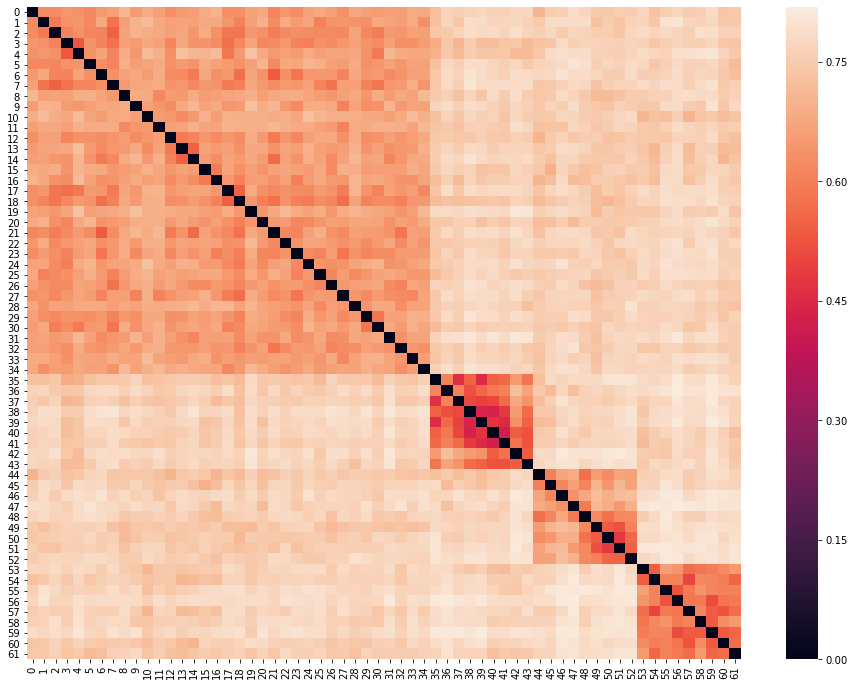

In [32]:
# mix5
plt.figure(figsize=(16, 12))
theta_test = models[3].transform(batch_vectorizer=test_batch_vectorizer)
dists = distance.squareform(distance.pdist(theta_test.T, metric=distance.jensenshannon))
heatmap(dists)

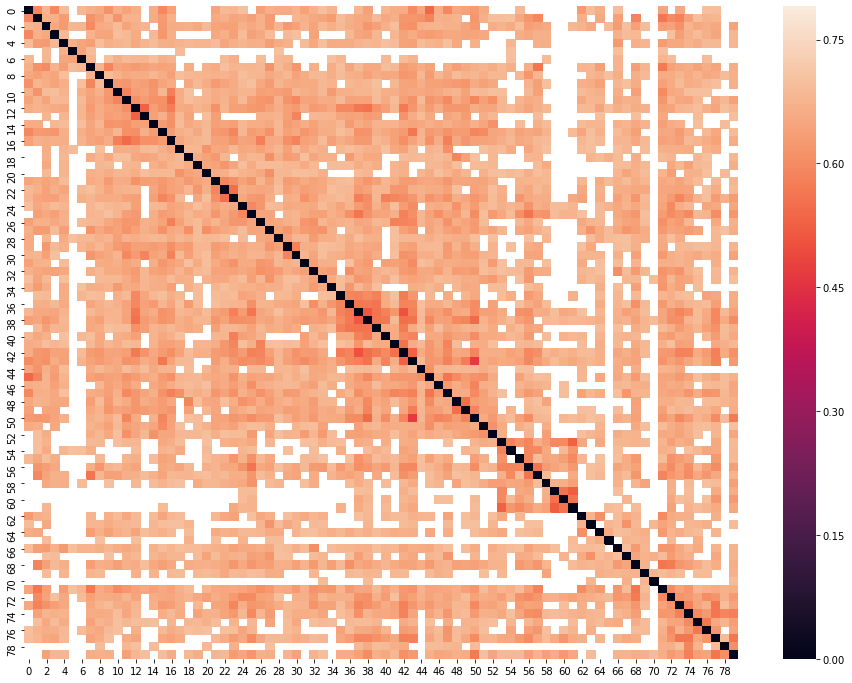

In [215]:
plt.figure(figsize=(16, 12))
theta_test = models[3].transform(batch_vectorizer=test_batch_vectorizer)
dists = distance.squareform(distance.pdist(theta_test.T, metric=distance.jensenshannon))
heatmap(dists, mask = dists > 0.7)

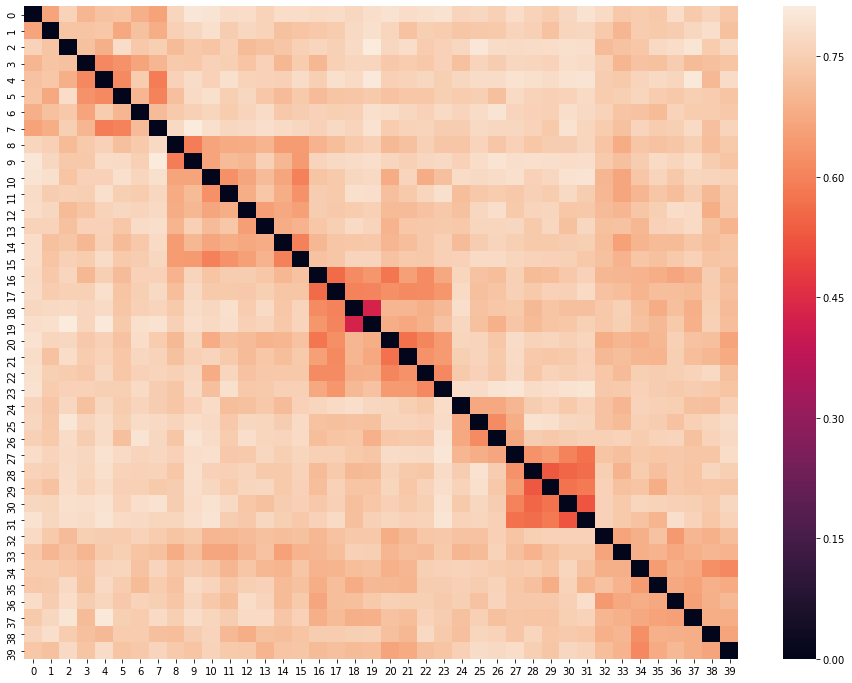

In [230]:
plt.figure(figsize=(16, 12))
theta_test = models[3].transform(batch_vectorizer=test_batch_vectorizer)
dists = distance.squareform(distance.pdist(theta_test.T, metric=distance.jensenshannon))
heatmap(dists)

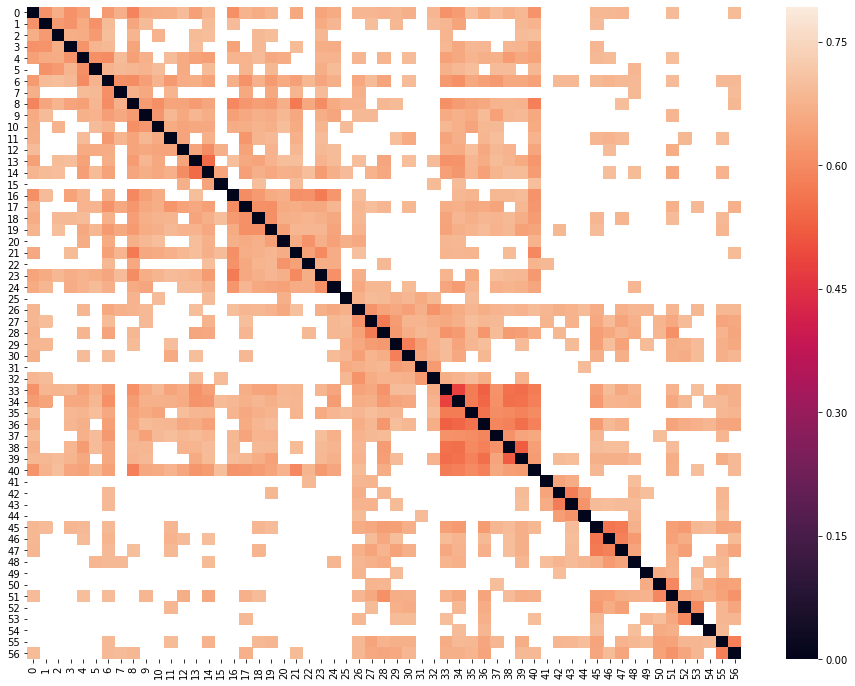

In [240]:
plt.figure(figsize=(16, 12))
theta_test = models[3].transform(batch_vectorizer=test_batch_vectorizer)
dists = distance.squareform(distance.pdist(theta_test.T, metric=distance.jensenshannon))
heatmap(dists, mask = dists > 0.7)

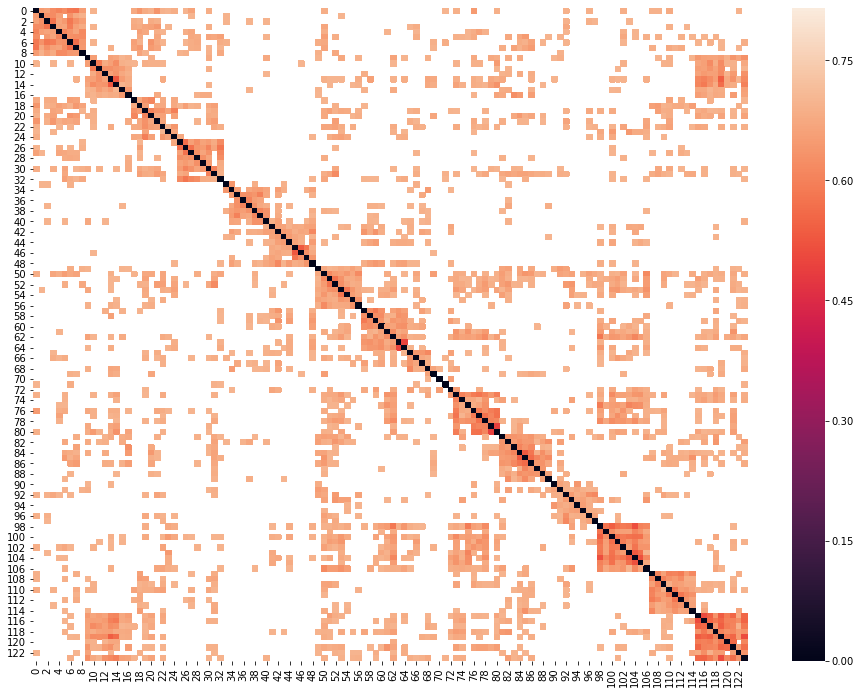

In [250]:
plt.figure(figsize=(16, 12))
theta_test = models[3].transform(batch_vectorizer=test_batch_vectorizer)
dists = distance.squareform(distance.pdist(theta_test.T, metric=distance.jensenshannon))
heatmap(dists, mask = dists > 0.7)

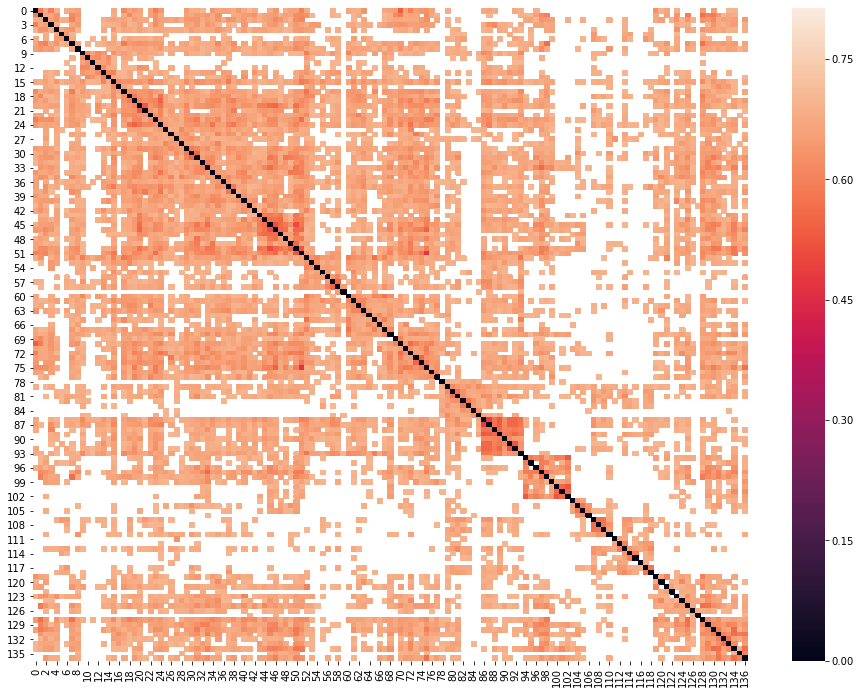

In [259]:
plt.figure(figsize=(16, 12))
theta_test = models[3].transform(batch_vectorizer=test_batch_vectorizer)
dists = distance.squareform(distance.pdist(theta_test.T, metric=distance.jensenshannon))
heatmap(dists, mask = dists > 0.7)

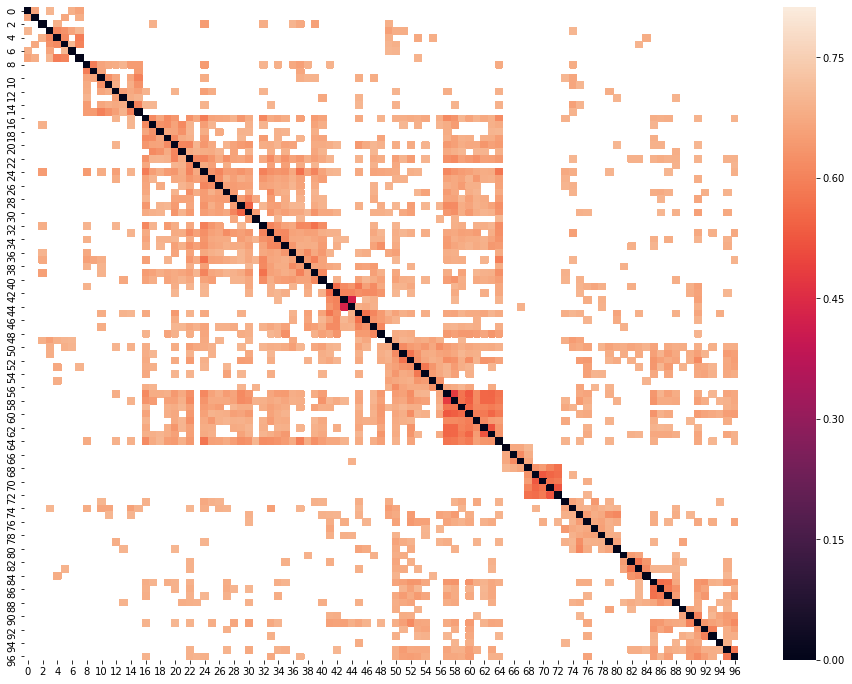

In [269]:
plt.figure(figsize=(16, 12))
theta_test = models[3].transform(batch_vectorizer=test_batch_vectorizer)
dists = distance.squareform(distance.pdist(theta_test.T, metric=distance.jensenshannon))
heatmap(dists, mask = dists > 0.7)

In [270]:
borders = pd.DataFrame(ids).groupby(1).agg({0: [np.min, np.max]})[0]

In [271]:
w_dists = np.zeros((len(borders), len(borders)))

In [272]:
for i, ii in enumerate(borders.index):
    for j, jj in enumerate(borders.index):
        x1, x2 = borders.loc[jj]
        y1, y2 = borders.loc[ii]
        w_dists[i, j] = np.mean(dists[x1: x2+1, y1:y2+1])

In [273]:
polka_catalog = pd.read_csv('collection_catalog_full_final.csv', sep=';', )[['book_title', 'fbusta_id']]

In [274]:
def get_theme(i):
    if i in derevnya:
        return 'der'
    if i in revolution:
        return 'rev'
    if i in love:
        return 'lov'
    return 1

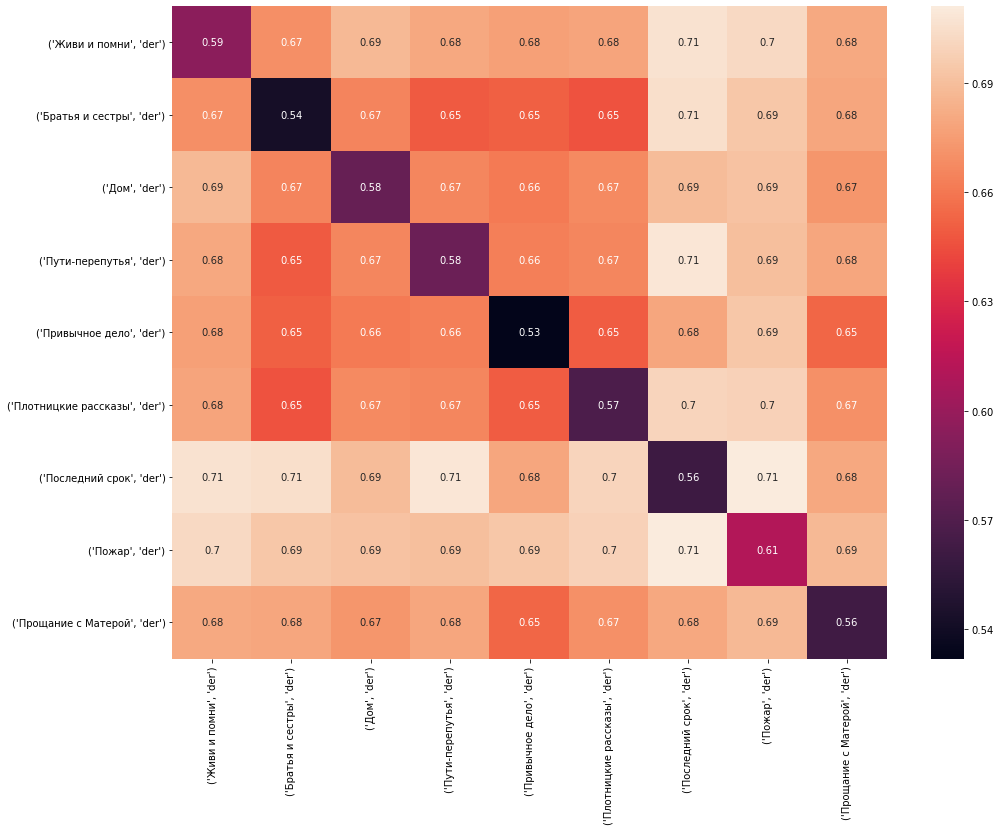

In [223]:
merged_labels = [
    (polka_catalog[polka_catalog['fbusta_id'] == int(i)]['book_title'].iloc[0], get_theme(i))
     for i in borders.index
]
plt.figure(figsize=(16, 12))
heatmap(w_dists, xticklabels=merged_labels, yticklabels=merged_labels, annot=True)

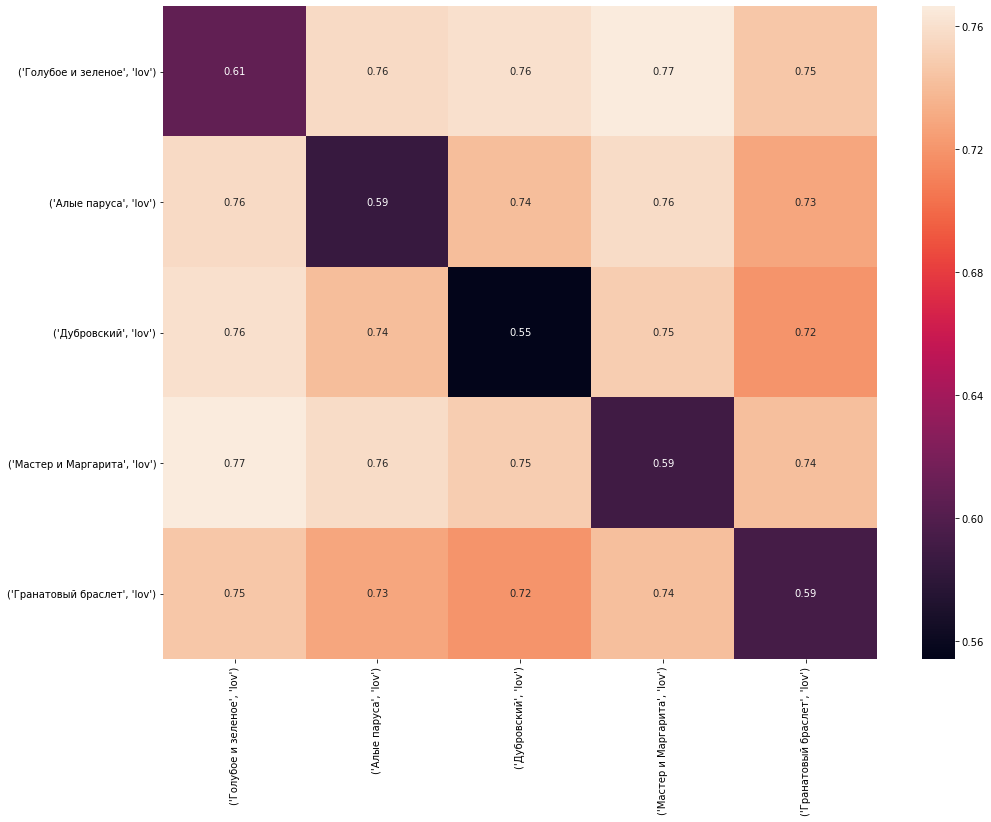

In [236]:
merged_labels = [
    (polka_catalog[polka_catalog['fbusta_id'] == int(i)]['book_title'].iloc[0], get_theme(i))
     for i in borders.index
]
plt.figure(figsize=(16, 12))
heatmap(w_dists, xticklabels=merged_labels, yticklabels=merged_labels, annot=True)

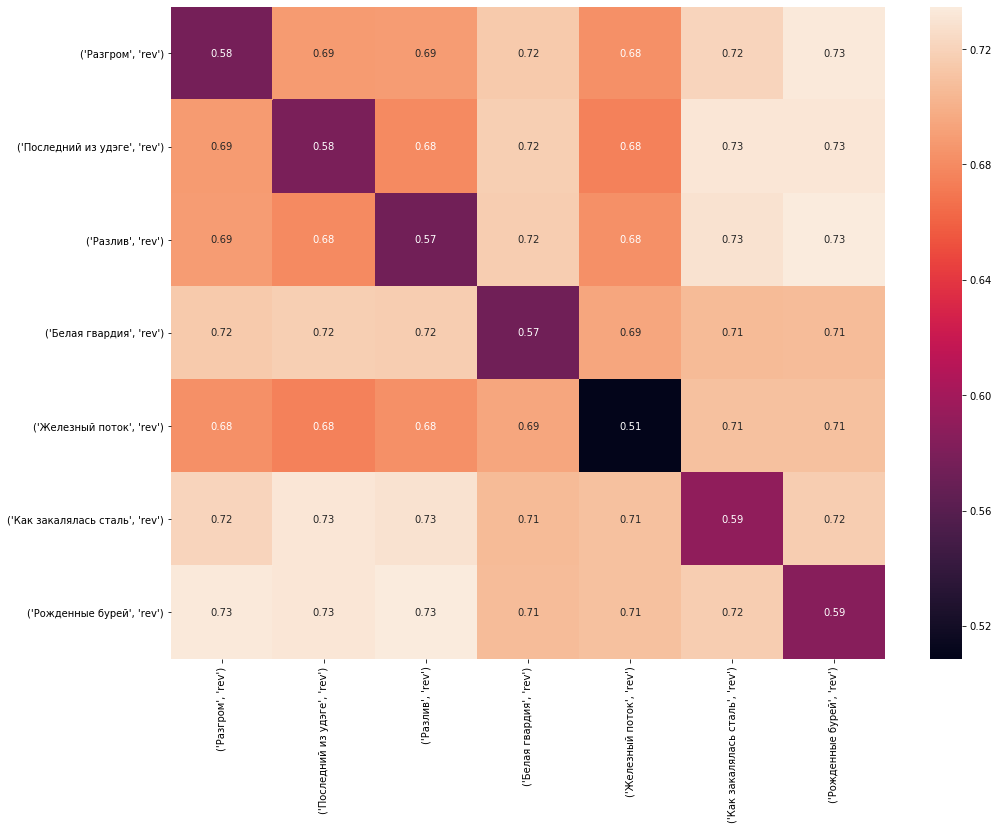

In [246]:
merged_labels = [
    (polka_catalog[polka_catalog['fbusta_id'] == int(i)]['book_title'].iloc[0], get_theme(i))
     for i in borders.index
]
plt.figure(figsize=(16, 12))
heatmap(w_dists, xticklabels=merged_labels, yticklabels=merged_labels, annot=True)

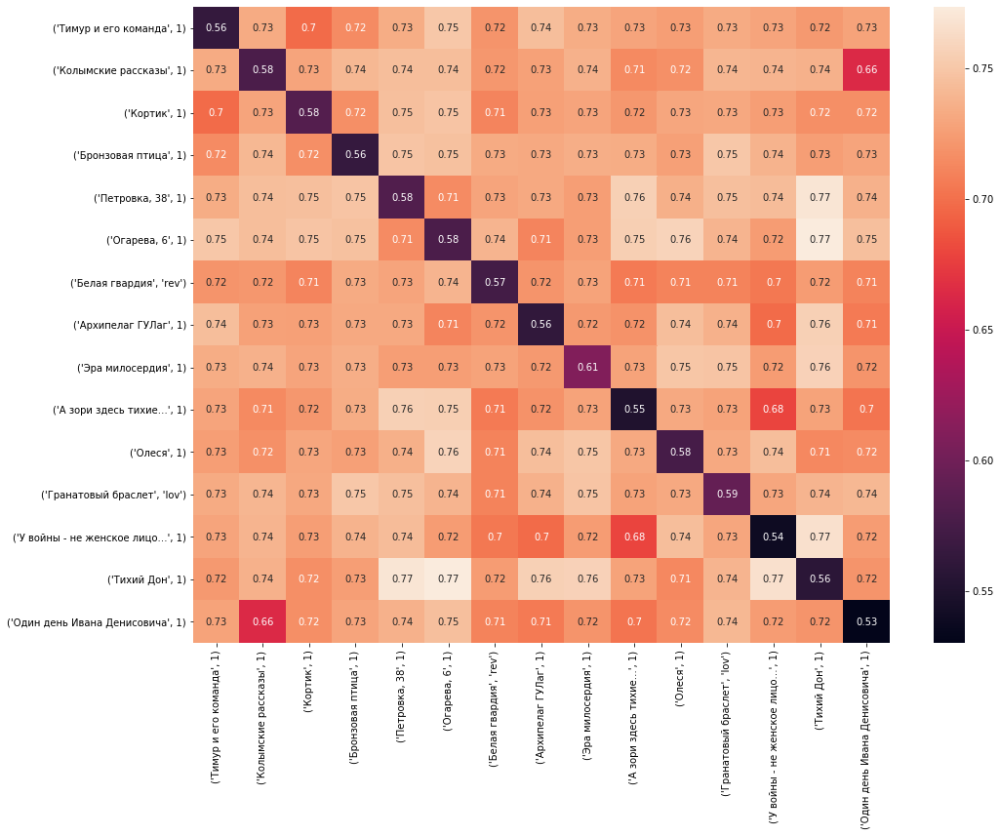

In [255]:
merged_labels = [
    (polka_catalog[polka_catalog['fbusta_id'] == int(i)]['book_title'].iloc[0], get_theme(i))
     for i in borders.index
]
plt.figure(figsize=(16, 12))
heatmap(w_dists, xticklabels=merged_labels, yticklabels=merged_labels, annot=True)

Тимур, кортик, бронзовая птица

петровка, огарева, эра милосердия

у войны не женское лицо, а зори здесь тихие

тихий дон, белая гвардия

гранатовый браслет, олеся

архипелаг, колымские рассказы, один день

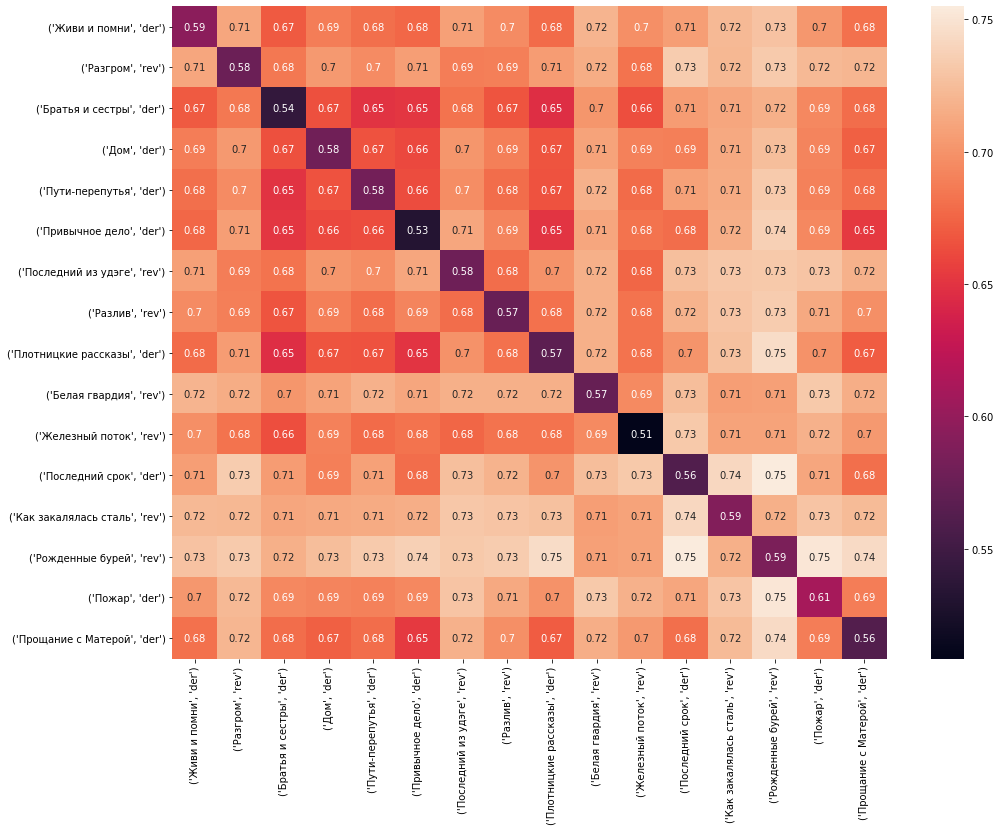

In [265]:
merged_labels = [
    (polka_catalog[polka_catalog['fbusta_id'] == int(i)]['book_title'].iloc[0], get_theme(i))
     for i in borders.index
]
plt.figure(figsize=(16, 12))
heatmap(w_dists, xticklabels=merged_labels, yticklabels=merged_labels, annot=True)

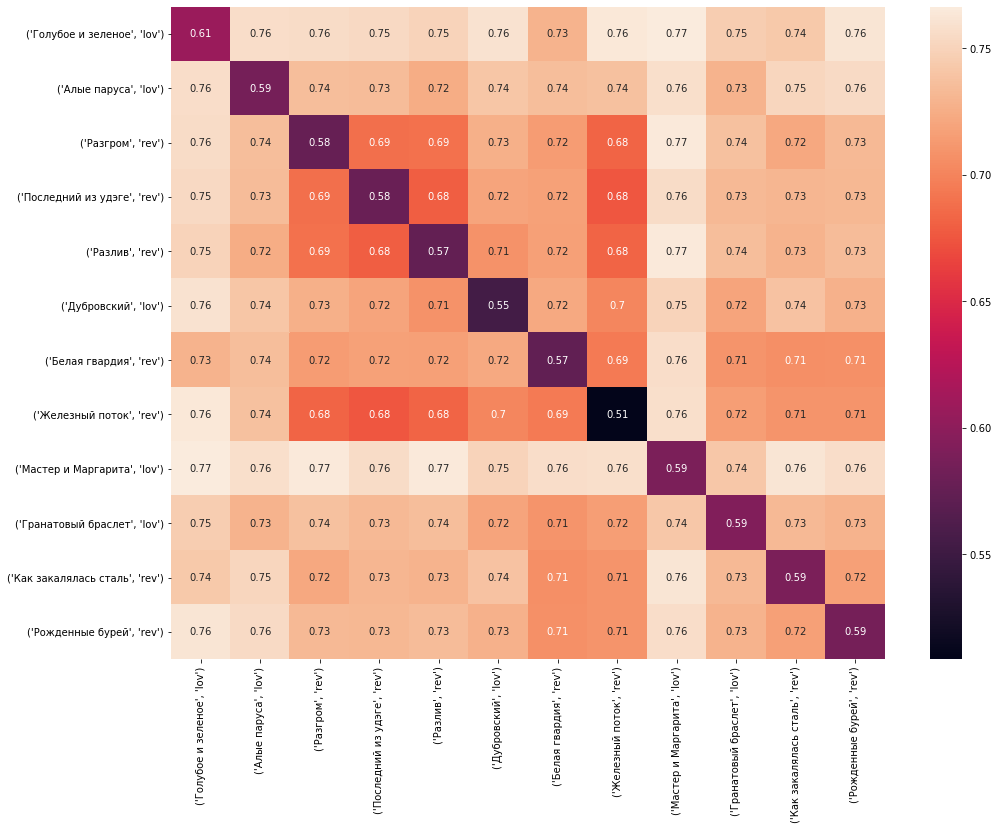

In [275]:
merged_labels = [
    (polka_catalog[polka_catalog['fbusta_id'] == int(i)]['book_title'].iloc[0], get_theme(i))
     for i in borders.index
]
plt.figure(figsize=(16, 12))
heatmap(w_dists, xticklabels=merged_labels, yticklabels=merged_labels, annot=True)

In [120]:
theta_canon = models[3].transform(batch_vectorizer=test_batch_vectorizer)
borders_canon = pd.DataFrame(ids).groupby(1).agg({0: [np.min, np.max]})[0]

In [116]:
theta_ridero = models[3].transform(batch_vectorizer=test_batch_vectorizer)
borders_ridero = pd.DataFrame(ids).groupby(1).agg({0: [np.min, np.max]})[0]

In [138]:
%%time
w_dists = np.zeros((len(borders_canon), len(borders_ridero)))
for i, ii in enumerate(borders_canon.index):
    for j, jj in enumerate(borders_ridero.index):
        x1, x2 = borders_ridero.loc[jj]
        y1, y2 = borders_canon.loc[ii]
        ridero_chunks = theta_ridero.T[x1: x2+1]
        canon_chunks = theta_canon.T[y1: y2+1]
        w_dists[i, j] = np.mean(distance.cdist(ridero_chunks, canon_chunks, metric=distance.jensenshannon))

CPU times: user 21.6 s, sys: 2.51 s, total: 24.1 s
Wall time: 16.8 s


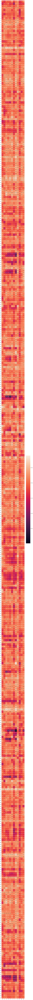

In [154]:
plt.figure(figsize=(8, 280))
heatmap(w_dists.T, annot=True)

In [170]:
for pair in np.argwhere(w_dists < 0.7):
    print(polka_catalog[polka_catalog['fbusta_id'] == int(borders_canon.iloc[pair[0]].name)]['book_title'].iloc[0], borders_canon.iloc[pair[0]].name, borders_ridero.iloc[pair[1]].name)

Разгром 153202 mne_est_chto_vam_skazat
Разгром 153202 raznocvete_detstva
Разгром 153202 skazki_10
Последний из удэге 181284 mne_est_chto_vam_skazat
Последний из удэге 181284 silvia
Последний из удэге 181284 skazki_10
Разлив 181286 mne_est_chto_vam_skazat
Разлив 181286 skazki_10
Разлив 181286 sonety_vilyama_shekspira
Разлив 181286 zhiteiskie_izmereniya
Дубровский 253788 silvia
Белая гвардия 261423 silvia
Белая гвардия 261423 zhiteiskie_izmereniya
Белая гвардия 261423 zhivaya_kniga_sprosonya_1
Железный поток 290867 iz_zhizni_zhenshiny
Железный поток 290867 izgnanie_igvy
Железный поток 290867 khakharyashki
Железный поток 290867 silvia
Железный поток 290867 skazki_10
Гранатовый браслет 67550 ne_boisya_zhit


In [276]:
borders_canon

,amin,amax
1,,
146717,0,7
151346,8,15
153202,16,23
181284,24,31
181286,32,40
253788,41,48
261423,49,56
290867,57,64
66372,65,72


In [174]:
np.argwhere(w_dists < 0.7)

array([[  2, 188],
       [  2, 319],
       [  2, 351],
       [  3, 188],
       [  3, 347],
       [  3, 351],
       [  4, 188],
       [  4, 351],
       [  4, 369],
       [  4, 464],
       [  5, 347],
       [  6, 347],
       [  6, 464],
       [  6, 465],
       [  7, 120],
       [  7, 121],
       [  7, 129],
       [  7, 347],
       [  7, 351],
       [  9, 206]])

In [169]:
pair

206

In [25]:
from scipy.spatial import distance

In [24]:
models = []
for i in range(1, 8):
    models.append(artm.load_artm_model(f'S_topics_{i}00'))

artm.ARTM(num_topics=100, num_tokens=32133)

In [679]:
processed_chunks = [' '.join(w for w in chunk.split(' ') if w in df.keys()) for chunk in chunks]

In [707]:
i = 0
n = 2
theta_test = models[n].transform(batch_vectorizer=test_batch_vectorizer)
print(processed_chunks[i])
for top, val in theta_test[i][theta_test[i] > 0].sort_values(ascending=False).items():
    print(f'{top}*{round(val, 4)}: ', end='')
    tokens = models[n].score_tracker['TopTokensScore10'].last_tokens[top]
    print(' '.join(tokens))

поместье раб июль год анна фрейлина императрица князь вечер анна день грипп грипп слово записочка утро красный лакей различие весь встреча князь придворный мундир чулок башмак звезда выражение лицо язык дед интонация свет двор человек анна рука лысина диван голос тон приличие участие равнодушие насмешка чувство время анна весь вечер праздник посланник середа князь дочь праздник знать праздник князь привычка часы вещь князь тон князь актер роль анна год оживление порыв энтузиастка положение ожидание человек знать энтузиастка улыбка лицо анна черта ребенок сознание милый недостаток мочь середина разговор политический действие анна австрия мочь австрия война россия спасительница европа благодетель знать призвание государь роль мир бог призвание гидра революция лицо убийца злодей кровь праведник англия дух мочь весь высота душа император мальта мысль действие мочь самоотвержение император весь благо мир пруссия весь европа мочь слово бог судьба милый император европа улыбка насмешка горячн

In [16]:
from seaborn import heatmap

In [678]:
models[5].get_score('PerplexityScore')

value: 2.1164228916168213
raw: -6747.546516907016
normalizer: 9000.0
zero_words: 0

In [346]:
models[-1].phi_['topic_1'].sort_values()

(@default_class, приозерье)       0.000000
(@default_class, оппозиционер)    0.000000
(@default_class, капитолий)       0.000000
(@default_class, подстраховка)    0.000000
(@default_class, бравада)         0.000000
                                    ...   
(@default_class, январь)          0.070956
(@default_class, апрель)          0.080211
(@default_class, октябрь)         0.080445
(@default_class, июнь)            0.090078
(@default_class, май)             0.122073
Name: topic_1, Length: 32133, dtype: float32

In [94]:
# OLD
for topic, words in models[-1].score_tracker['TopTokensScore10'].last_tokens.items():
    print('{0}: {1}\n'.format(topic, ' '.join(words)))

topic_0: голова нога рука тыкать мужичок сапог верзила размах дубина давать

topic_1: год фон германия март май сентябрь июнь день июль октябрь

topic_2: слово няня говорить дополнение ударение олух знать черточка сказать глагол

topic_3: убивать ярость угрожать рука сделать похищать смочь проклятие знать голос

topic_4: герой м е н д э г п л читатель

topic_5: ветер песок пещера порыв буря дуть пропасть скала гребень воздух

topic_6: принц принцесса высочество дворянин баронесса наследница паж регент становиться время

topic_7: ким мат стройка з козырь блядь гиря баррикада дебил дефицит

topic_8: рассказ писатель автор литература год толстой читатель сочинение повесть жизнь

topic_9: автомобиль шофер выезжать банкир лимузин швейцар владелец расписка таможня салон

topic_10: француз стрелка стрелок ион коротышка шарп янки донна ранец пончик

topic_11: бить посол посольство леший нечисть царевич диво посыльный домовой давать

topic_12: выражение лицо тон замечание взгляд извинение завещ

In [133]:
%%time
model.fit_offline(batch_vectorizer=batch_vectorizer, num_collection_passes=30)

CPU times: user 10h 24min 39s, sys: 1min 43s, total: 10h 26min 23s
Wall time: 1h 28min 22s


In [135]:
for topic, words in model.score_tracker['TopTokensScore10'].last_tokens.items():
    print('{0}: {1}\n'.format(topic, ' '.join(words)))

topic_0: рубаха морда чуять голова бес нога тыкать размах парнишка лезть

topic_1: фон год германия март май сентябрь июнь июль октябрь апрель

topic_2: правда возражать соглашаться сказать думать расстраивать обедать присматривать няня пообедать

topic_3: голос услышать ярость прозвучать рука проклятие выкрикивать звучать обертываться слово

topic_4: герой м стих т е автор поэт н д читатель

topic_5: ветер песок скала пещера пустыня порыв буря дуть облако горизонт

topic_6: принц принцесса высочество баронесса наследница претендент этикет паж регент олух

topic_7: пара место оставаться случай оказываться умудряться смена начинать приходиться стоить

topic_8: писать писатель литература строка сочинять написать пушкин толстой сочинение повесть

topic_9: автомобиль владелец выезжать шофер возить ездить компаньон лимузин миллионер проезд

topic_10: англия франция европа англичанин француз индия шарп портной европеец соотечественник

topic_11: давать поза приветствие становиться знать хлоп

In [131]:
# perpl.append(model.score_tracker['PerplexityScore'].value)
# coh.append(model.score_tracker['TopTokensScore10'].average_coherence)
for topic, words in model.score_tracker['TopTokensScore10'].last_tokens.items():
    print('{0}: {1}\n'.format(topic, ' '.join(words)))

topic_0: лезть дружок чуять норовить бес тыкать размах скотина голова мужичок

topic_1: год фон го германия март май сентябрь июнь июль октябрь

topic_2: обед расстраивать обедать присматривать няня пообедать сказать думать знать день

topic_3: голос услышать обертываться прозвучать рука звучать выкрикивать слово выход договаривать

topic_4: герой м автор стих т е н поэт д читатель

topic_5: ветер песок скала пещера пустыня порыв буря дуть пропасть край

topic_6: принц принцесса высочество карла баронесса наследница претендент этикет паж регент

topic_7: пара умудряться оставаться случай оказываться место итог приходиться тройка начинать

topic_8: писать писатель литература строка сочинять пушкин толстой перевод сочинение повесть

topic_9: ехать автомобиль владелец ездить выезжать шофер компаньон лимузин проезд миллионер

topic_10: француз ион икра соотечественник национальность метать лох щука иня устрица

topic_11: поза давать путать хлопок перекидываться диво встревать клеймо домово

In [134]:
model.score_tracker['TopTokensScore10'].average_coherence

[0.0009551530238240957,
 0.0009533704142086208,
 0.0009606506209820509,
 0.0009878980927169323,
 0.0010254781227558851,
 0.0012694139732047915,
 0.002666645683348179,
 0.0055094752460718155,
 0.008314895443618298,
 0.010753035545349121,
 0.01390349306166172,
 0.016795875504612923,
 0.02094307914376259,
 0.023141445592045784,
 0.026224810630083084,
 0.030198942869901657,
 0.032746173441410065,
 0.03580622747540474,
 0.03793976828455925,
 0.04033055156469345,
 0.042243801057338715,
 0.04345589131116867,
 0.0447382926940918,
 0.04632438346743584,
 0.04701582342386246,
 0.04753193259239197,
 0.04970892518758774,
 0.05011693388223648,
 0.050583790987730026,
 0.05143453925848007]

In [129]:
model.score_tracker['TopTokensScore10'].average_coherence

[0.0009394246153533459,
 0.0009672196465544403,
 0.0009866423206403852,
 0.0010098282946273685,
 0.001078560366295278,
 0.0015042071463540196,
 0.0030777554493397474,
 0.006244184449315071,
 0.009226840920746326,
 0.011757904663681984,
 0.014271067455410957,
 0.019399533048272133,
 0.022185858339071274,
 0.02689562365412712,
 0.02925117127597332,
 0.03231131657958031,
 0.03590751066803932,
 0.03735373914241791,
 0.03965722769498825,
 0.041970137506723404,
 0.04393783211708069,
 0.044117845594882965,
 0.04636969417333603,
 0.048944856971502304,
 0.04927607625722885,
 0.050654903054237366,
 0.05241487920284271,
 0.05312206968665123,
 0.05396939814090729,
 0.05424996092915535]

Text(0, 0.5, 'Perplexity')

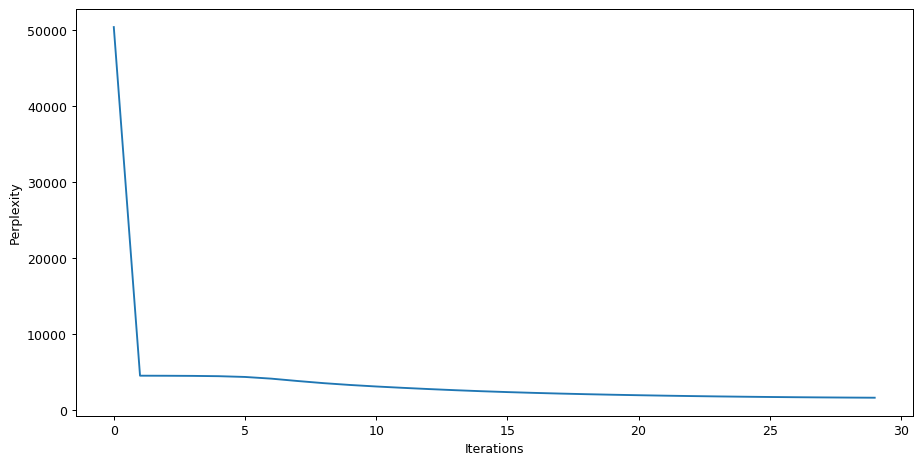

In [128]:
plt.figure(figsize=(12,6),dpi=90)
plt.plot(range(model.num_phi_updates), model.score_tracker['PerplexityScore'].value)
plt.xlabel('Iterations')
plt.ylabel('Perplexity')

Text(0, 0.5, 'Coherence')

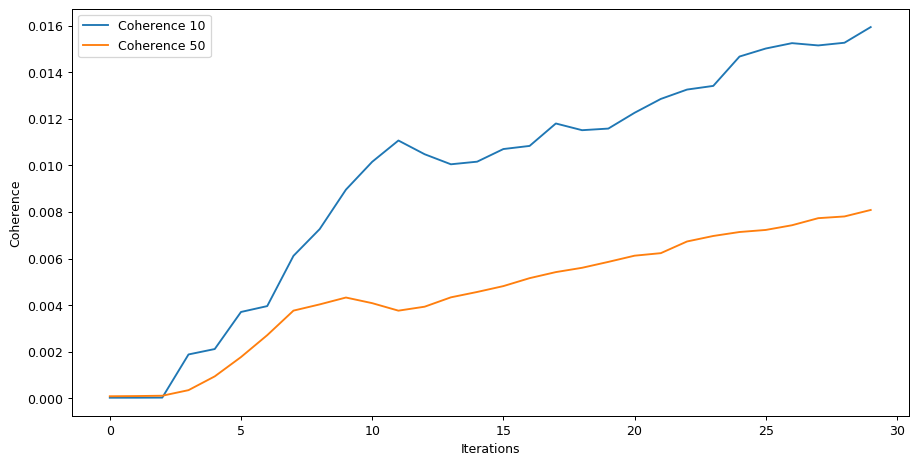

In [87]:
plt.figure(figsize=(12,6),dpi=90)
plt.plot(range(model.num_phi_updates),
         model.score_tracker['TopTokensScore10'].average_coherence, 
         label="Coherence 10")
plt.plot(range(model.num_phi_updates),
         model.score_tracker['TopTokensScore30'].average_coherence, 
         label="Coherence 30")
plt.legend(loc='best')
plt.xlabel('Iterations')
plt.ylabel('Coherence')

In [88]:
for topic, words in model.score_tracker['TopTokensScore10'].last_tokens.items():
    print('{0}: {1}\n'.format(topic, ' '.join(words)))

topic_0: будто опять видно хоть ганс земля глядеть ходить вода лежать

topic_1: русский москва николай россия советский никита коля владимир володя московский

topic_2: ребенок мать жена женщина муж сын любовь любить няня отец

topic_3: император империя власть война город рим военный армия столица римский

topic_4: книга роман мир история век автор народ г общество литература

topic_5: снег гора вершина ветер горный склон высота пещера снежный скала

topic_6: ваш дама супруга юлия мина женщина деньги любовь скромный обстоятельство

topic_7: однако таять лишь ваш таить находиться именно возможно поскольку происходить

topic_8: старик папаша белый улица лебедь ночь писать будто эл пить

topic_9: парень джимми деньги город стол улица девушка работать карлос машина

topic_10: павел иванович федор алексеевич клим володька ленька стол окно глядеть

topic_11: вообще таки причем хоть кстати вполне получаться впрочем вопрос вроде

topic_12: письмо роман ваш деньги имя сумма вопрос рассказывать

In [89]:
model.save(filename='plain_fiction_batches/saved_p_wt', model_name='p_wt')
model.save(filename='plain_fiction_batches/saved_n_wt', model_name='n_wt')

In [90]:
del model
gc.collect()

5483

In [91]:
%%time
regularizers_list = []
regularizers_list += [artm.SmoothSparsePhiRegularizer(name='SPPhiNgrammReg', tau=1)]
regularizers_list += [artm.SmoothSparseThetaRegularizer(name='SmoothThetaReg', tau=1)]
regularizers_list += [artm.ImproveCoherencePhiRegularizer(name='CoherenceReg', tau=10)]

scores_list = []
scores_list += [artm.PerplexityScore(name='PerplexityScore')]
scores_list += [artm.TopTokensScore(name='TopTokensScore10',
                                    num_tokens=10, 
                                    dictionary=cooc_dict)]
scores_list += [artm.TopTokensScore(name='TopTokensScore30',
                                    num_tokens=30, 
                                    dictionary=cooc_dict)]

model = artm.ARTM(num_topics=200,
                  dictionary=dictionary,
                  regularizers=regularizers_list,
                  scores=scores_list,
                  num_document_passes=5)

model.fit_offline(batch_vectorizer=batch_vectorizer, num_collection_passes=30)

CPU times: user 5h 53min 56s, sys: 48.4 s, total: 5h 54min 44s
Wall time: 53min 42s


Text(0, 0.5, 'Coherence')

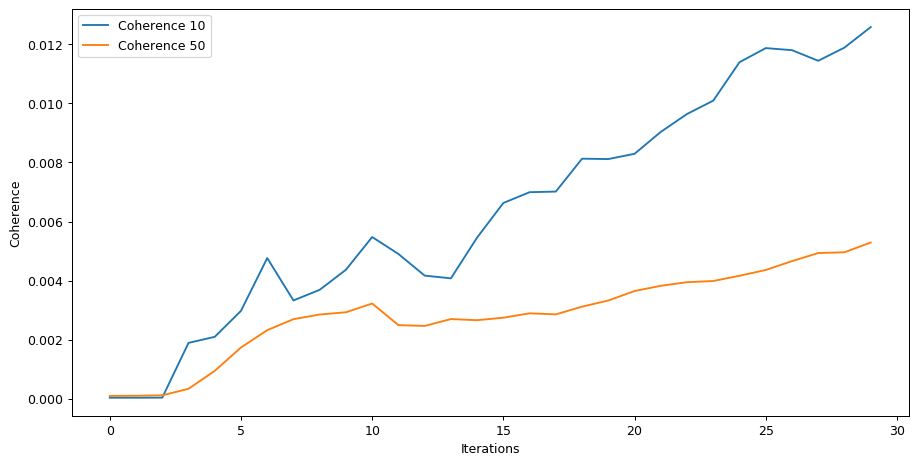

In [92]:
plt.figure(figsize=(12,6),dpi=90)
plt.plot(range(model.num_phi_updates),
         model.score_tracker['TopTokensScore10'].average_coherence, 
         label="Coherence 10")
plt.plot(range(model.num_phi_updates),
         model.score_tracker['TopTokensScore30'].average_coherence, 
plt.legend(loc='best')
plt.xlabel('Iterations')
plt.ylabel('Coherence')

In [93]:
for topic, words in model.score_tracker['TopTokensScore10'].last_tokens.items():
    print('{0}: {1}\n'.format(topic, ' '.join(words)))

topic_0: старик будто хоть опять глядеть чуть пусть живой видно словно

topic_1: николай никита володя владимир георгий мамаша академик утро константинович любить

topic_2: мать женщина ребенок жена сын любовь отец молодой муж любить

topic_3: император империя дон ваш господин власть столица легион однако императорский

topic_4: г наука мир общество история век народ н д страна

topic_5: тело лишь сознание словно ощущать стена кожа снова мгновение чувствовать

topic_6: ваш жена любовь женщина жорж деньги хоть считать вопрос просить

topic_7: судья однако суд ваш лишь затем находиться именно слишком честь

topic_8: пушкин старик улица белый чтоб пить опять ночь окно гоголь

topic_9: аврора стол вообще деньги именно поэтому немного девушка момент происходить

topic_10: павел федор клим август иванович опять стол вода участковый про

topic_11: вообще таки хоть всякий вроде причем чуть вопрос равный получаться

topic_12: ваш деньги вопрос имя вульф именно вечер женщина письмо разговор

to

In [94]:
len(os.listdir('ridero_books'))

493

In [ ]:
import 